In [1]:
import os
from pathlib import Path
from datetime import datetime
import pickle
import random
import math
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, MaxAbsScaler, MinMaxScaler

import torch
import torch.nn as nn
import torch.nn.functional as F


def _find_cnn_root():
    here = Path.cwd().resolve()
    for p in [here, *here.parents]:
        if (p / "data" / "XRPUSDT-1h-data.csv").is_file():
            return p
        cand = p / "CNN_XRP" / "data" / "XRPUSDT-1h-data.csv"
        if cand.is_file():
            return (p / "CNN_XRP").resolve()
    return here


CNN_ROOT = _find_cnn_root()
ARTIFACTS = CNN_ROOT / "artifacts"
ARTIFACTS.mkdir(parents=True, exist_ok=True)
DATA_CSV = CNN_ROOT / "data" / "XRPUSDT-1h-data.csv"
ARCH_MANIFEST_KEY = "lstm"

os.makedirs("models", exist_ok=True)

def set_all_seeds(seed):
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)

seed = 0
set_all_seeds(seed)



In [2]:
df = pd.read_csv(DATA_CSV)
print(df)


                 timestamp     open     high      low    close      volume
0      2018-05-15 19:00:00  0.69898  0.70020  0.68733  0.69559   794558.59
1      2018-05-15 20:00:00  0.69370  0.70490  0.69105  0.69901   460781.81
2      2018-05-15 21:00:00  0.70000  0.70100  0.69501  0.69501   204493.99
3      2018-05-15 22:00:00  0.69502  0.69822  0.68010  0.68616   568762.54
4      2018-05-15 23:00:00  0.68600  0.69686  0.68342  0.68900   286983.39
...                    ...      ...      ...      ...      ...         ...
68995  2026-04-02 06:00:00  1.31520  1.31860  1.31240  1.31570  4112907.90
68996  2026-04-02 07:00:00  1.31570  1.31830  1.31290  1.31760  3341362.20
68997  2026-04-02 08:00:00  1.31750  1.31760  1.31120  1.31190  4172306.80
68998  2026-04-02 09:00:00  1.31180  1.31290  1.30790  1.31180  4386516.00
68999  2026-04-02 10:00:00  1.31180  1.31210  1.30730  1.30880  2163609.60

[69000 rows x 6 columns]


**Check missing values**

In [3]:
print(df.isnull())
print(f"Counts how many missing values there are in each column: {df.isnull().sum()}")
print(f"Total missing values: {df.isnull().sum().sum()}")

       timestamp   open   high    low  close  volume
0          False  False  False  False  False   False
1          False  False  False  False  False   False
2          False  False  False  False  False   False
3          False  False  False  False  False   False
4          False  False  False  False  False   False
...          ...    ...    ...    ...    ...     ...
68995      False  False  False  False  False   False
68996      False  False  False  False  False   False
68997      False  False  False  False  False   False
68998      False  False  False  False  False   False
68999      False  False  False  False  False   False

[69000 rows x 6 columns]
Counts how many missing values there are in each column: timestamp    0
open         0
high         0
low          0
close        0
volume       0
dtype: int64
Total missing values: 0


**Split data**

In [4]:
TRAIN_BARS = 9000
VAL_BARS = 1500
HOLDOUT_BARS = 6000
L = len(df)
min_rows = TRAIN_BARS + VAL_BARS + HOLDOUT_BARS
assert L >= min_rows, f"need at least {min_rows} rows, got {L}"
total_rows = L
val_end = L - HOLDOUT_BARS
train_end = val_end - VAL_BARS
train_start = train_end - TRAIN_BARS
TRAIN_START = train_start
TRAIN_END = train_end
VAL_END = val_end
assert 0 <= TRAIN_START < TRAIN_END < VAL_END <= L, f"{TRAIN_START=} {TRAIN_END=} {VAL_END=} len(df)={L}"

df_train = df.iloc[TRAIN_START:TRAIN_END].copy()
df_val = df.iloc[TRAIN_END:VAL_END].copy()

print(f"Train rows [{TRAIN_START}:{TRAIN_END}]: {len(df_train)}")
print(f"Val rows   [{TRAIN_END}:{VAL_END}]: {len(df_val)} (equity + checkpoints; not holdout)")
print(f"Holdout    [{VAL_END}:] reserved for CNN/backtest (not used in this notebook)")



Train rows [52500:61500]: 9000
Val rows   [61500:63000]: 1500 (equity + checkpoints; not holdout)
Holdout    [63000:] reserved for CNN/backtest (not used in this notebook)


**Building Meaningful Features**

In [5]:
def build_features(opens, highs, lows, closes, volumes, train_scalers=None):

    # Build features
    feature1 = (closes - opens) / opens
    feature2 = (highs - opens) / opens
    feature3 = (highs - closes) / closes
    feature4 = (lows - opens) / opens
    feature5 = (lows - closes) / closes
    feature6 = (highs - lows) / opens
    feature7 = (highs - lows) / closes
    feature8 = volumes

    # Stack features
    features = [
        feature1,
        feature2,
        feature3,
        feature4,
        feature5,
        feature6,
        feature7,
        feature8,
    ]
    num_features = len(features)
    scaled_fts = []

    if train_scalers is None:
        train_scalers = [MaxAbsScaler() for _ in range(num_features)]
        is_train = True
    else:
        is_train = False

    for i in range(num_features):
        # Get train scaler
        scaler = train_scalers[i]
        if is_train:
            # Scaler -> Fit -> Train dataset
            scaled_ft = scaler.fit_transform(features[i].reshape(-1, 1))
            # Save the train scaler in a list
        elif not is_train:
            # Scaler -> NOT Fit -> Test dataset
            scaled_ft = scaler.transform(features[i].reshape(-1, 1))

        # Update list of SCALED features
        scaled_fts.append(scaled_ft.flatten())

    # Stack features
    scaled_features = np.stack(scaled_fts, axis=-1)

    # Get num. features
    num_features = scaled_features.shape[-1]
    return scaled_features, num_features, train_scalers

**Example of how the scaler works**

In [6]:
import numpy as np
from sklearn.preprocessing import MaxAbsScaler

# Suppose we have a simple 1D array (e.g. daily returns)
X = np.array([ -2, -1, 0, 1, 2 ])

print("Original data:", X)

# Step 1: reshape into 2D (because sklearn expects shape (n_samples, n_features))
X_2d = X.reshape(-1, 1)

# Step 2: create the scaler and fit_transform
scaler = MaxAbsScaler()
X_scaled = scaler.fit_transform(X_2d)

# Step 3: flatten back to 1D for convenience
X_scaled = X_scaled.flatten()

print("Scaled data:", X_scaled)


Original data: [-2 -1  0  1  2]
Scaled data: [-1.  -0.5  0.   0.5  1. ]


**Preprocess data**

In [7]:
def preprocess_data(seq_len, df, train_scalers=None):
    m = len(df)

    opens = np.array(df['open'].values)
    highs = np.array(df['high'].values)
    lows = np.array(df['low'].values)
    closes = np.array(df['close'].values)
    volumes = np.array(df['volume'].values)

    # Build features
    features, num_features, train_scalers = build_features(opens, highs, lows, closes, volumes, train_scalers)

    # Calculate number of samples
    num_samples = m - seq_len

    # Create storage for inputs & targets
    X = np.zeros([num_samples, seq_len, num_features], dtype=np.float32)
    Y = np.zeros([num_samples, num_features], dtype=np.float32)

    # Create samples (X, Y)
    for i in range(num_samples):
        X[i] = features[i : i+seq_len]
        Y[i] = features[i+seq_len : i+seq_len+1]

    # Fix alignment
    opens = np.array(opens[seq_len:])
    closes = np.array(closes[seq_len:])

    return X, Y, num_features, opens, closes, train_scalers

In [8]:
# Sequence Length
seq_len = 48

# Preprocess data (fit scalers on train only; transform val slice for epoch equity)
X_train, Y_train, num_features, _, _, train_scalers = preprocess_data(seq_len, df_train)
X_val, Y_val, num_features, val_opens, val_closes, _ = preprocess_data(seq_len, df_val, train_scalers)



In [9]:
m_train = X_train.shape[0]
m_val = X_val.shape[0]
print(f"m_train: {m_train}")
print(f"m_val: {m_val}")
print(f"X_train shape: {X_train.shape}")
print(f"Y_train shape: {Y_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"Y_val shape: {Y_val.shape}")


m_train: 8952
m_val: 1452
X_train shape: (8952, 48, 8)
Y_train shape: (8952, 8)
X_val shape: (1452, 48, 8)
Y_val shape: (1452, 8)


**Transform data to Torch Tensor**

In [10]:
device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')
print("my deive: ", device)

X_train = torch.from_numpy(X_train.astype(np.float32)).to(device, dtype=torch.float32)
Y_train = torch.from_numpy(Y_train.astype(np.float32)).to(device, dtype=torch.float32)

X_val = torch.from_numpy(X_val.astype(np.float32)).to(device, dtype=torch.float32)
Y_val = torch.from_numpy(Y_val.astype(np.float32)).to(device, dtype=torch.float32)

Y_pred_val = torch.zeros([m_val, num_features], device=device, dtype=torch.float32)


my deive:  cuda:0


**Build model**

In [11]:
class Model(nn.Module):
    def __init__(self):
        super().__init__()

        # LSTM
        self.lstm = nn.LSTM(input_size=num_features,
                            hidden_size=64,
                            num_layers=1,
                            batch_first=True)

        # Output layer
        self.fc_out = nn.Linear(64, num_features)

    def forward(self, x):
        # LSTM
        x, (h_n, c_n) = self.lstm(x)
        x = x[:, -1, :] 

        # Output layer
        x = self.fc_out(x)
        return x



**Initialization**

In [12]:
# Initialize model
model = Model()

# Transfer model to device
model.to(device)

# Initialize criterion
criterion = nn.MSELoss()

# Choose learning rate
lr = 1e-4

# Create optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

# Choose batch size
batch_size = 32

# Lists of train/test losses
train_losses = []
test_losses = []

equity_epochs = []
accuracy_epochs = []

# Set epoch
num_epochs = 250



In [13]:
def create_minibatches(X, Y, batch_size, seed, shuffle=True):

    mini_batches = []
    m = len(X)
    if shuffle:
        permutation = list(np.random.permutation(m))
        X = X[permutation]
        Y = Y[permutation]
    num_batches = m // batch_size
    for k in range(num_batches):
        mb_X = X[k * batch_size : k * batch_size + batch_size]
        mb_Y = Y[k * batch_size : k * batch_size + batch_size]
        mb_pair = (mb_X, mb_Y)
        mini_batches.append(mb_pair)

    seed += 1
    set_all_seeds(seed)

    return mini_batches, seed

**Load model (if available)**

In [14]:
def load_training_data(model, optimizer):
    checkpoint = torch.load('training_process', weights_only=False)
    epoch = checkpoint['epoch']
    train_losses = checkpoint['train_losses']
    test_losses = checkpoint['test_losses']
    equity_epochs = checkpoint['equity_epochs']
    accuracy_epochs = checkpoint['accuracy_epochs']
    seed = checkpoint['seed']

    # Load model's weights & optimizer's state
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    return model, optimizer, epoch, train_losses, test_losses, equity_epochs, accuracy_epochs, seed


if os.path.exists("training_process"):
    model, optimizer, epoch, train_losses, test_losses, equity_epochs, accuracy_epochs, seed = load_training_data(model, optimizer)
    print(f"Loaded model!")
else:
    print(f"No training process to load.")
    epoch = 0

No training process to load.


**Train model**

Epoch: 0, Equity: 1312.03, Accuracy: 51.03 train_losses: 0.003910119385136405, test_losses: 0.0011184547329321504, Duration: 0:00:01.427001


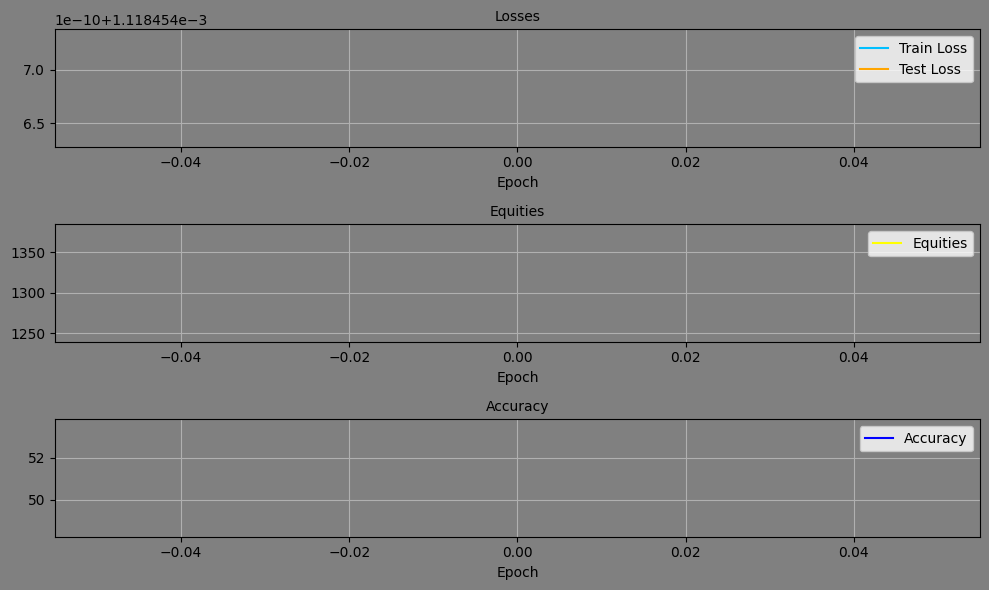

Epoch: 1, Equity: 1200.30, Accuracy: 50.55 train_losses: 0.0023962066374889385, test_losses: 0.0009309763554483652, Duration: 0:00:01.155698


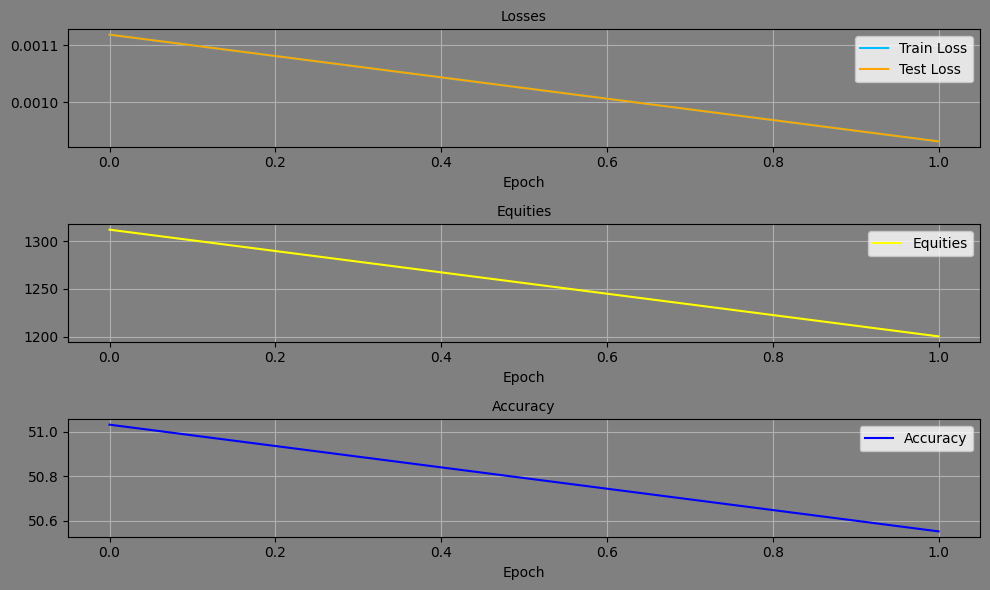

Epoch: 2, Equity: 1041.95, Accuracy: 49.38 train_losses: 0.002212654395941912, test_losses: 0.0008996232645586133, Duration: 0:00:01.158737


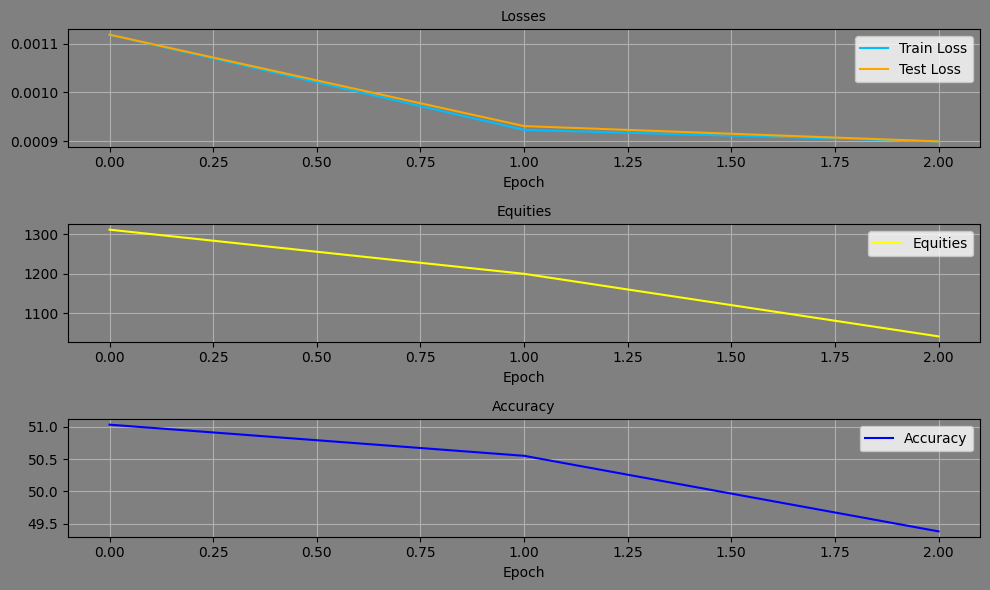

Epoch: 3, Equity: 947.31, Accuracy: 49.38 train_losses: 0.00218360639414266, test_losses: 0.0008923997520469129, Duration: 0:00:01.255316


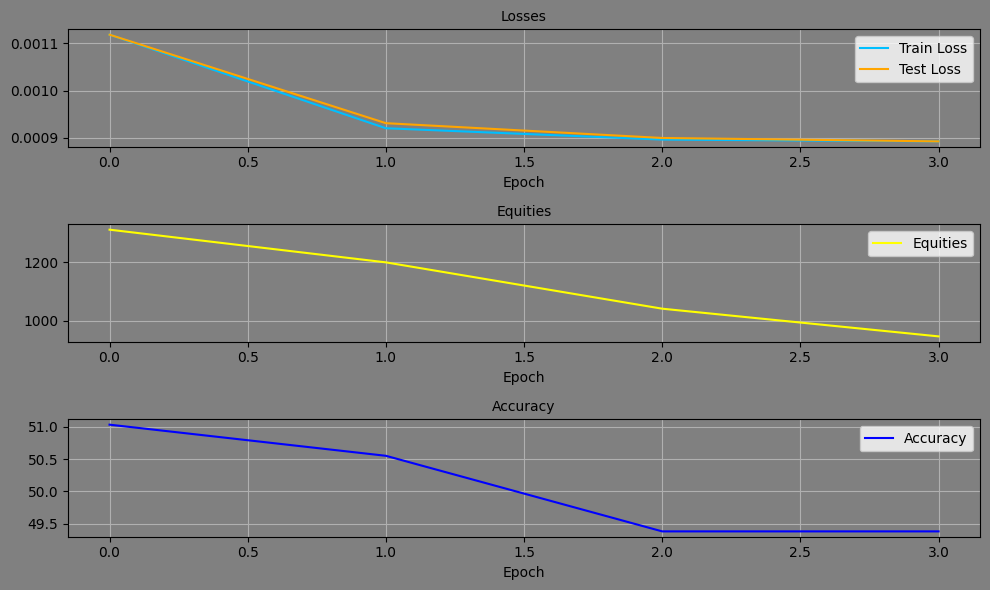

Epoch: 4, Equity: 601.74, Accuracy: 48.42 train_losses: 0.0021651649505891385, test_losses: 0.0008920530672185123, Duration: 0:00:01.351311


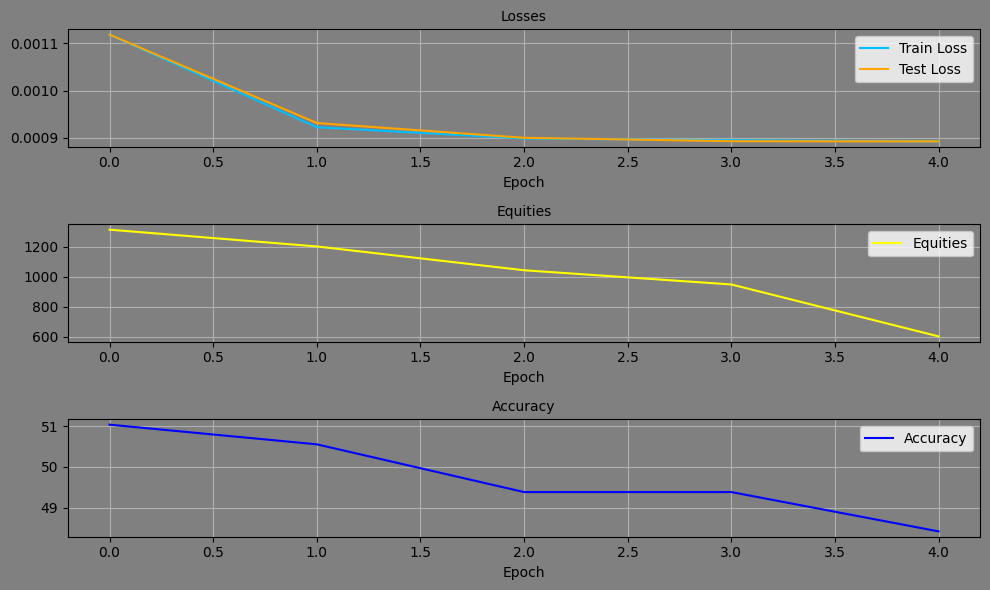

Epoch: 5, Equity: 1193.84, Accuracy: 49.66 train_losses: 0.0021550630984534126, test_losses: 0.0009314257185906172, Duration: 0:00:01.220509


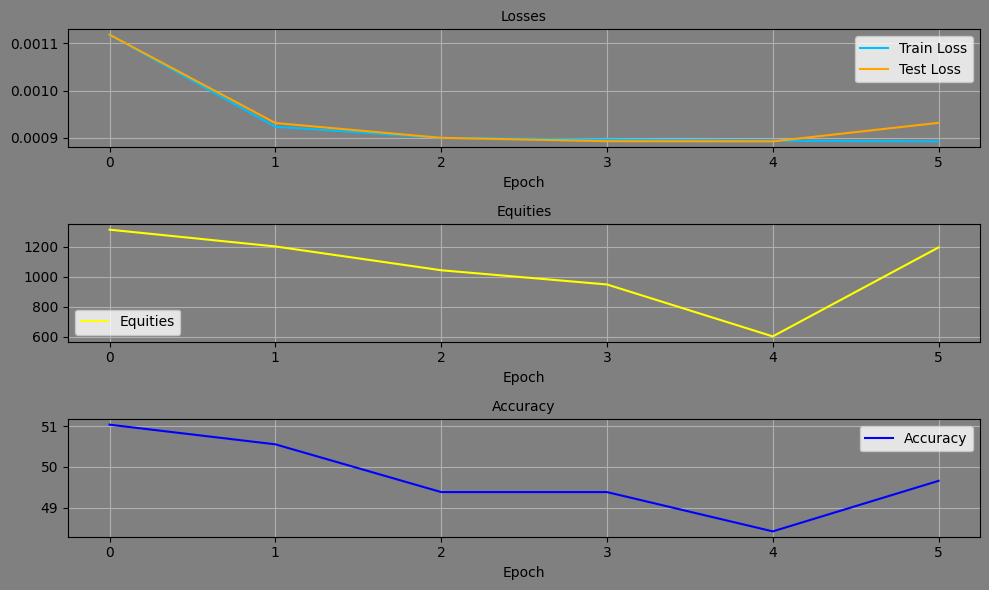

Epoch: 6, Equity: 1023.40, Accuracy: 49.45 train_losses: 0.0021431564269328695, test_losses: 0.000889189017470926, Duration: 0:00:01.304548


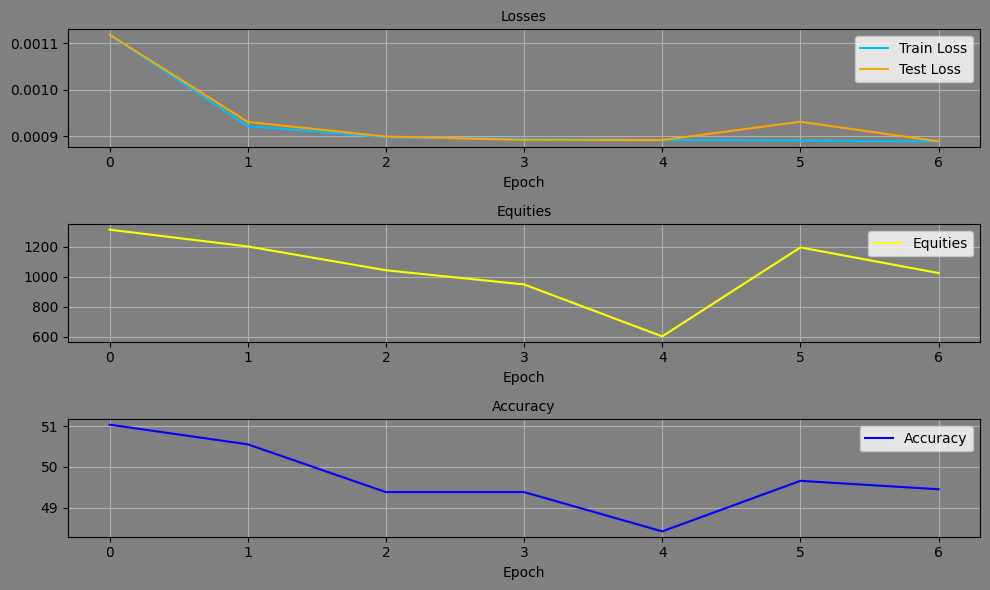

Epoch: 7, Equity: 1364.35, Accuracy: 51.86 train_losses: 0.002126907657516459, test_losses: 0.0008821758674457669, Duration: 0:00:01.526469


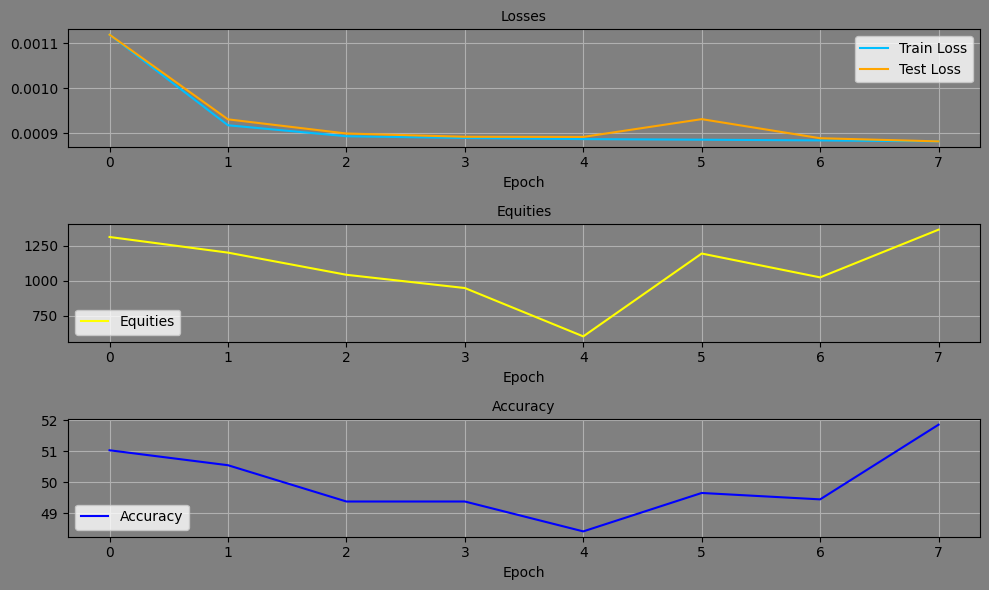

Epoch: 8, Equity: 642.31, Accuracy: 48.35 train_losses: 0.0021185779917566273, test_losses: 0.0008892611949704587, Duration: 0:00:01.260468


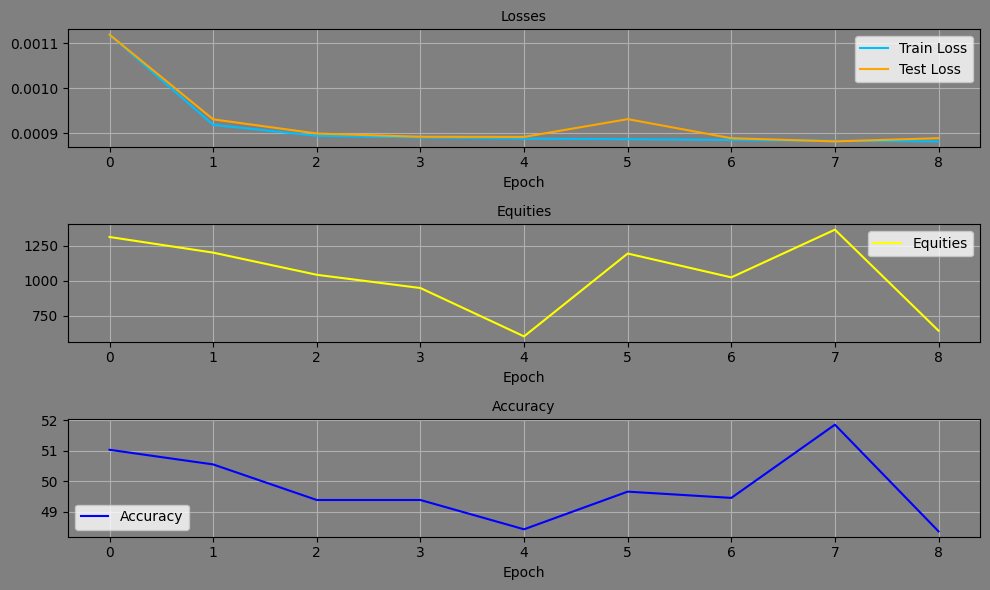

Epoch: 9, Equity: 1364.35, Accuracy: 51.86 train_losses: 0.002112351459956738, test_losses: 0.0008837536443024874, Duration: 0:00:01.197069


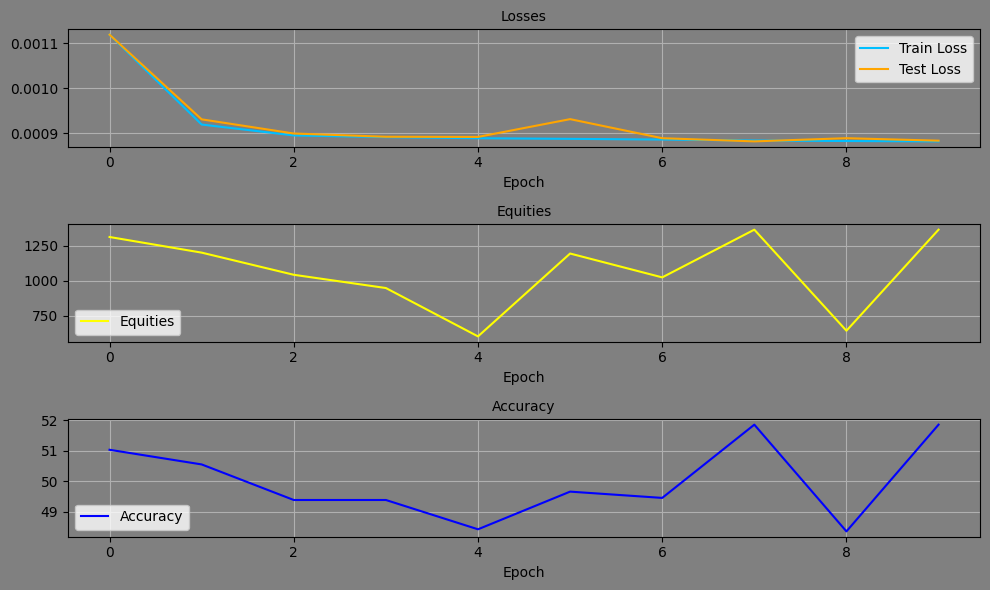

Epoch: 10, Equity: 1359.51, Accuracy: 51.72 train_losses: 0.0021047179304909524, test_losses: 0.0008764583035372198, Duration: 0:00:01.165073


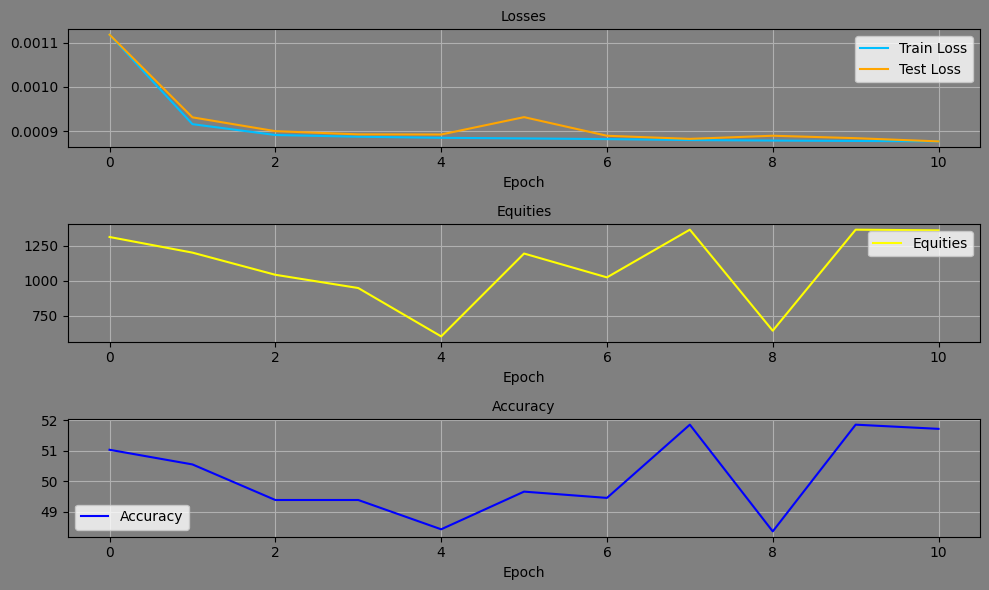

Epoch: 11, Equity: 1364.35, Accuracy: 51.86 train_losses: 0.0020983448101034034, test_losses: 0.0008777771145105362, Duration: 0:00:01.086686


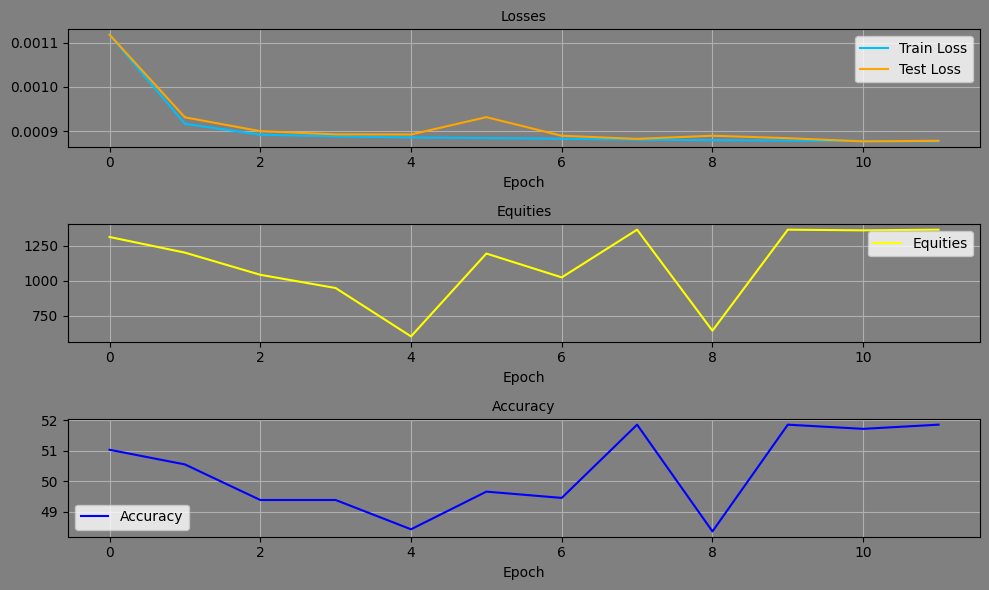

Epoch: 12, Equity: 1165.01, Accuracy: 50.55 train_losses: 0.002096957013767887, test_losses: 0.0008723668870516121, Duration: 0:00:01.071787


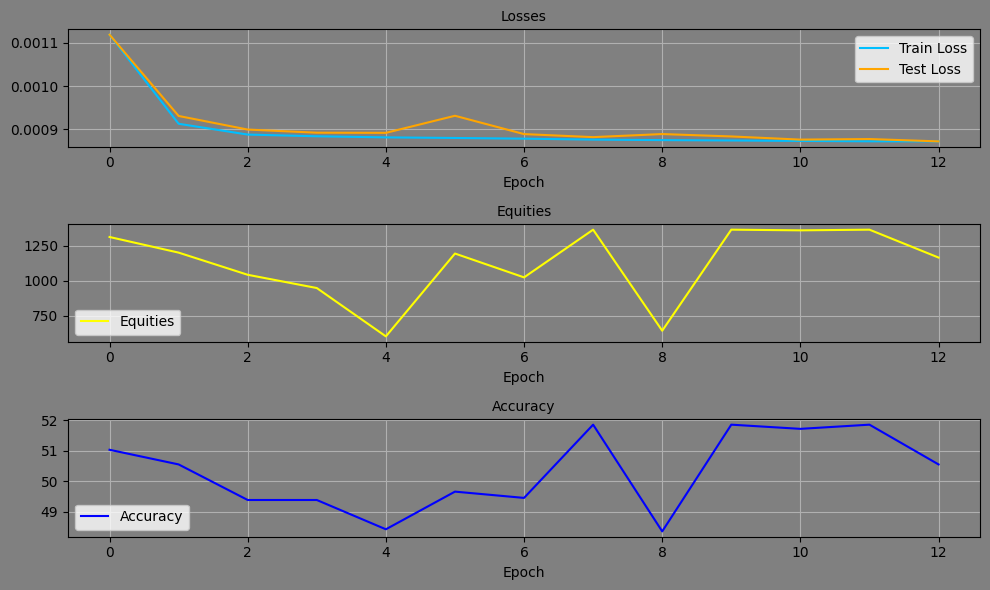

Epoch: 13, Equity: 1364.35, Accuracy: 51.86 train_losses: 0.0020815495991625397, test_losses: 0.000884801906067878, Duration: 0:00:01.075434


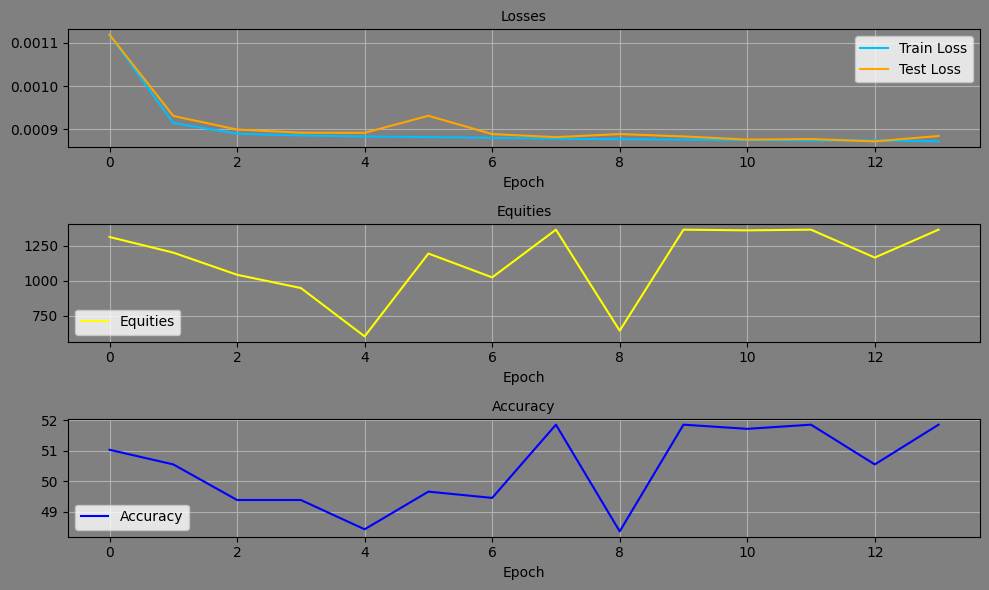

Epoch: 14, Equity: 980.42, Accuracy: 49.79 train_losses: 0.0020800927704188467, test_losses: 0.0008782422519288957, Duration: 0:00:01.102123


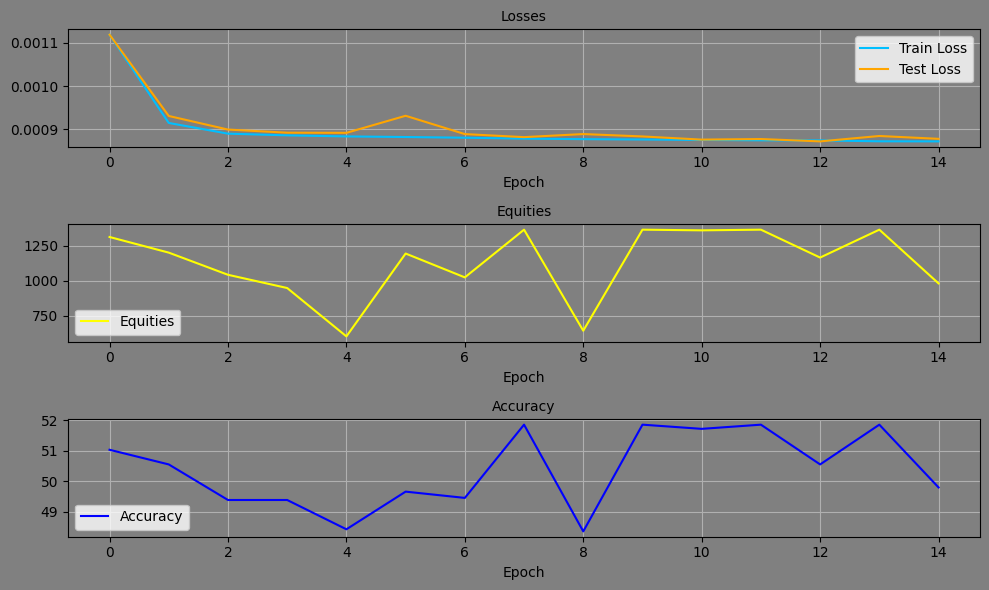

Epoch: 15, Equity: 1034.98, Accuracy: 50.48 train_losses: 0.002080564814103153, test_losses: 0.0008680065511725843, Duration: 0:00:01.238437


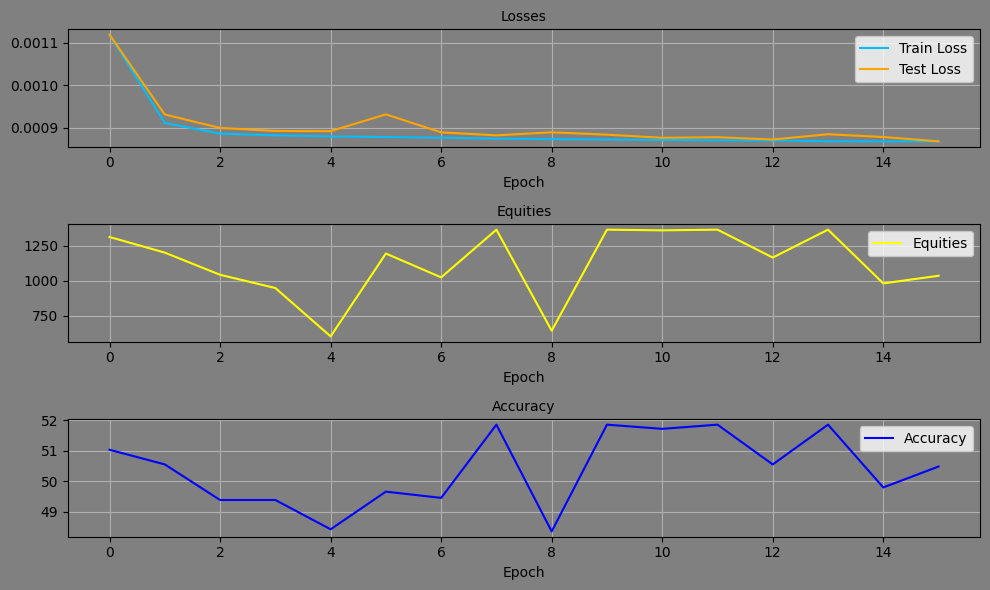

Epoch: 16, Equity: 1155.79, Accuracy: 49.86 train_losses: 0.0020658397090731447, test_losses: 0.0008751001441851258, Duration: 0:00:01.071085


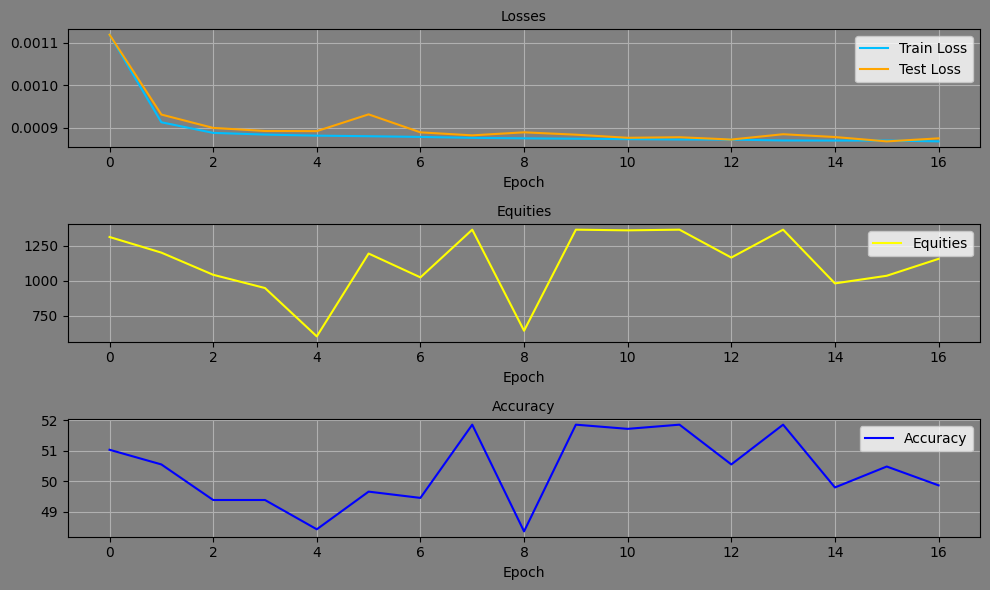

Epoch: 17, Equity: 1074.81, Accuracy: 50.62 train_losses: 0.002063152006423388, test_losses: 0.0008946938905864954, Duration: 0:00:01.133104


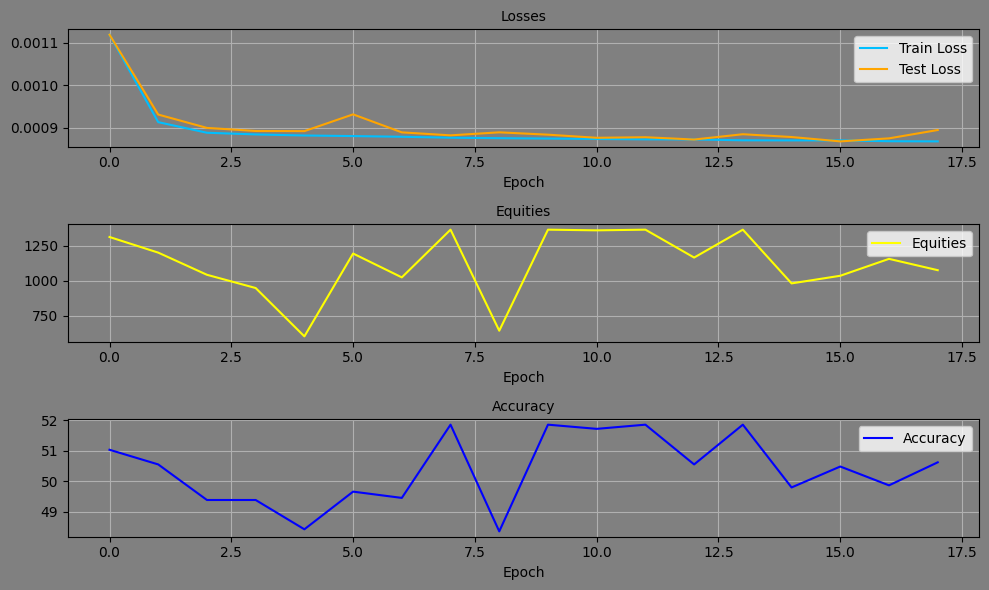

Epoch: 18, Equity: 1064.46, Accuracy: 49.52 train_losses: 0.002064276040167845, test_losses: 0.0008989788475446403, Duration: 0:00:01.022723


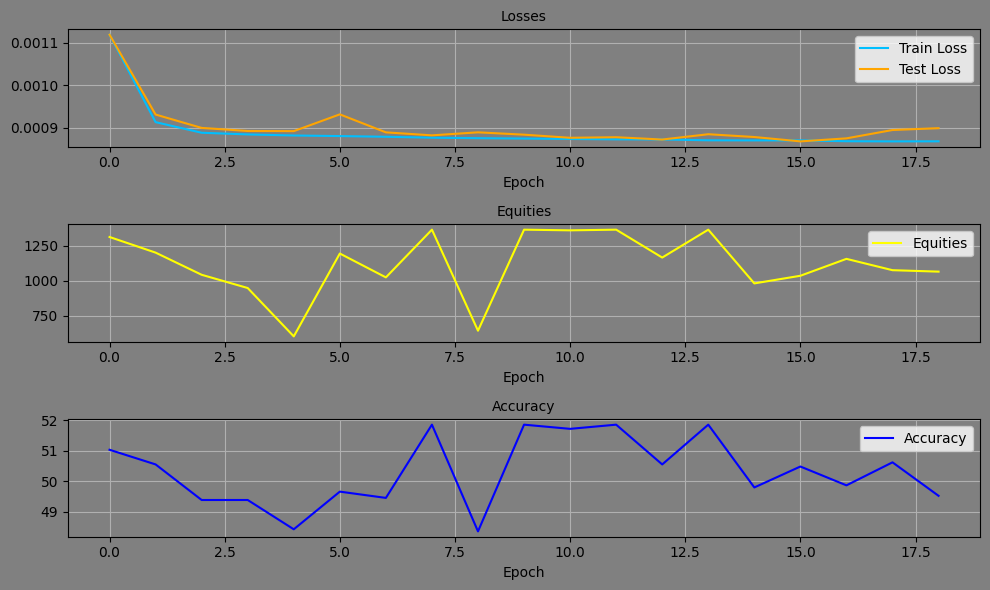

Epoch: 19, Equity: 1364.35, Accuracy: 51.86 train_losses: 0.002057412762560391, test_losses: 0.0008918500388972461, Duration: 0:00:01.047482


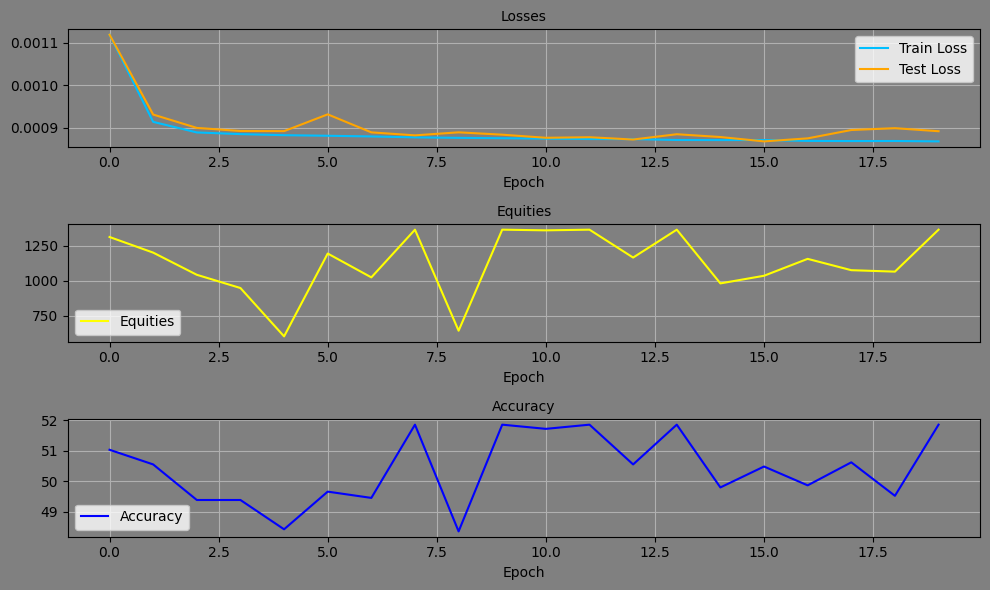

Epoch: 20, Equity: 1364.35, Accuracy: 51.86 train_losses: 0.002049416654653961, test_losses: 0.0008885305724106729, Duration: 0:00:01.041880


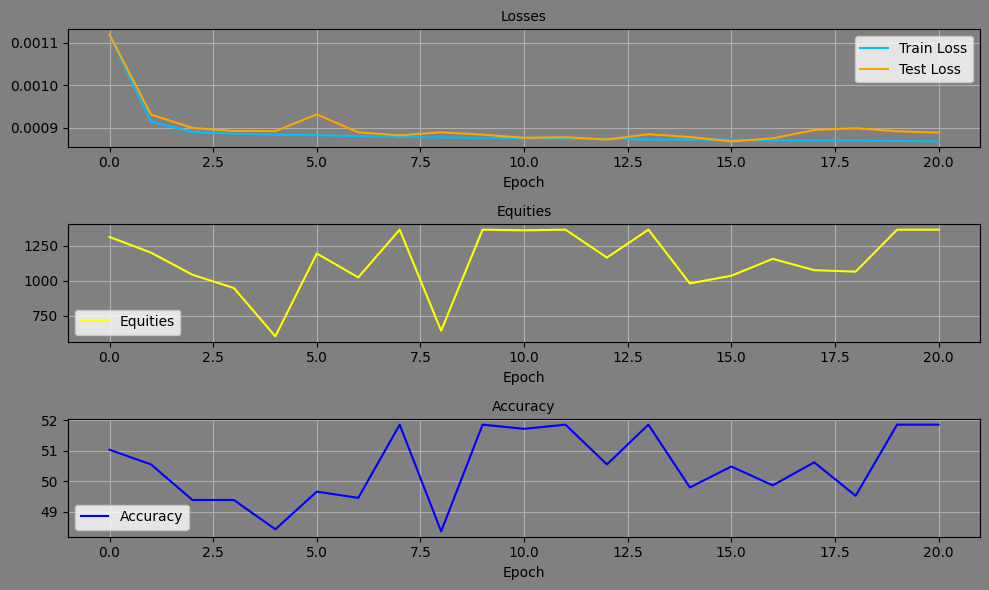

Epoch: 21, Equity: 1364.35, Accuracy: 51.86 train_losses: 0.002058542289105194, test_losses: 0.0008648427901789546, Duration: 0:00:01.066193


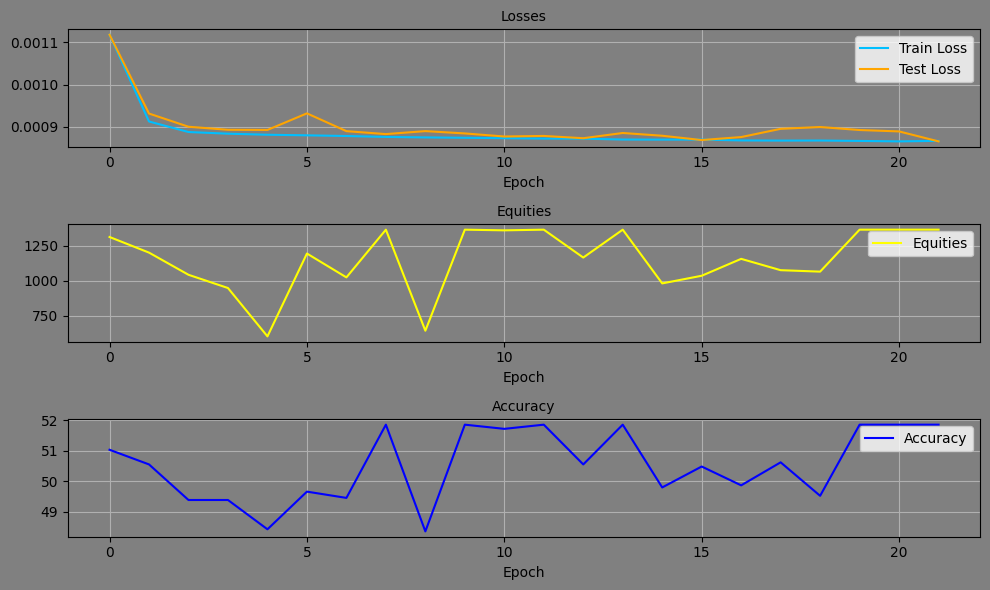

Epoch: 22, Equity: 881.10, Accuracy: 50.07 train_losses: 0.0020490983191470357, test_losses: 0.0008639376610517502, Duration: 0:00:01.055057


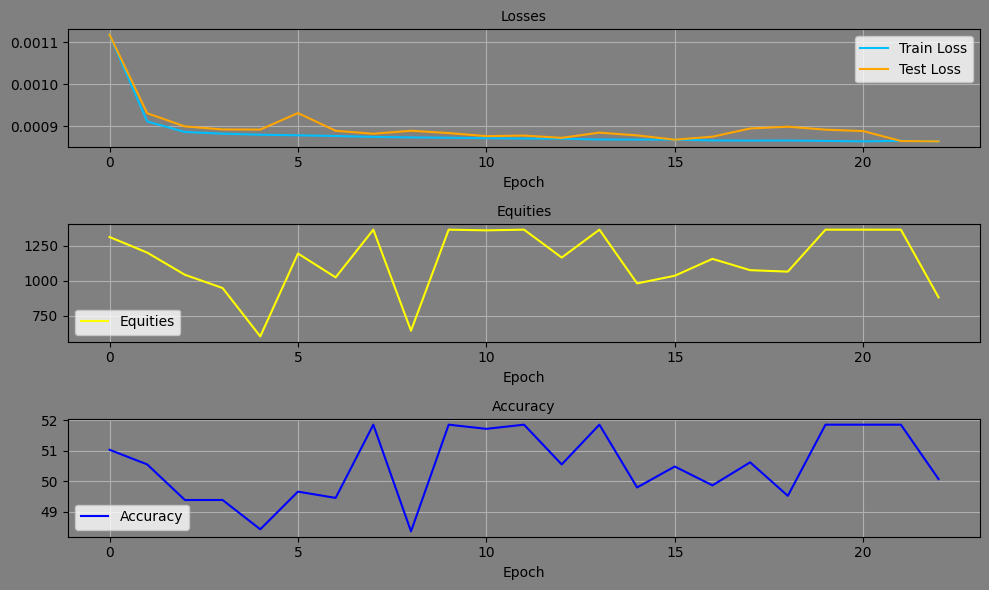

Epoch: 23, Equity: 1080.35, Accuracy: 49.45 train_losses: 0.002049001903998362, test_losses: 0.0008710644324310124, Duration: 0:00:01.068602


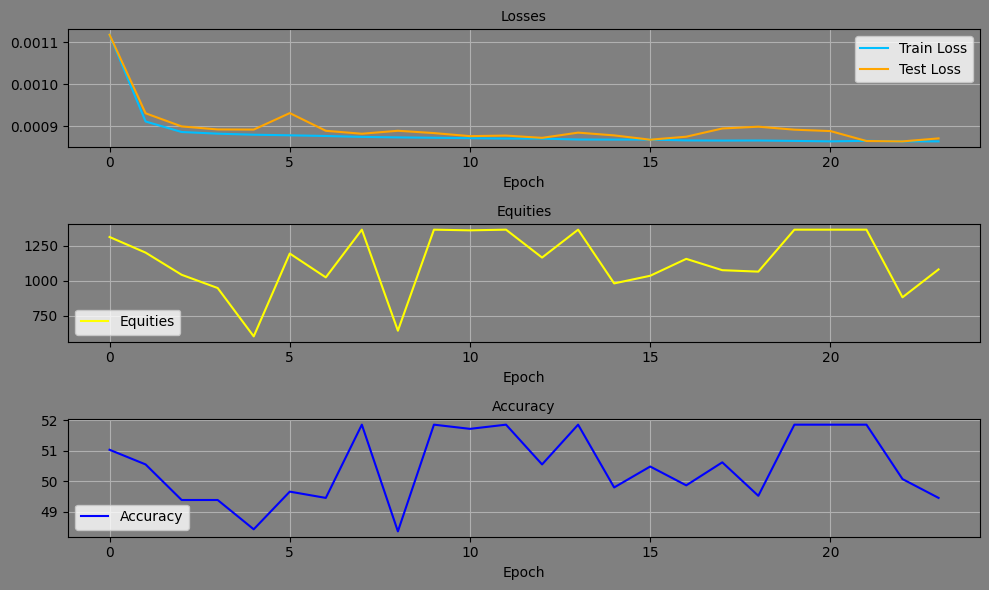

Epoch: 24, Equity: 880.21, Accuracy: 49.24 train_losses: 0.002048715695469243, test_losses: 0.0008751535206101835, Duration: 0:00:01.113892


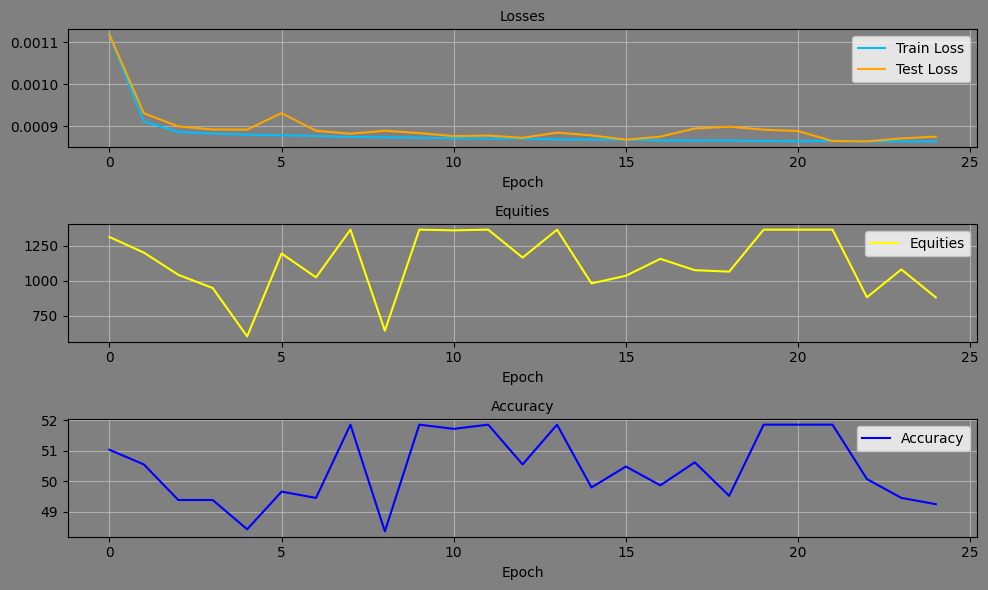

Epoch: 25, Equity: 1367.41, Accuracy: 52.00 train_losses: 0.0020488342267125643, test_losses: 0.0008893921039998531, Duration: 0:00:01.074917


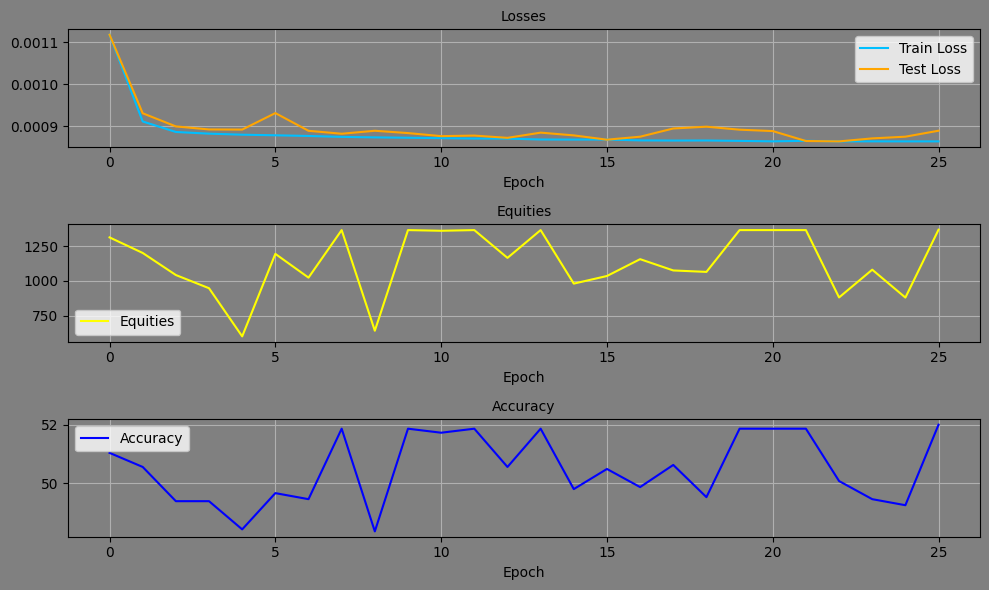

Epoch: 26, Equity: 1279.21, Accuracy: 51.86 train_losses: 0.0020363897471780486, test_losses: 0.00087313714902848, Duration: 0:00:01.129314


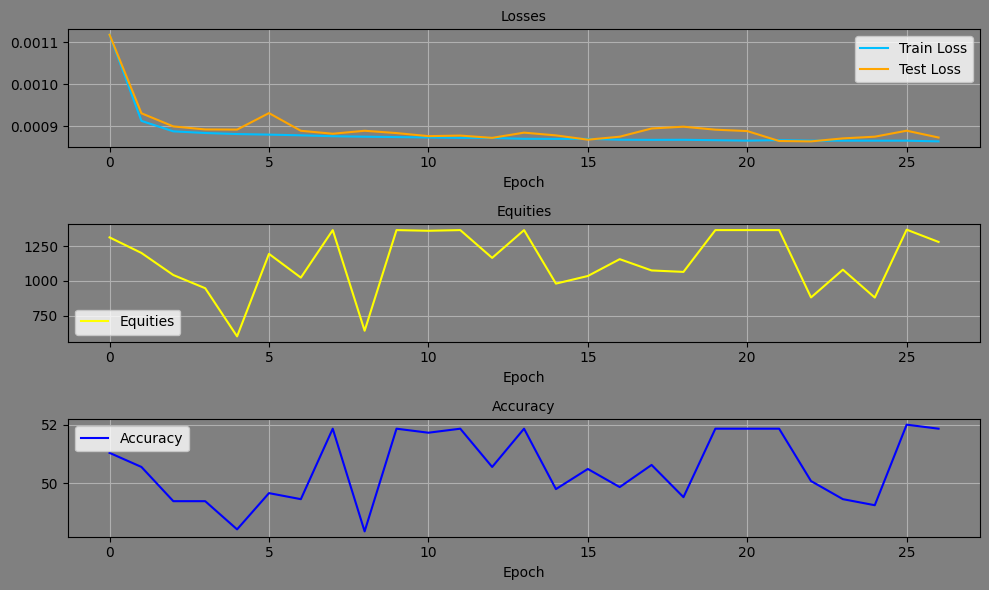

Epoch: 27, Equity: 1050.29, Accuracy: 49.04 train_losses: 0.0020382608157477433, test_losses: 0.0008688678499311209, Duration: 0:00:01.057244


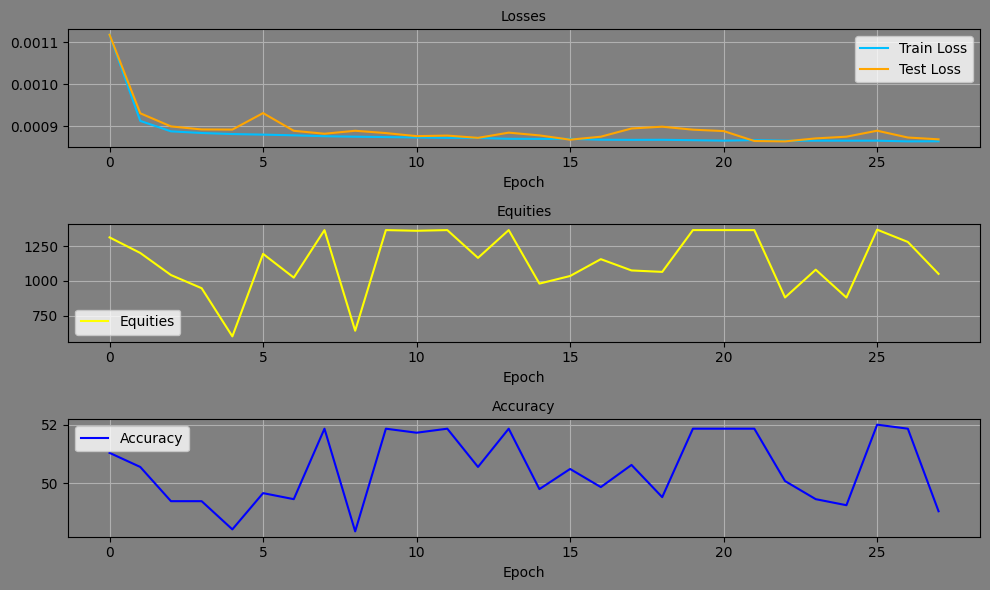

Epoch: 28, Equity: 1364.35, Accuracy: 51.86 train_losses: 0.0020401259407728215, test_losses: 0.000867927388753742, Duration: 0:00:01.095827


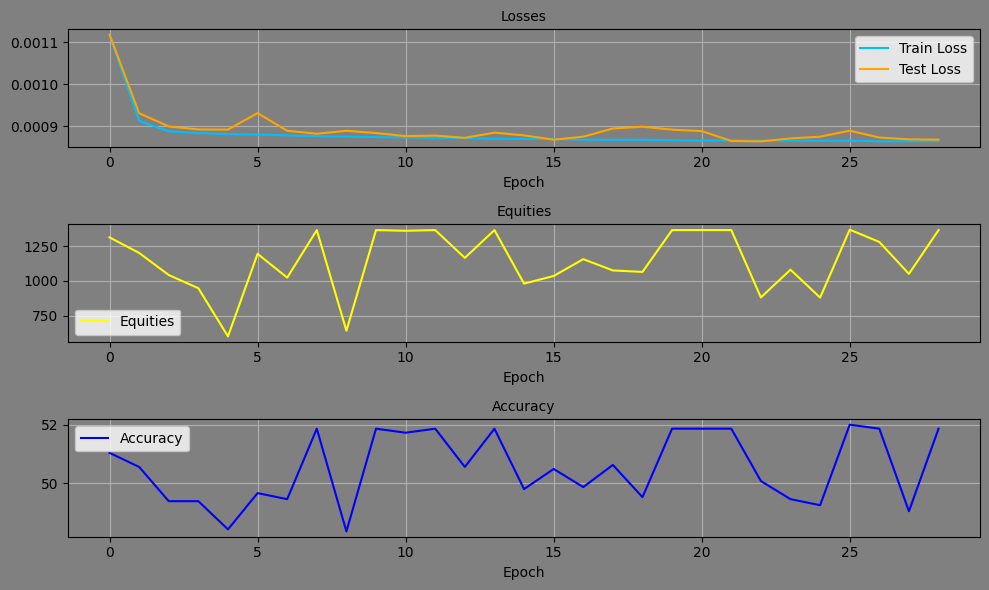

Epoch: 29, Equity: 897.57, Accuracy: 49.17 train_losses: 0.0020396450495240564, test_losses: 0.0008966859895735979, Duration: 0:00:01.110047


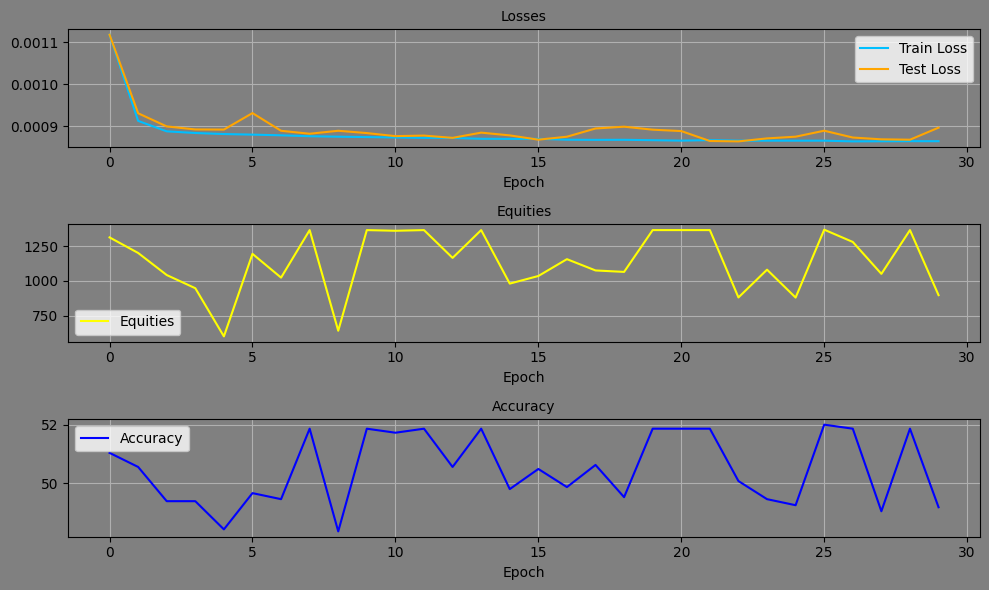

Epoch: 30, Equity: 1119.91, Accuracy: 50.41 train_losses: 0.0020238887020019567, test_losses: 0.0009379950352013111, Duration: 0:00:01.106005


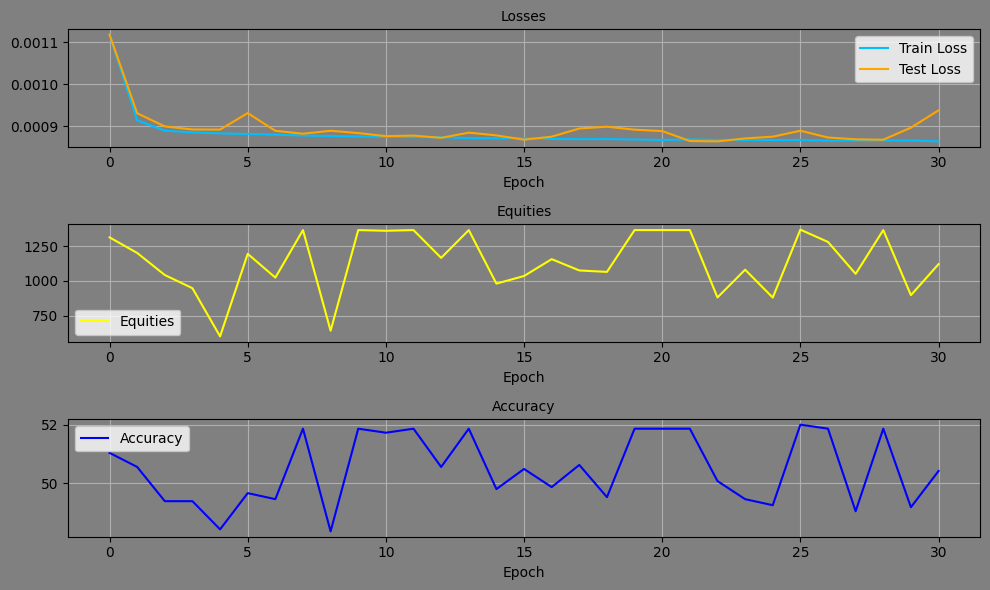

Epoch: 31, Equity: 933.63, Accuracy: 50.76 train_losses: 0.0020381339045832314, test_losses: 0.000876350502949208, Duration: 0:00:01.034694


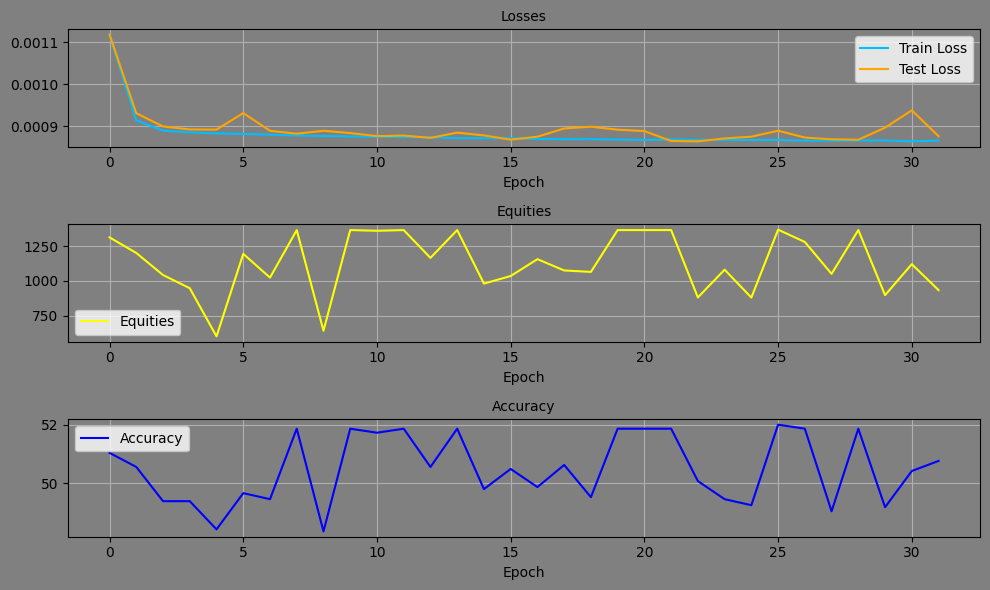

Epoch: 32, Equity: 1142.06, Accuracy: 50.83 train_losses: 0.002034653177214486, test_losses: 0.0008651182288303971, Duration: 0:00:01.083074


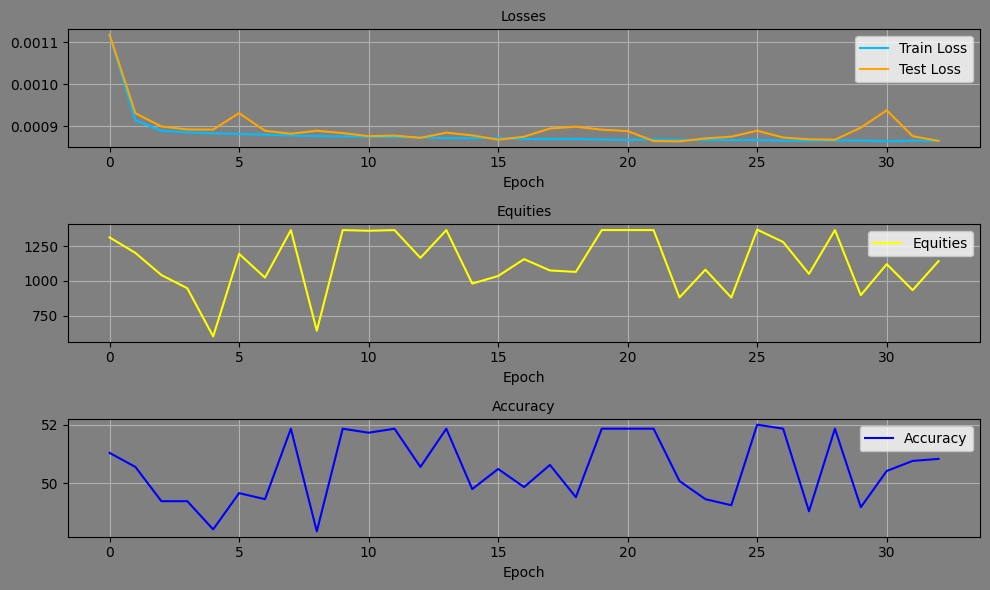

Epoch: 33, Equity: 1354.27, Accuracy: 52.34 train_losses: 0.0020322072720046634, test_losses: 0.0008653336553834379, Duration: 0:00:01.086345


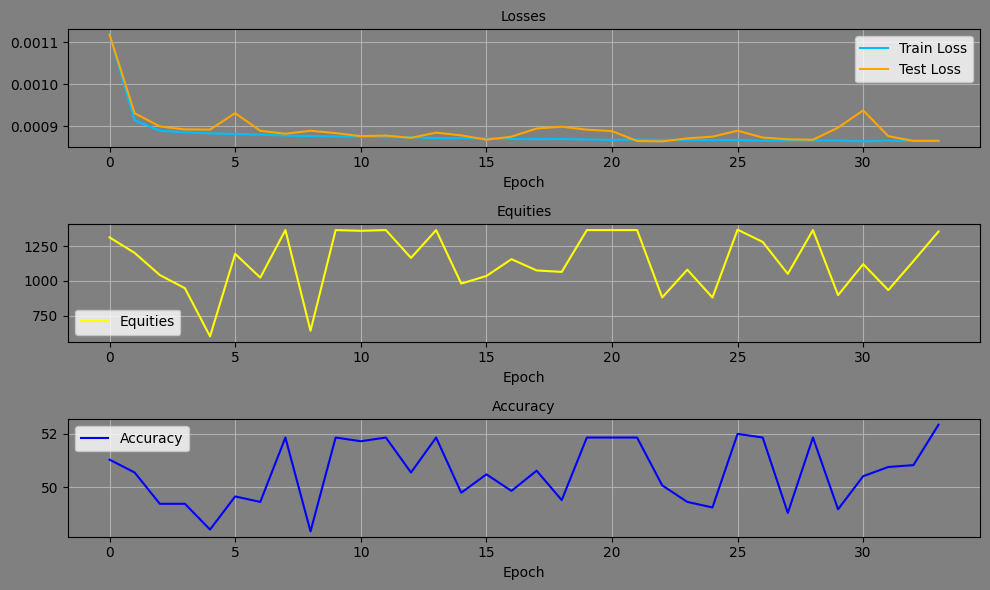

Epoch: 34, Equity: 1371.98, Accuracy: 52.00 train_losses: 0.0020327578167519517, test_losses: 0.0008663455373607576, Duration: 0:00:01.089544


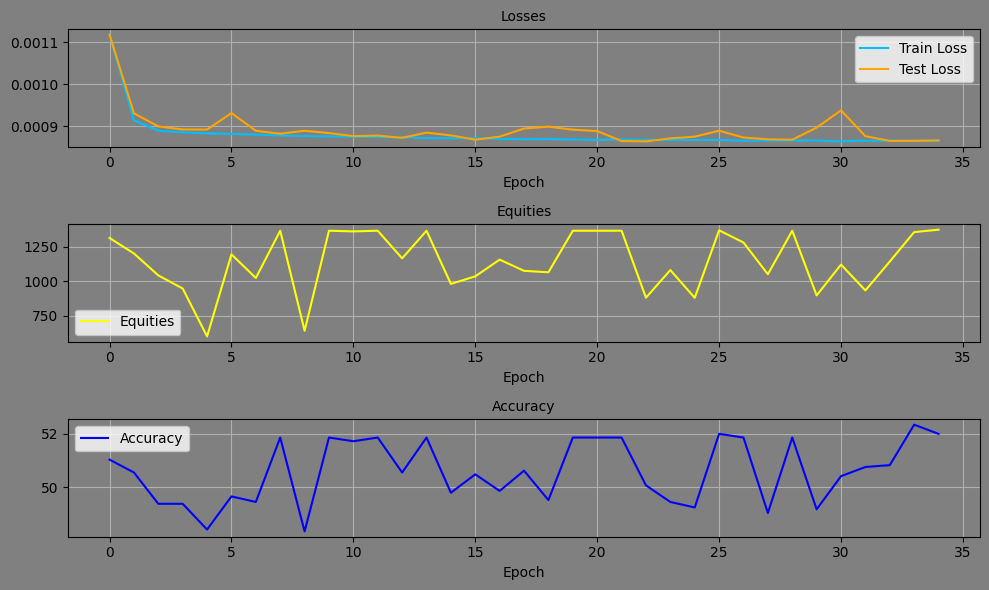

Epoch: 35, Equity: 1375.92, Accuracy: 52.20 train_losses: 0.0020342800861364732, test_losses: 0.0008603769820183516, Duration: 0:00:01.112866


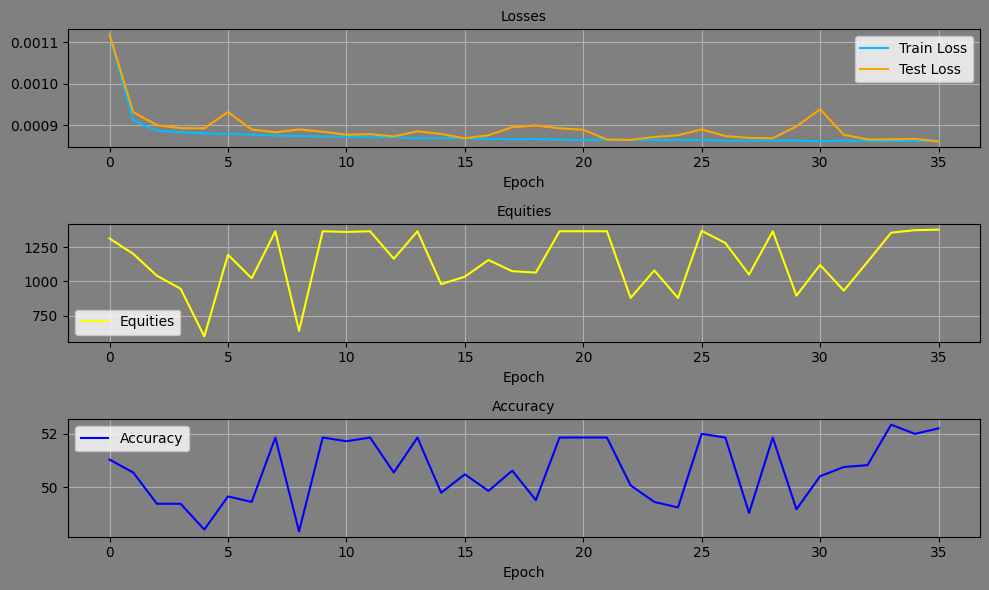

Epoch: 36, Equity: 1353.91, Accuracy: 51.93 train_losses: 0.0020324005486650597, test_losses: 0.000865016772877425, Duration: 0:00:01.136634


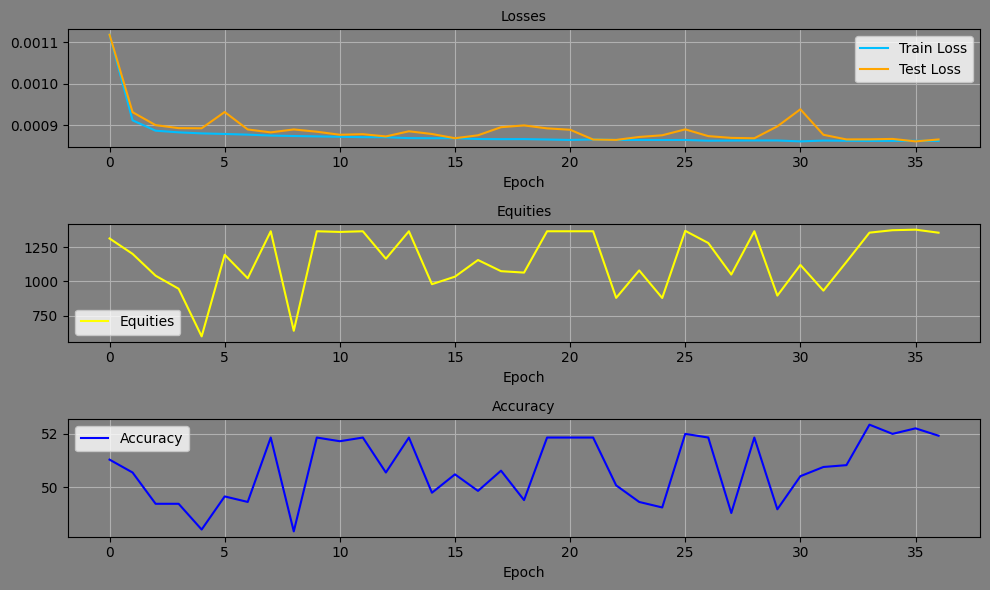

Epoch: 37, Equity: 1195.99, Accuracy: 51.79 train_losses: 0.0020327552507120755, test_losses: 0.0008746373932808638, Duration: 0:00:01.068558


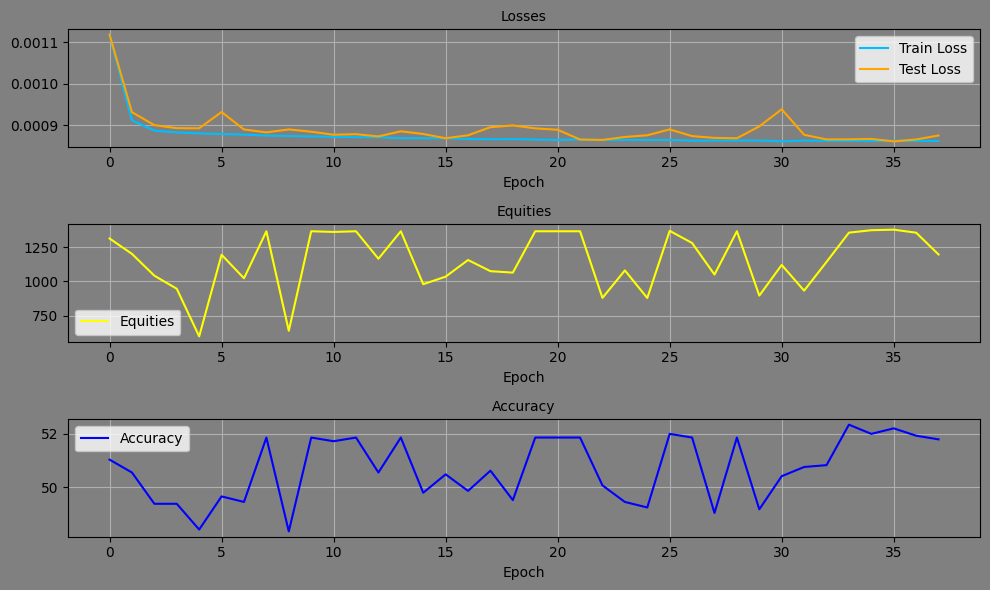

Epoch: 38, Equity: 1135.39, Accuracy: 51.38 train_losses: 0.002019993971914761, test_losses: 0.0008685284992679954, Duration: 0:00:01.049763


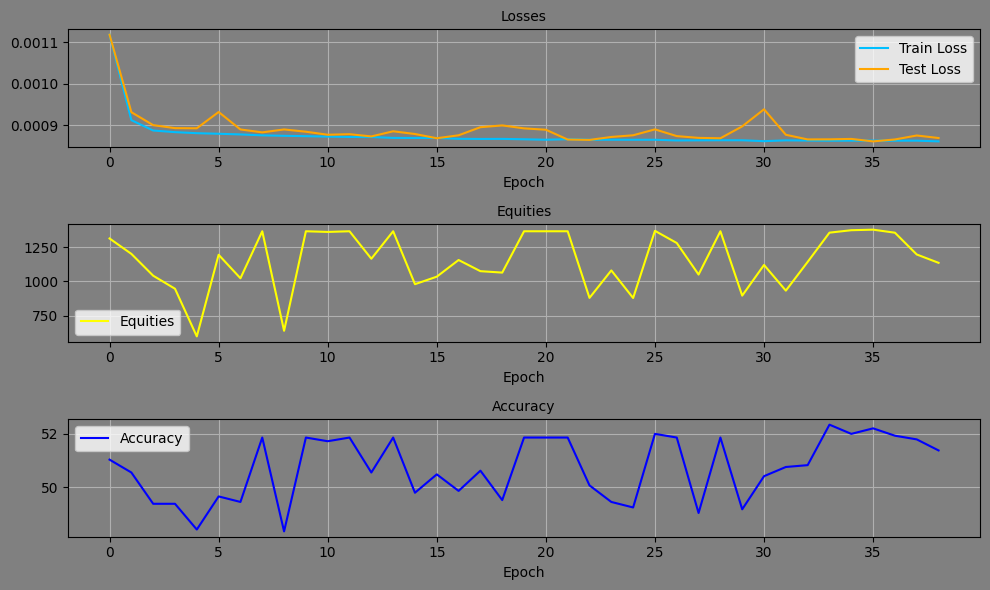

Epoch: 39, Equity: 1353.91, Accuracy: 51.93 train_losses: 0.002029557816273663, test_losses: 0.000874980294611305, Duration: 0:00:01.054746


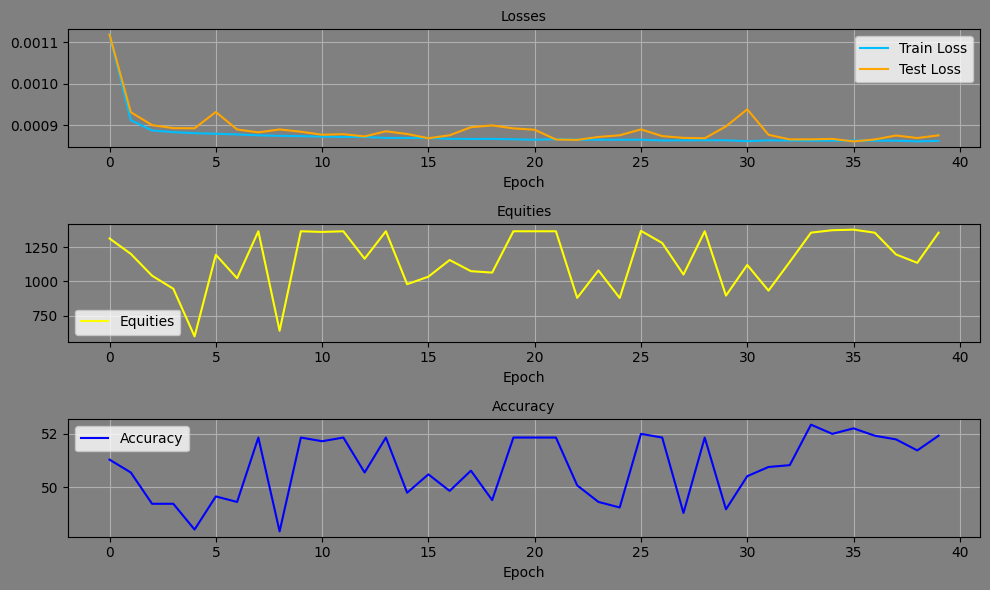

Epoch: 40, Equity: 1194.24, Accuracy: 50.76 train_losses: 0.0020243463791384426, test_losses: 0.0008721983758732677, Duration: 0:00:01.091443


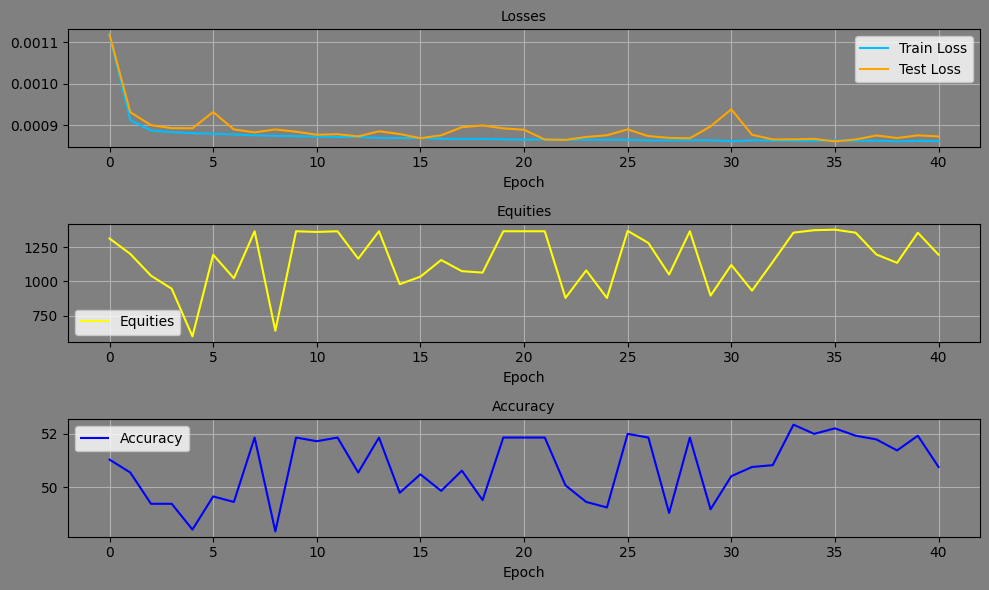

Epoch: 41, Equity: 1112.25, Accuracy: 51.58 train_losses: 0.002024415572504363, test_losses: 0.0008661648607812822, Duration: 0:00:01.075718


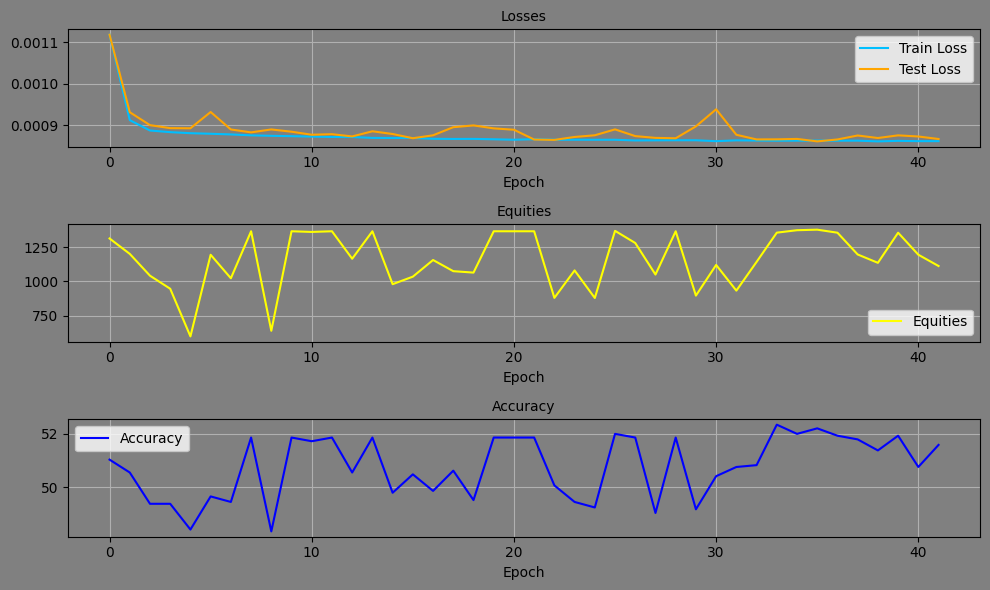

Epoch: 42, Equity: 1149.74, Accuracy: 49.38 train_losses: 0.002025409261875462, test_losses: 0.0008692263509146869, Duration: 0:00:01.129493


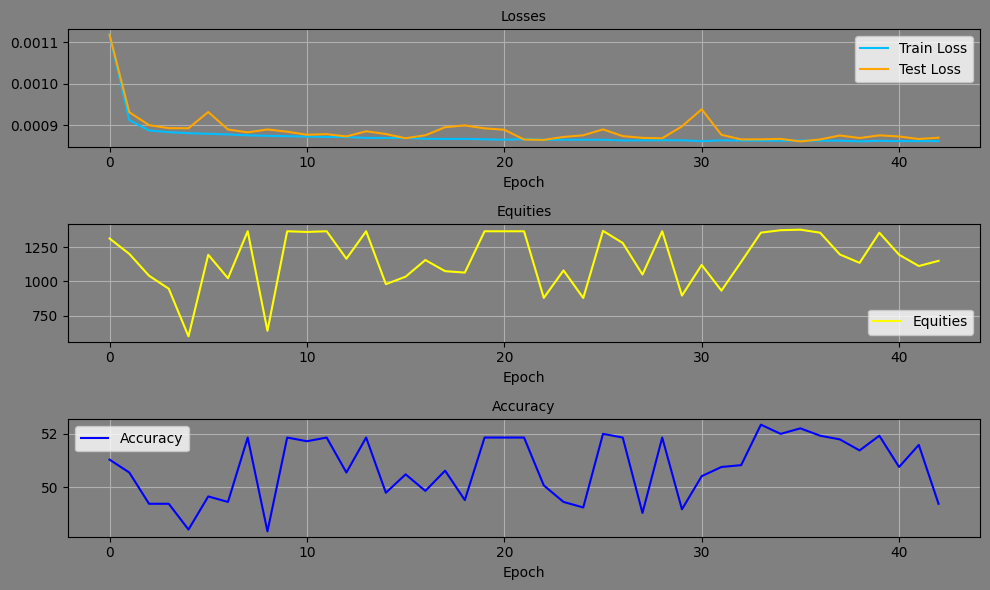

Epoch: 43, Equity: 1113.68, Accuracy: 50.07 train_losses: 0.0020205778434687362, test_losses: 0.0008626418421044946, Duration: 0:00:01.038534


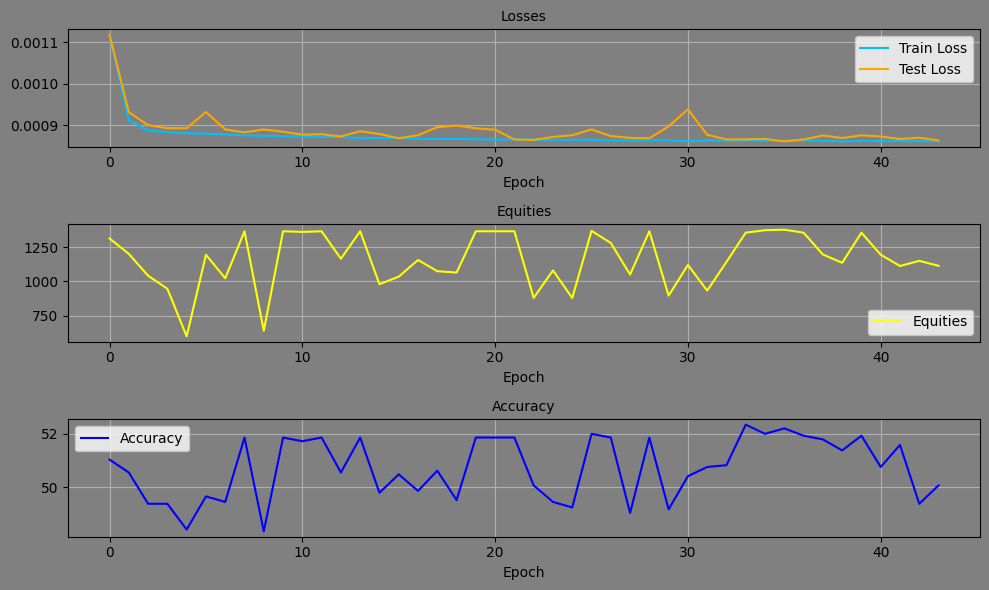

Epoch: 44, Equity: 1264.52, Accuracy: 49.38 train_losses: 0.0020114496091796306, test_losses: 0.0008644241606816649, Duration: 0:00:01.035933


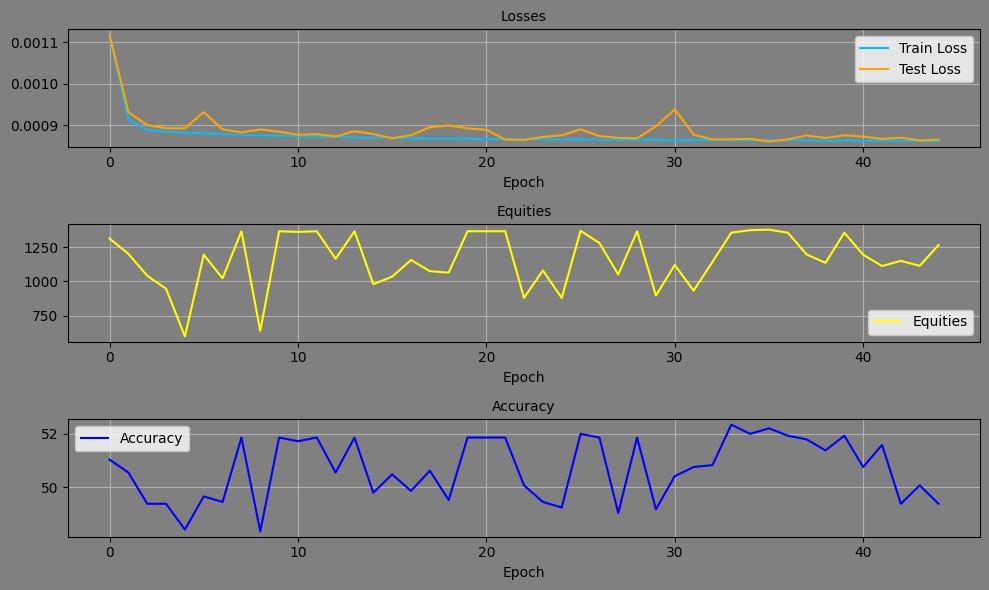

Epoch: 45, Equity: 1380.51, Accuracy: 51.86 train_losses: 0.0020251673649192043, test_losses: 0.0008792006992734969, Duration: 0:00:01.019404


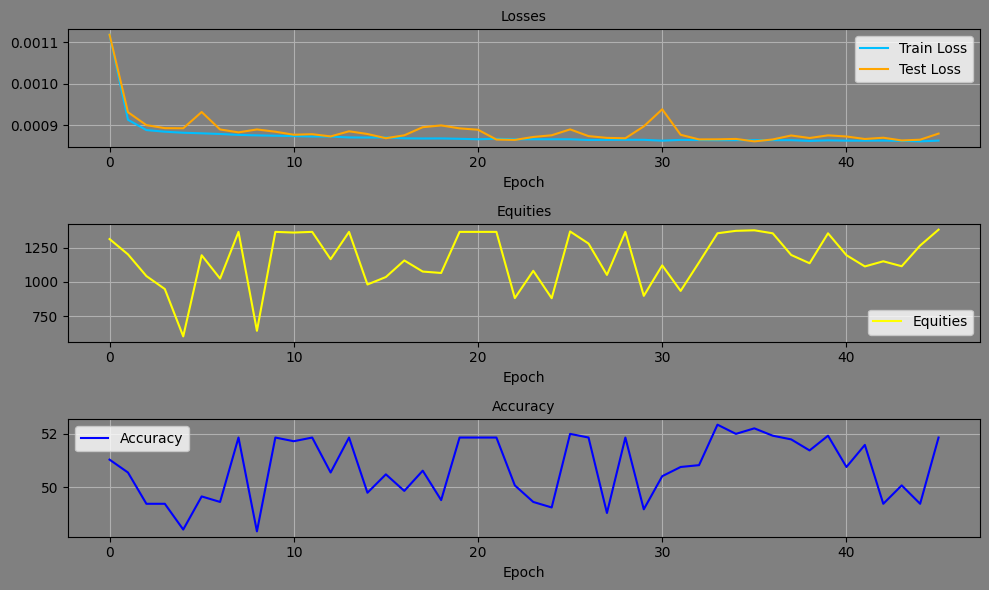

Epoch: 46, Equity: 1173.66, Accuracy: 51.45 train_losses: 0.002026038560649133, test_losses: 0.0008619651198387146, Duration: 0:00:01.055765


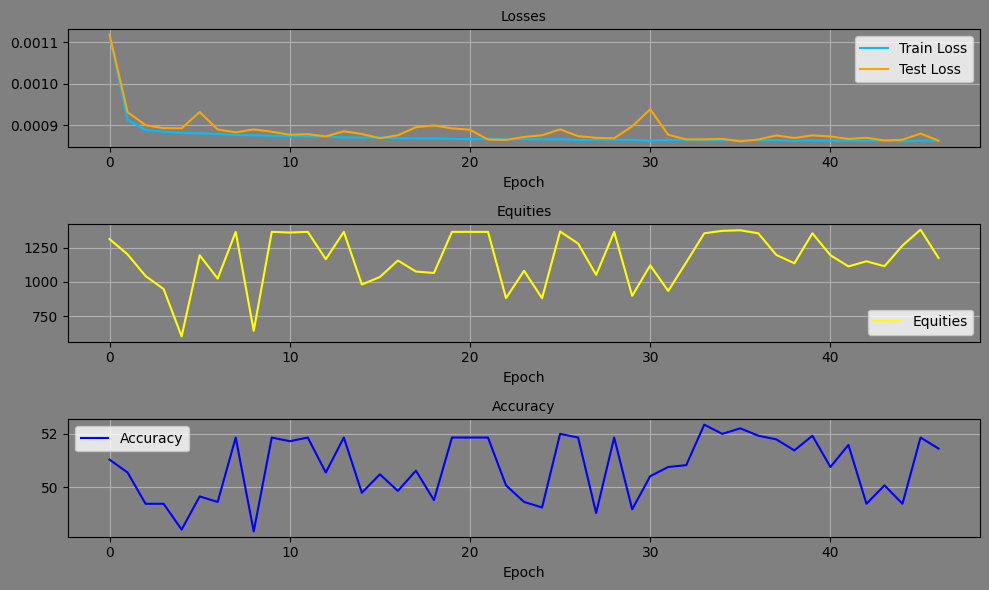

Epoch: 47, Equity: 955.50, Accuracy: 49.86 train_losses: 0.002021972302182187, test_losses: 0.0008591187070123851, Duration: 0:00:01.055222


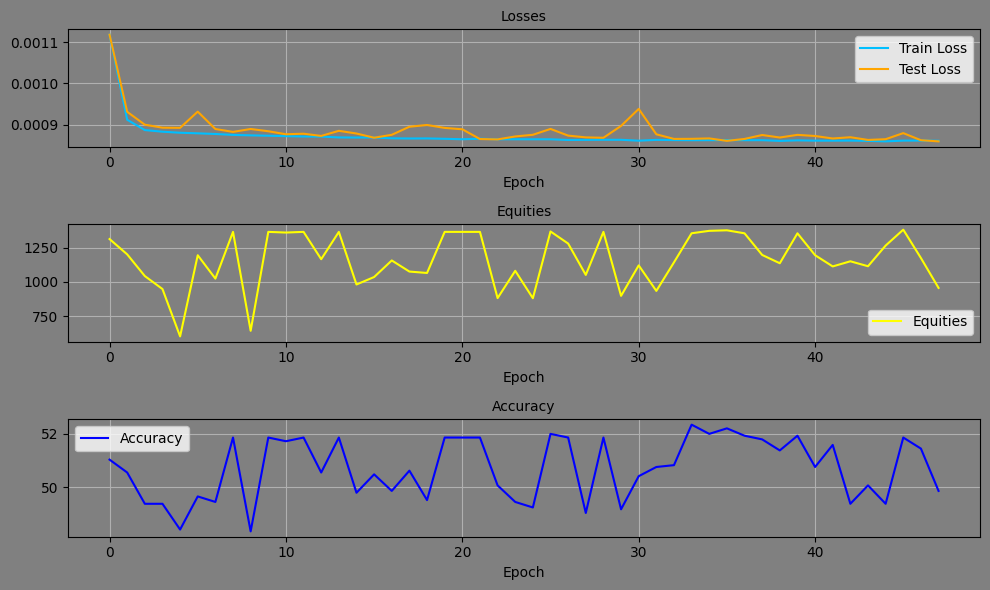

Epoch: 48, Equity: 971.21, Accuracy: 50.69 train_losses: 0.00202543116673263, test_losses: 0.0008601834415458143, Duration: 0:00:01.039391


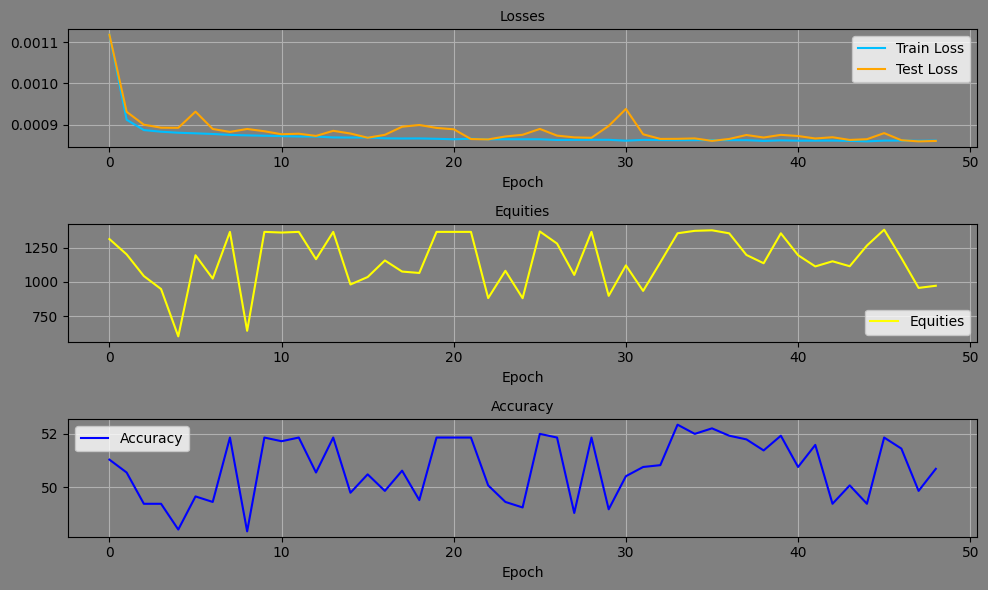

Epoch: 49, Equity: 990.31, Accuracy: 49.59 train_losses: 0.0019943497907687446, test_losses: 0.0008614219259470701, Duration: 0:00:01.063339


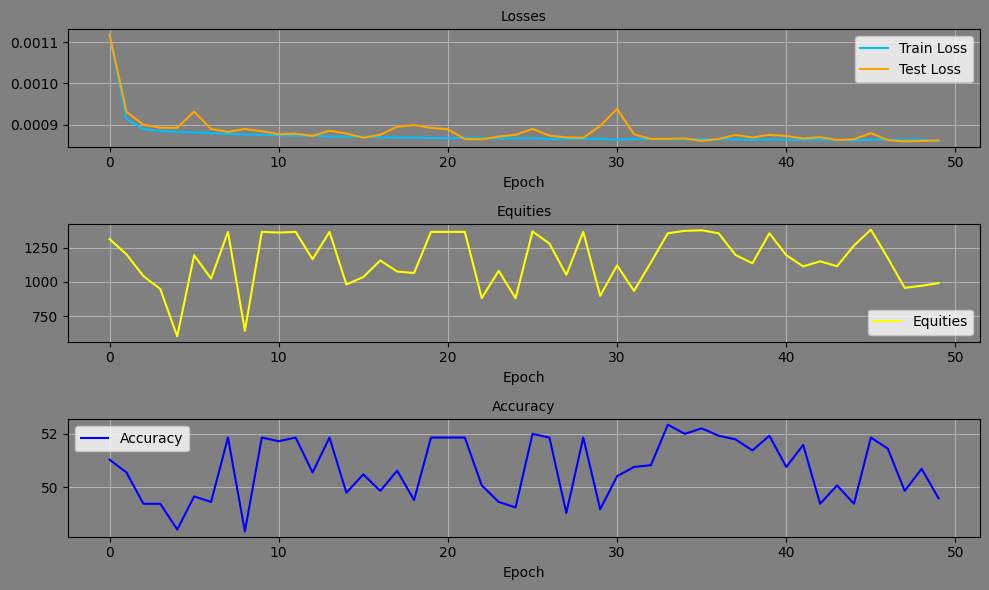

Epoch: 50, Equity: 1175.18, Accuracy: 50.41 train_losses: 0.0020223546896912625, test_losses: 0.0008659888990223408, Duration: 0:00:01.109722


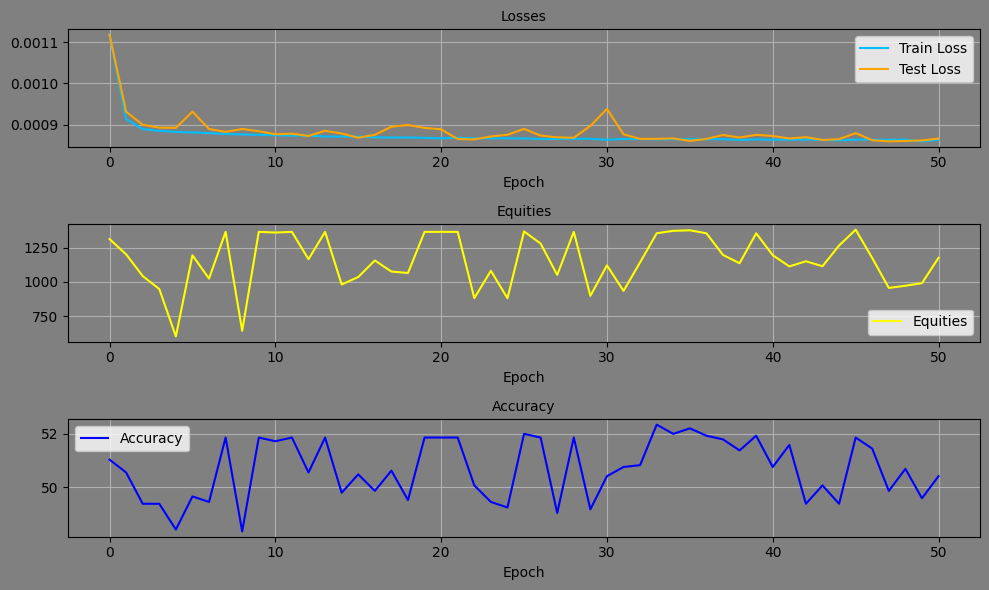

Epoch: 51, Equity: 1113.23, Accuracy: 50.48 train_losses: 0.002015949321633679, test_losses: 0.0008625202463008463, Duration: 0:00:01.055611


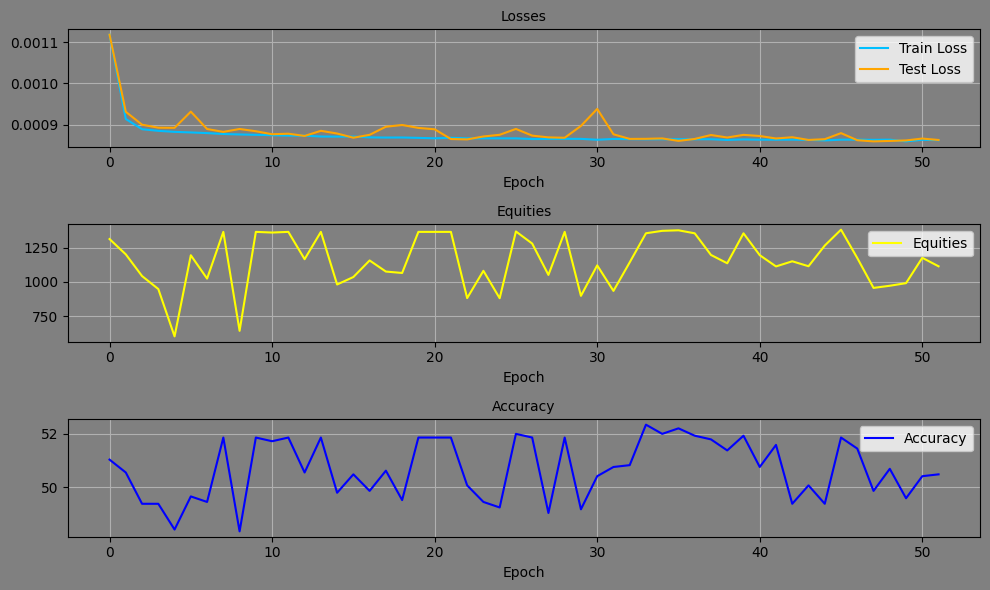

Epoch: 52, Equity: 1189.31, Accuracy: 51.58 train_losses: 0.002022203292608375, test_losses: 0.0008608769858255982, Duration: 0:00:01.061011


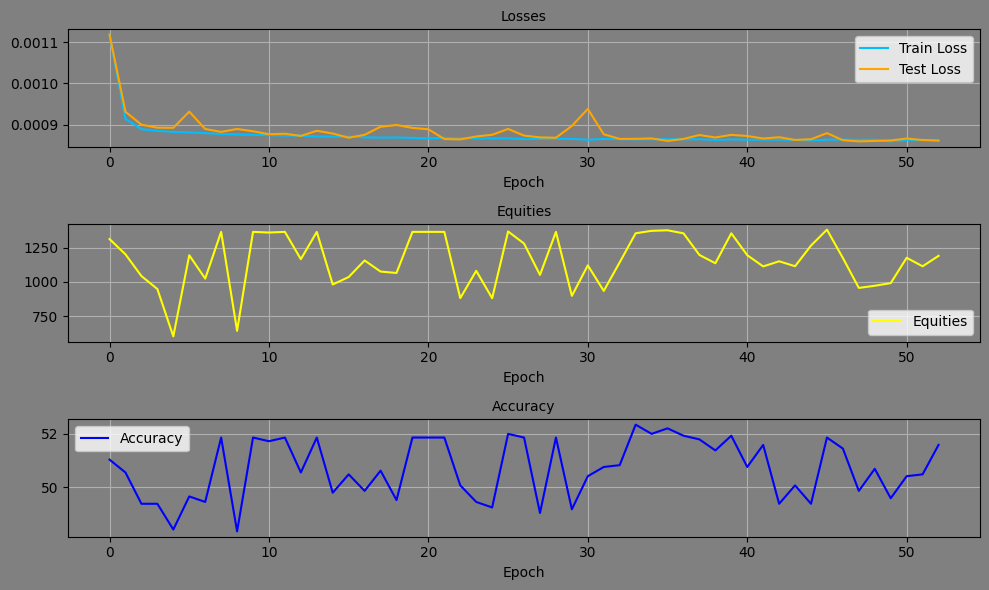

Epoch: 53, Equity: 1133.84, Accuracy: 50.69 train_losses: 0.00201735092747596, test_losses: 0.000869138166308403, Duration: 0:00:01.068855


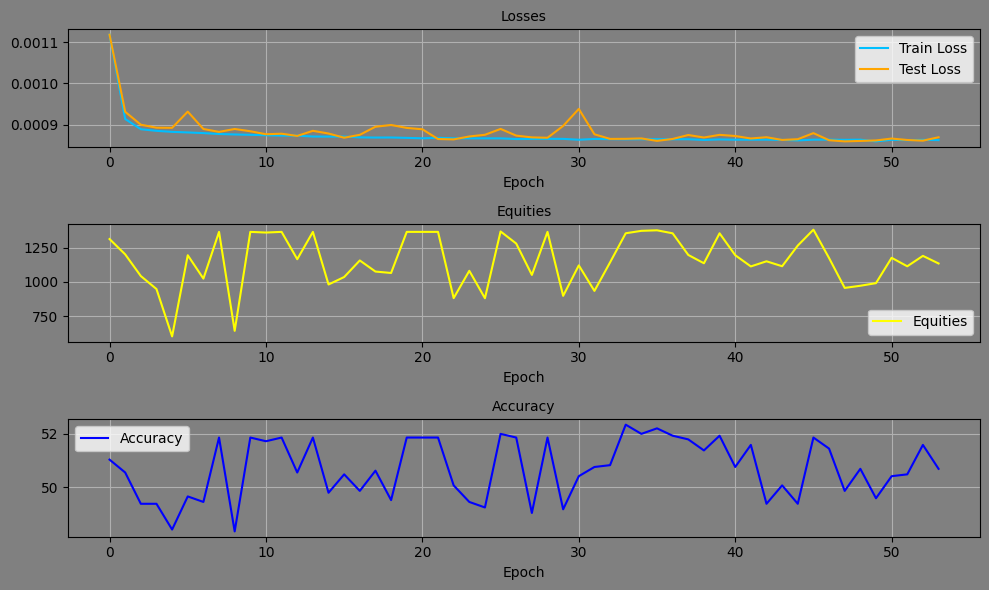

Epoch: 54, Equity: 1267.66, Accuracy: 49.86 train_losses: 0.0020163090634418446, test_losses: 0.0008678560261614621, Duration: 0:00:01.109143


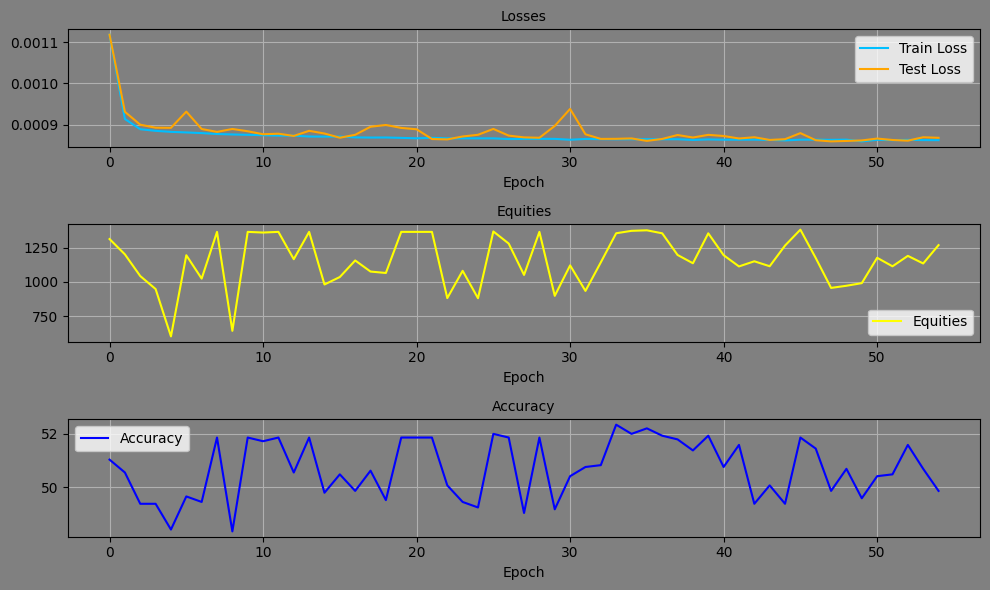

Epoch: 55, Equity: 1097.10, Accuracy: 49.72 train_losses: 0.0020022693842876448, test_losses: 0.0008604530012235045, Duration: 0:00:01.168727


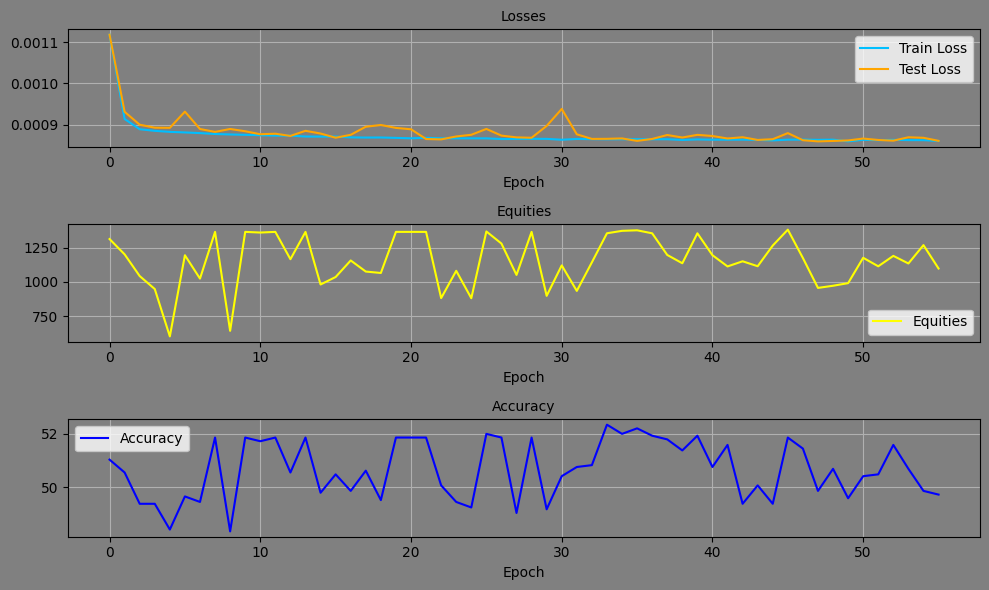

Epoch: 56, Equity: 1120.46, Accuracy: 51.24 train_losses: 0.002020660150248731, test_losses: 0.0008621207089163363, Duration: 0:00:01.107228


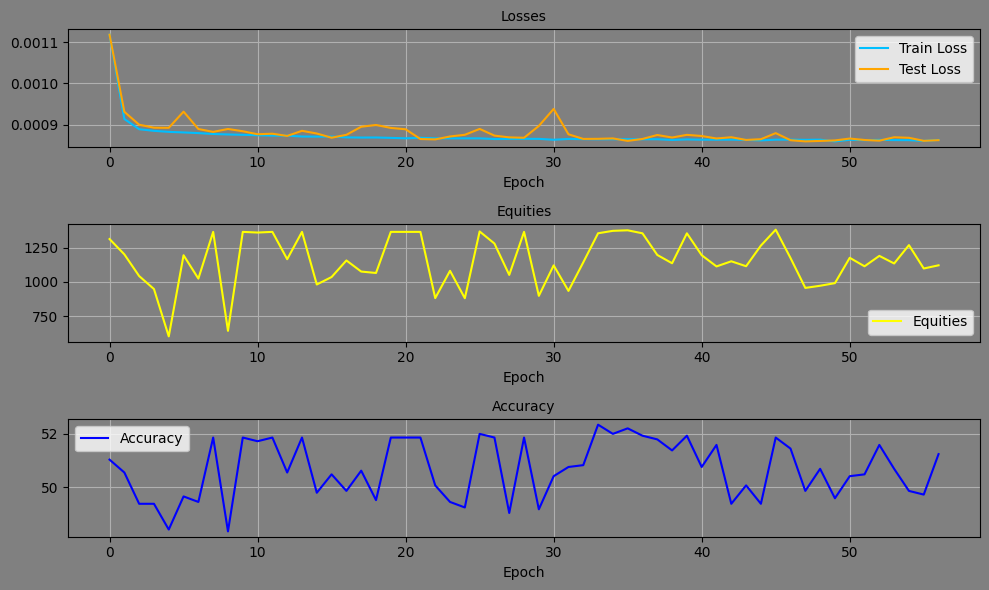

Epoch: 57, Equity: 1090.31, Accuracy: 50.41 train_losses: 0.0020159744054845143, test_losses: 0.0008597703417763114, Duration: 0:00:01.048176


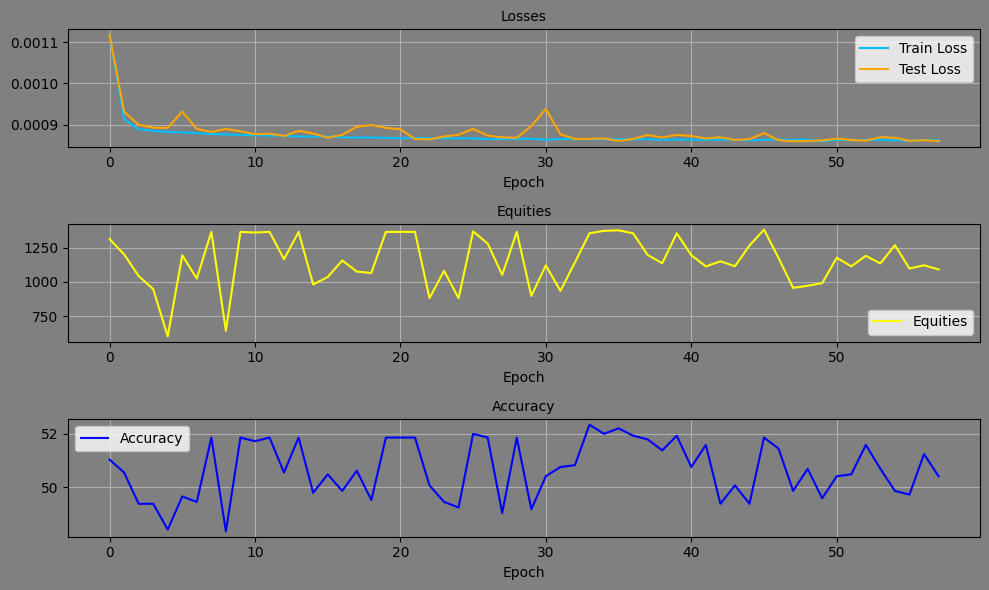

Epoch: 58, Equity: 1311.59, Accuracy: 51.93 train_losses: 0.0020202813191442853, test_losses: 0.0008615255355834961, Duration: 0:00:01.138039


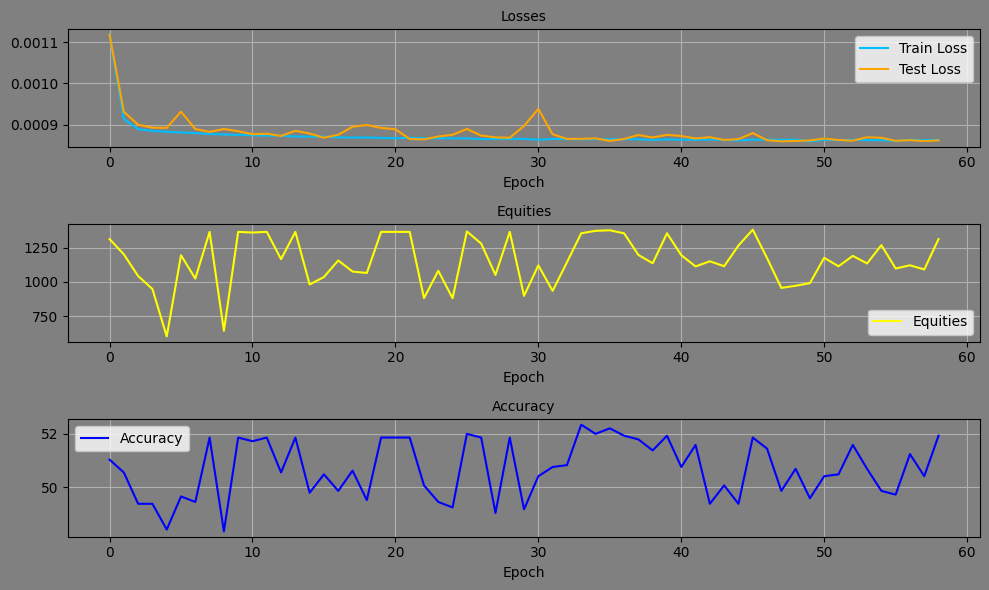

Epoch: 59, Equity: 1149.90, Accuracy: 50.55 train_losses: 0.002017670311450985, test_losses: 0.0008610310615040362, Duration: 0:00:01.076959


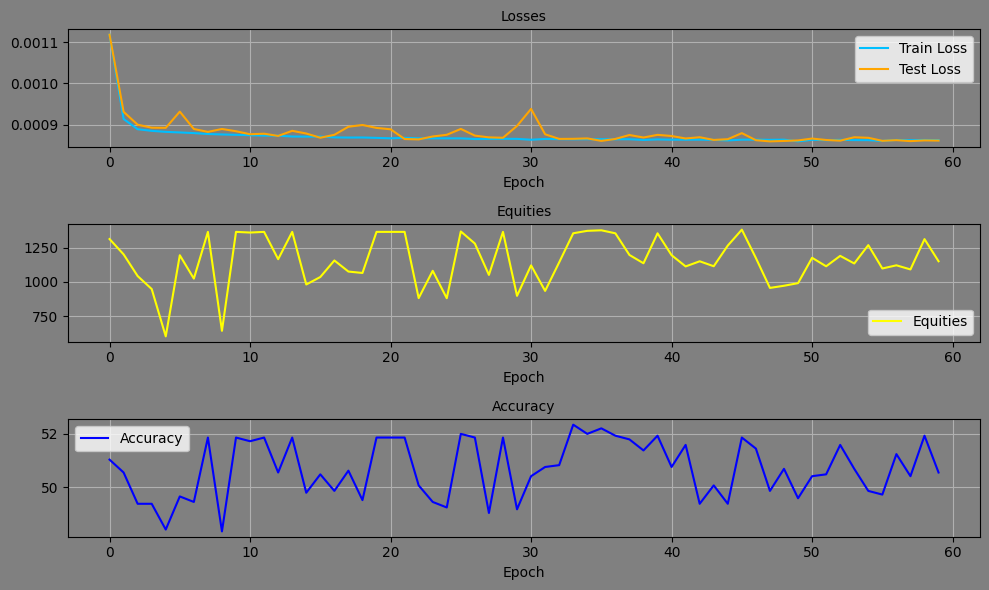

Epoch: 60, Equity: 1062.35, Accuracy: 49.66 train_losses: 0.0020159518912202584, test_losses: 0.0008673197589814663, Duration: 0:00:01.055462


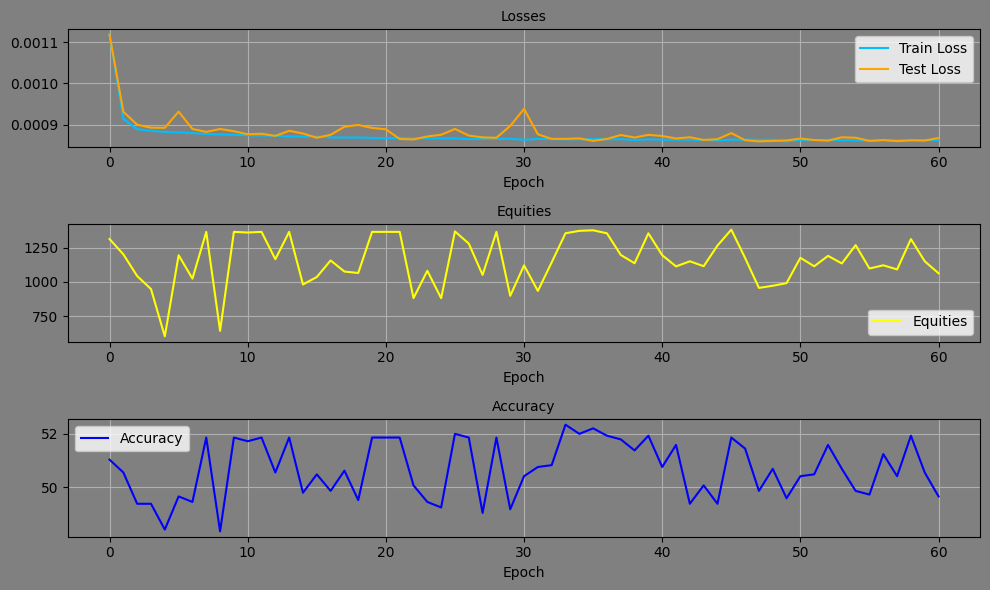

Epoch: 61, Equity: 1310.56, Accuracy: 52.07 train_losses: 0.002019067647062429, test_losses: 0.0008581060683354735, Duration: 0:00:01.091524


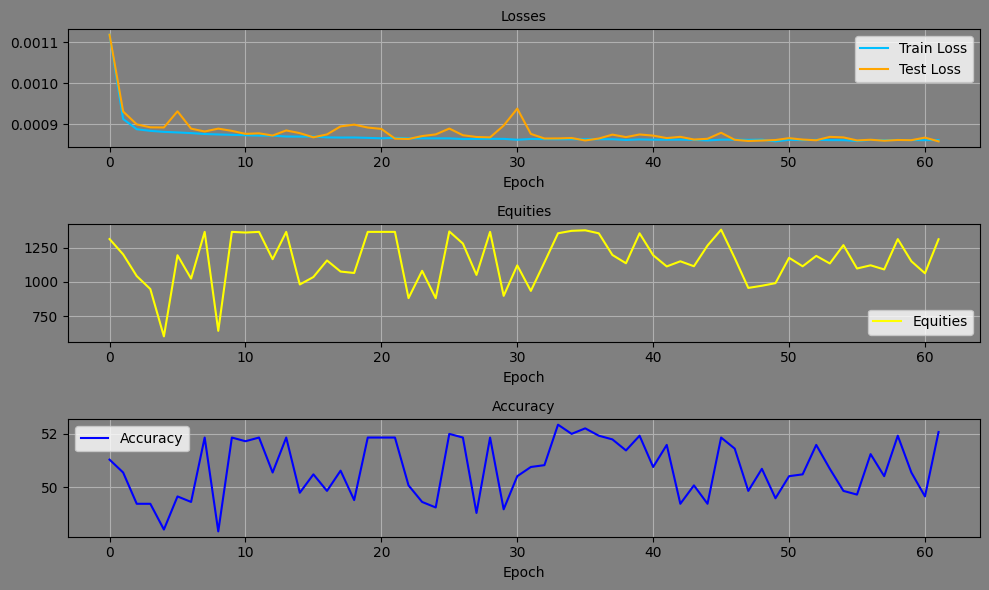

Epoch: 62, Equity: 1170.03, Accuracy: 50.00 train_losses: 0.0020183646979685006, test_losses: 0.0008778221090324223, Duration: 0:00:01.143965


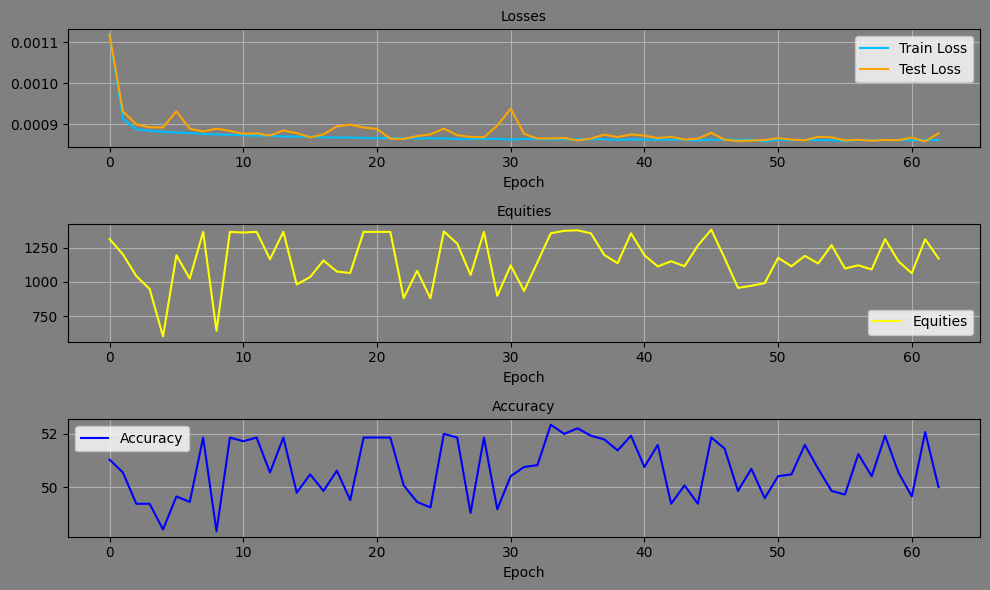

Epoch: 63, Equity: 1089.15, Accuracy: 49.79 train_losses: 0.002012342415077405, test_losses: 0.0008614936377853155, Duration: 0:00:01.081256


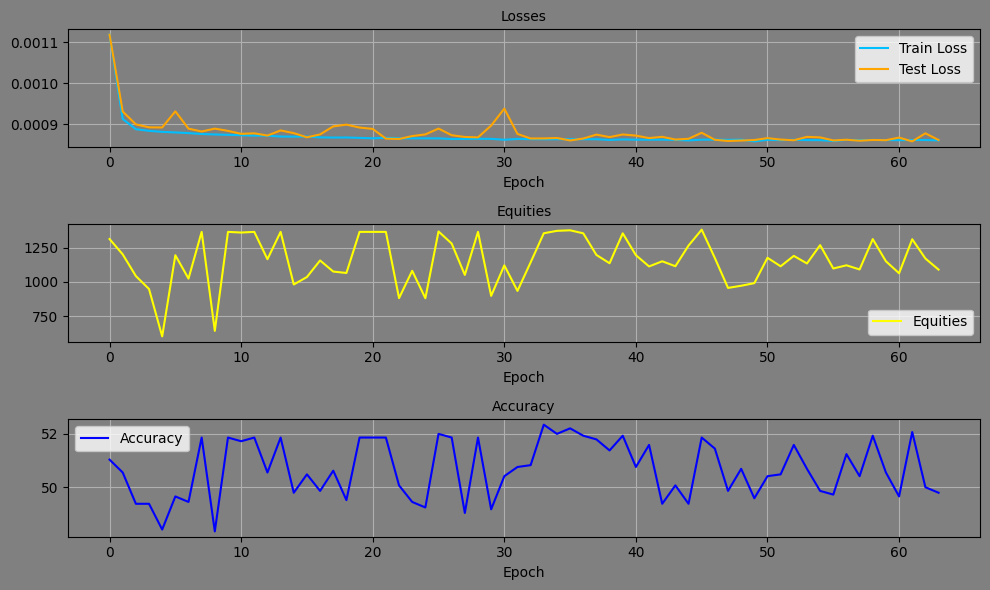

Epoch: 64, Equity: 1116.40, Accuracy: 50.07 train_losses: 0.00201834562212883, test_losses: 0.0008607808849774301, Duration: 0:00:01.065629


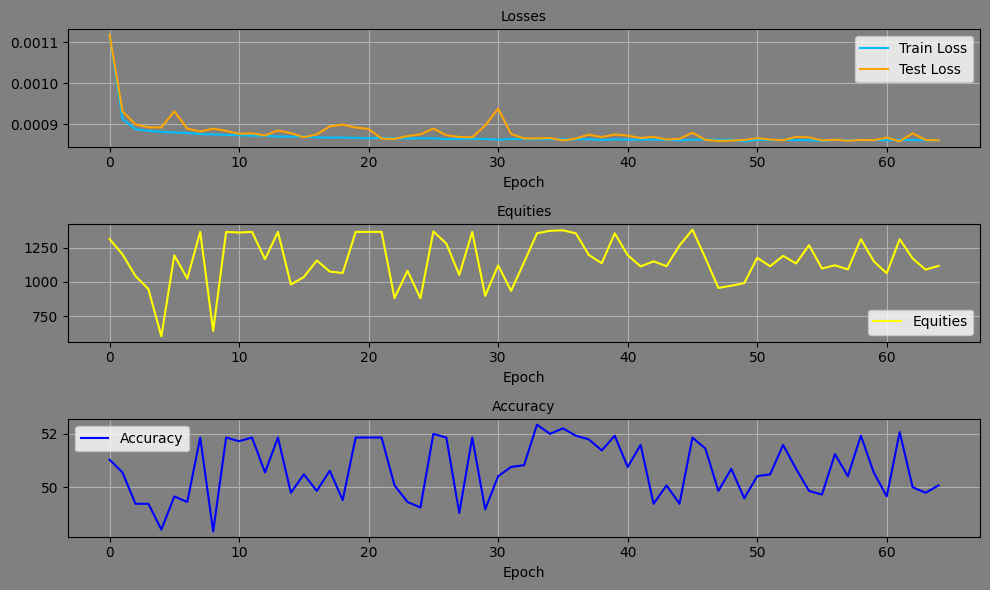

Epoch: 65, Equity: 1138.80, Accuracy: 50.96 train_losses: 0.002015308702095849, test_losses: 0.000858350598718971, Duration: 0:00:01.128371


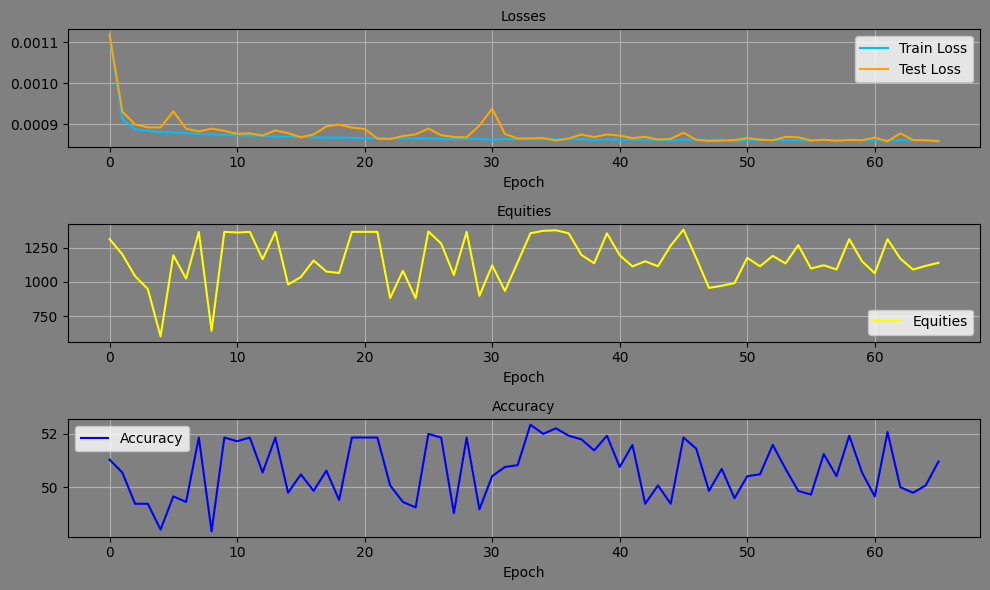

Epoch: 66, Equity: 1122.43, Accuracy: 50.21 train_losses: 0.0020149411096598113, test_losses: 0.0008676450233906507, Duration: 0:00:01.107672


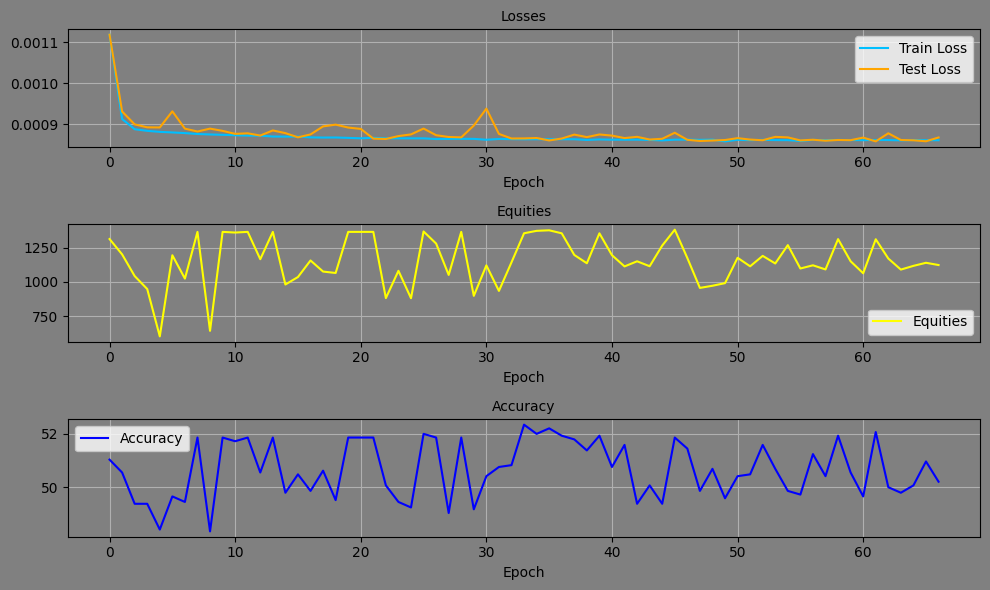

Epoch: 67, Equity: 1295.99, Accuracy: 49.72 train_losses: 0.002017511902848512, test_losses: 0.0008603943861089647, Duration: 0:00:01.170016


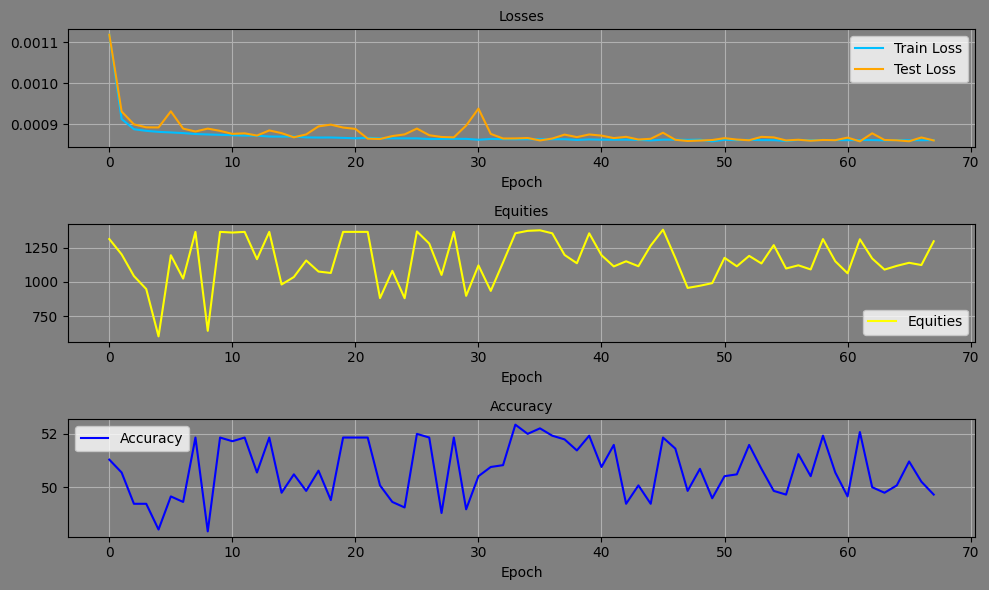

Epoch: 68, Equity: 1075.92, Accuracy: 50.96 train_losses: 0.002013416319716668, test_losses: 0.0008580666617490351, Duration: 0:00:01.119500


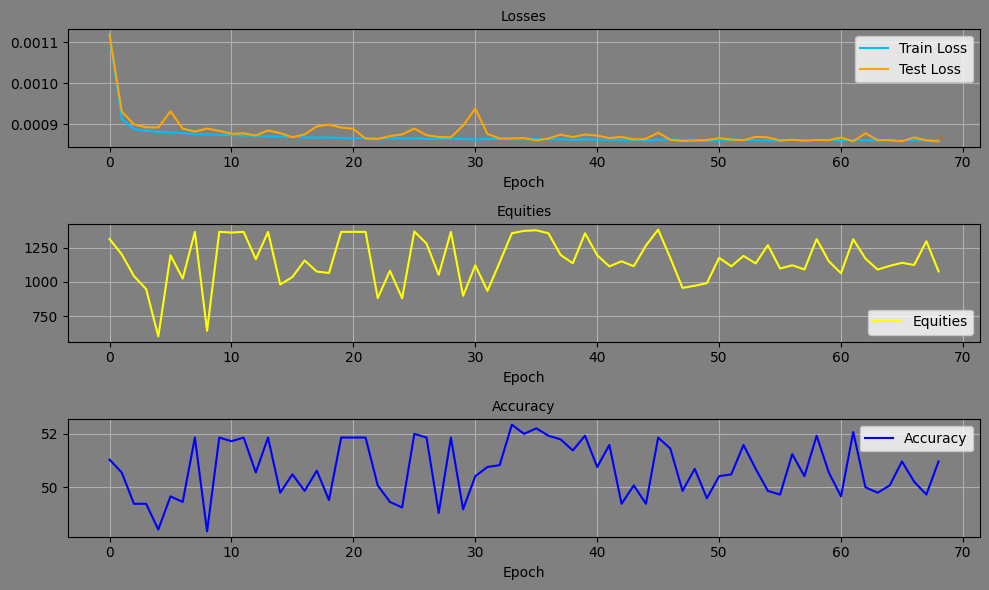

Epoch: 69, Equity: 856.18, Accuracy: 48.83 train_losses: 0.0020145648789148124, test_losses: 0.0008756853640079498, Duration: 0:00:01.123046


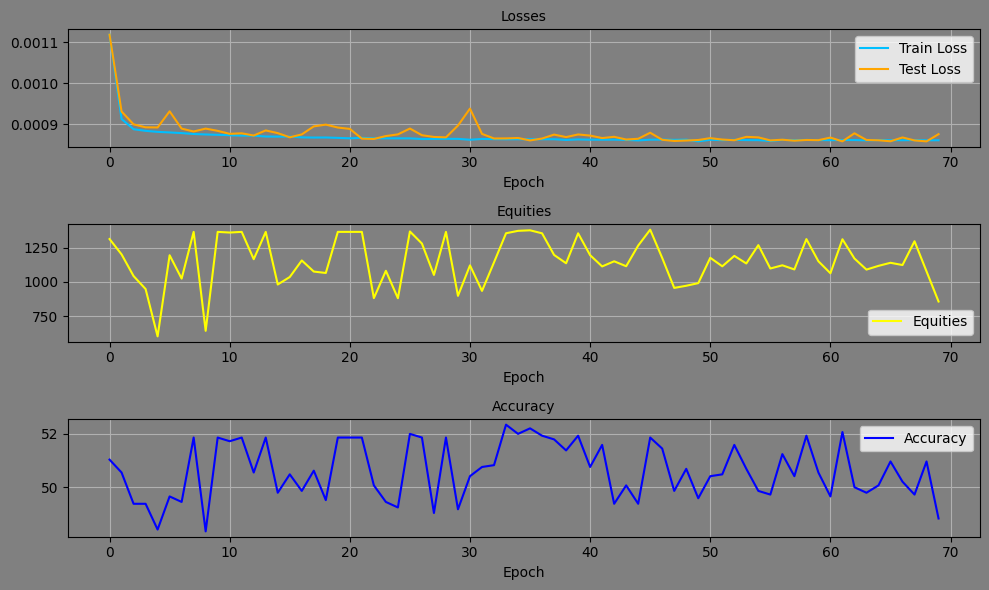

Epoch: 70, Equity: 1093.11, Accuracy: 52.07 train_losses: 0.0020142693085492486, test_losses: 0.0008576135733164847, Duration: 0:00:01.123347


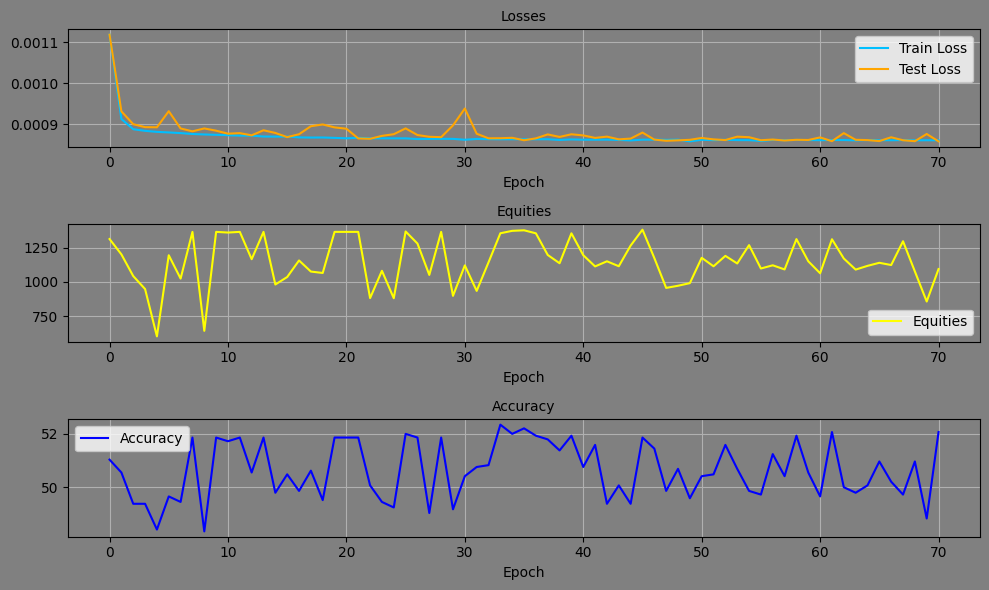

Epoch: 71, Equity: 1140.95, Accuracy: 50.90 train_losses: 0.002014621327202233, test_losses: 0.0008581110159866512, Duration: 0:00:01.088237


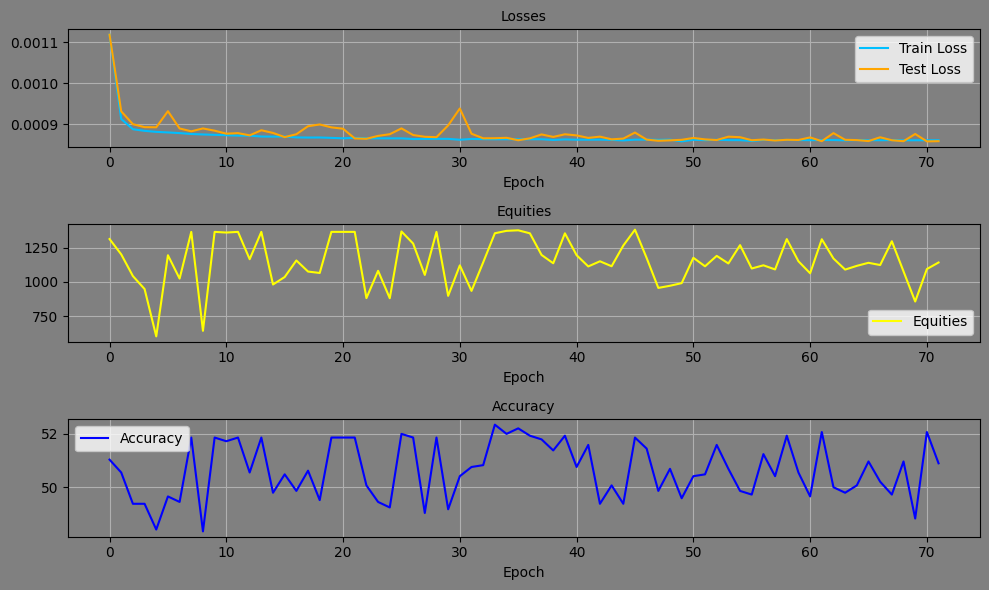

Epoch: 72, Equity: 1175.82, Accuracy: 52.00 train_losses: 0.0020146681607941226, test_losses: 0.0008665108471177518, Duration: 0:00:01.078101


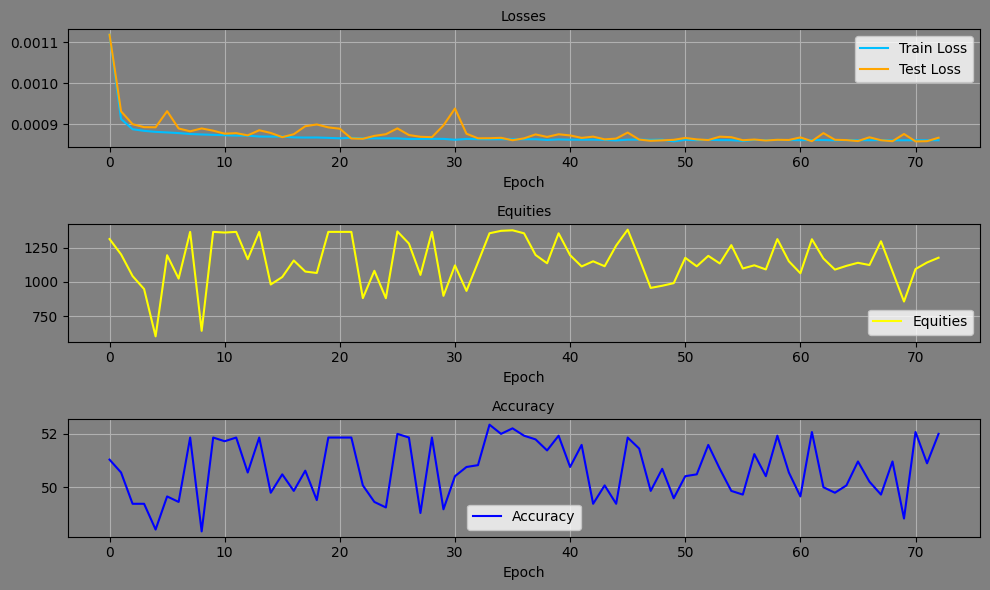

Epoch: 73, Equity: 1084.66, Accuracy: 49.79 train_losses: 0.0020141823581957315, test_losses: 0.0008598195272497833, Duration: 0:00:01.063489


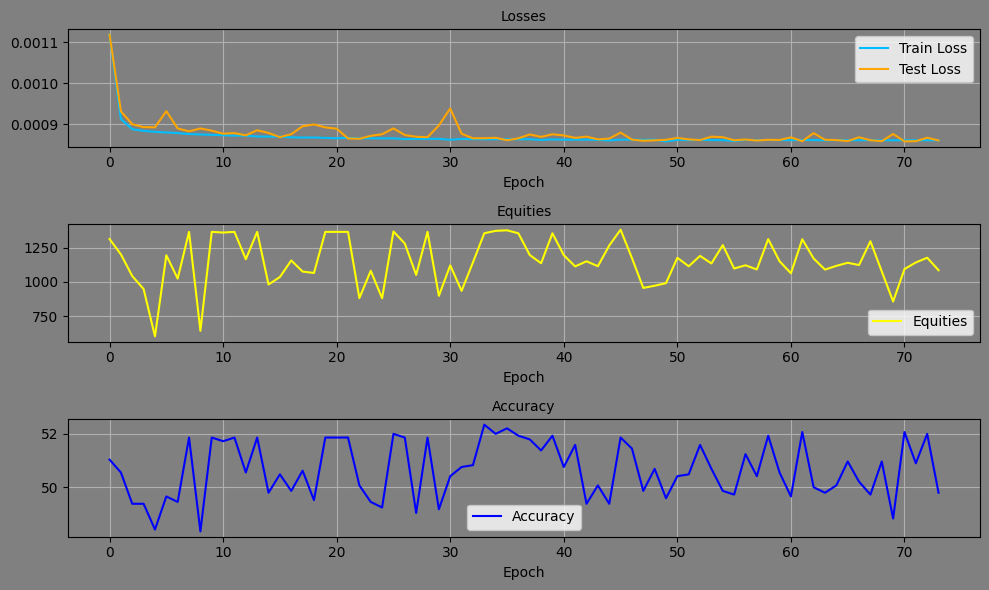

Epoch: 74, Equity: 1067.55, Accuracy: 51.24 train_losses: 0.002011532799193075, test_losses: 0.0008587018237449229, Duration: 0:00:01.070640


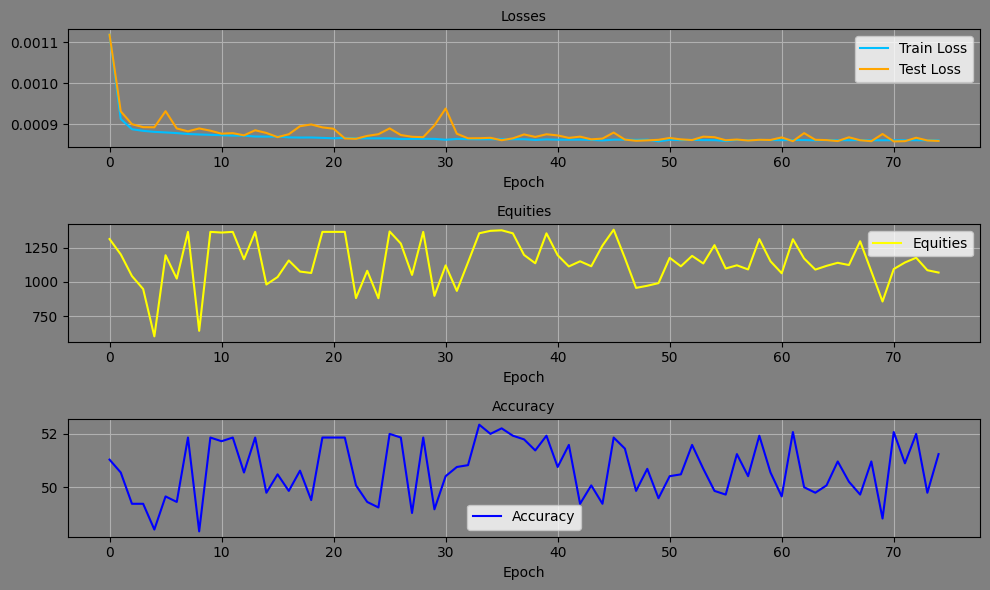

Epoch: 75, Equity: 1042.15, Accuracy: 50.83 train_losses: 0.0020121386495634153, test_losses: 0.0008596493280492723, Duration: 0:00:01.115405


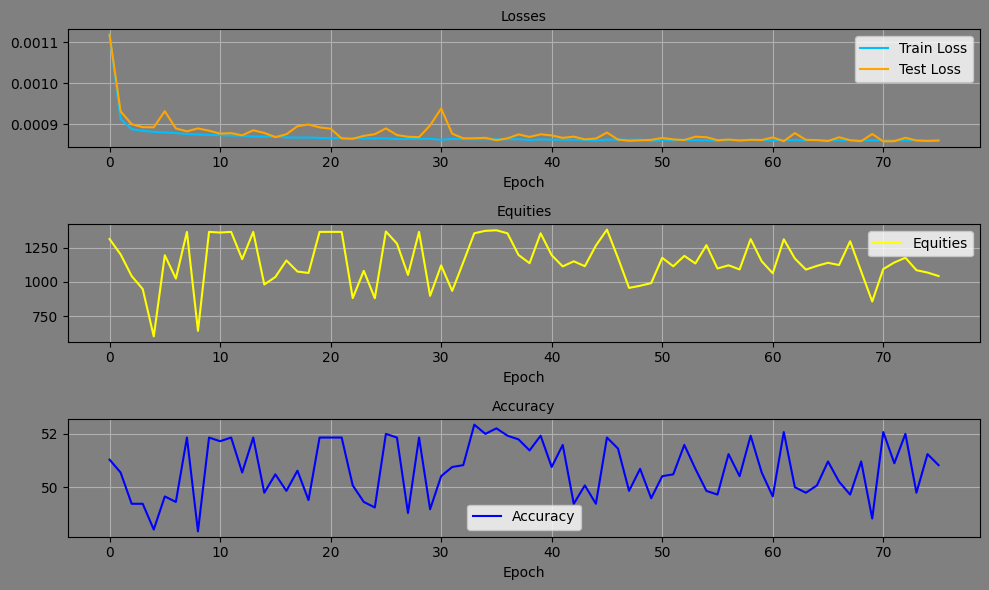

Epoch: 76, Equity: 1198.86, Accuracy: 49.72 train_losses: 0.0020116220103613496, test_losses: 0.0008624207694083452, Duration: 0:00:01.042150


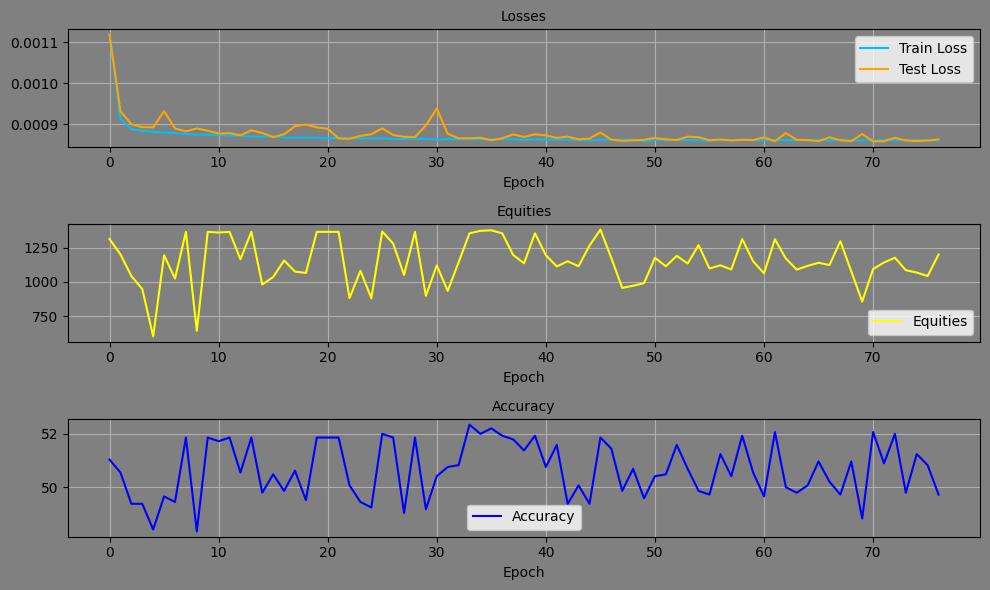

Epoch: 77, Equity: 1127.84, Accuracy: 51.24 train_losses: 0.0020101083247291464, test_losses: 0.0008601358276791871, Duration: 0:00:01.025738


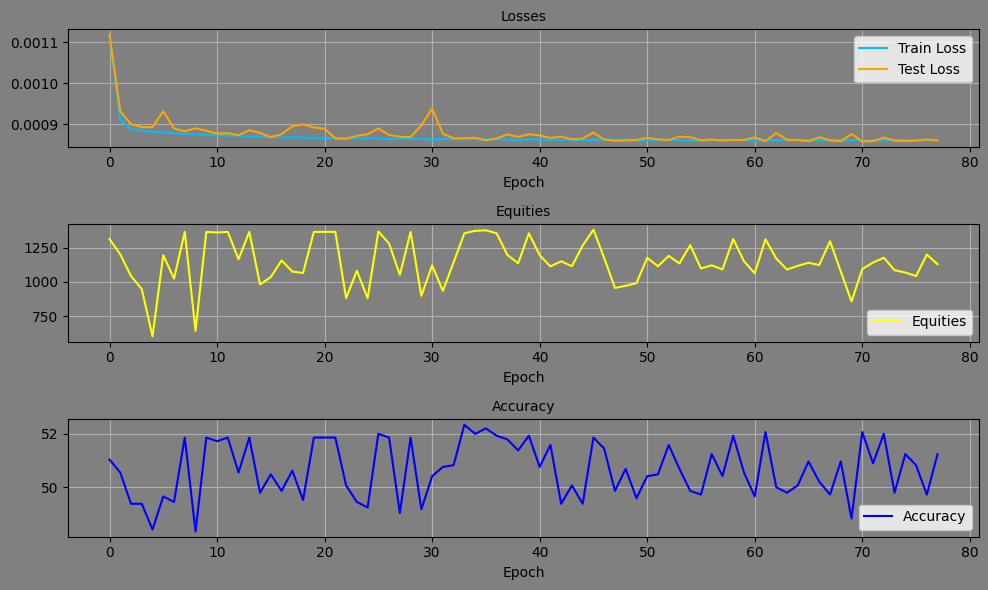

Epoch: 78, Equity: 1036.26, Accuracy: 51.17 train_losses: 0.002008146332037772, test_losses: 0.0008604123722761869, Duration: 0:00:01.017172


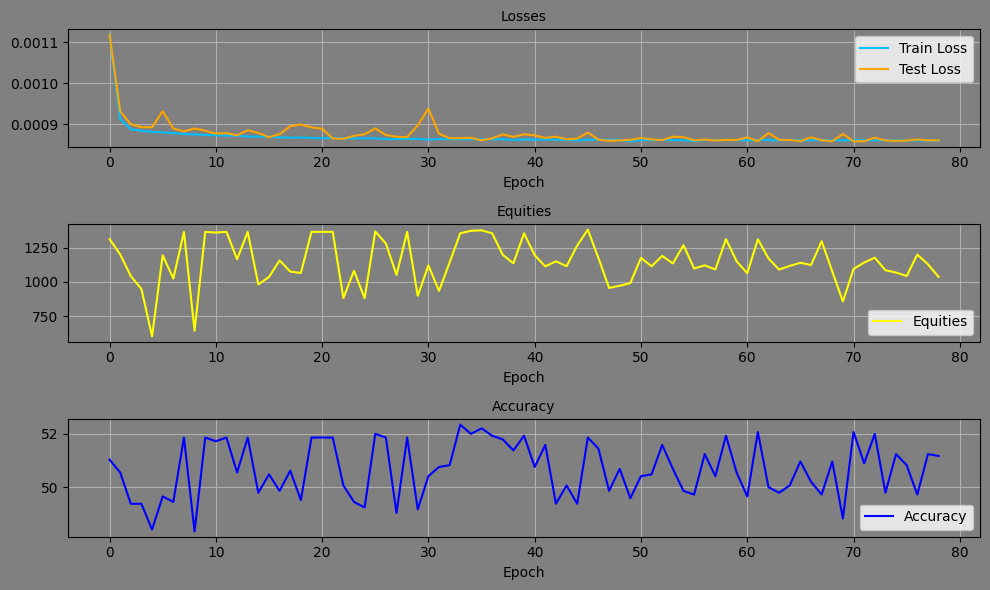

Epoch: 79, Equity: 1195.73, Accuracy: 50.96 train_losses: 0.002006093876817728, test_losses: 0.0008632888202555478, Duration: 0:00:01.097179


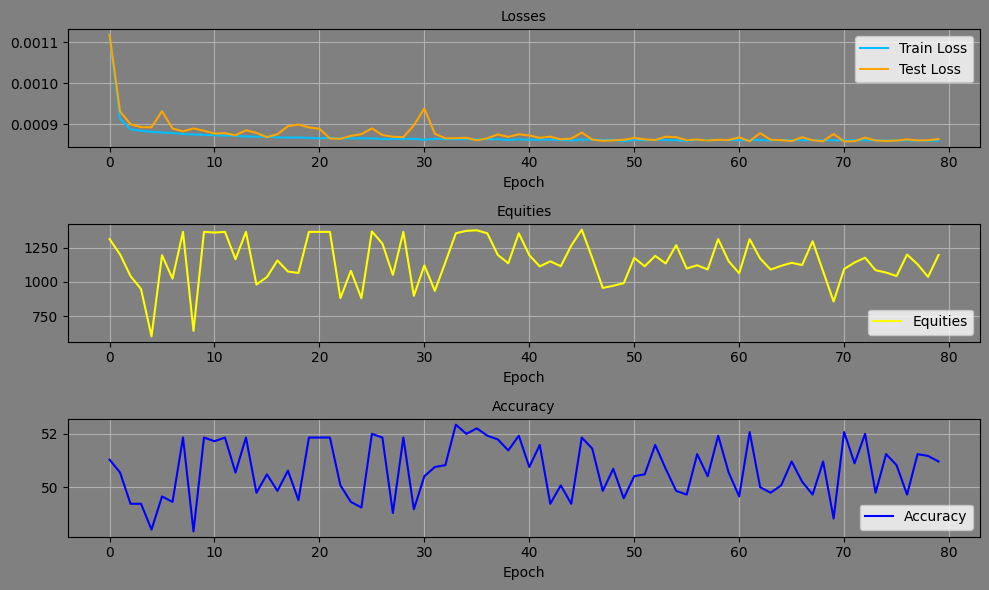

Epoch: 80, Equity: 1151.44, Accuracy: 51.24 train_losses: 0.0020118431817393043, test_losses: 0.0008576716063544154, Duration: 0:00:01.141688


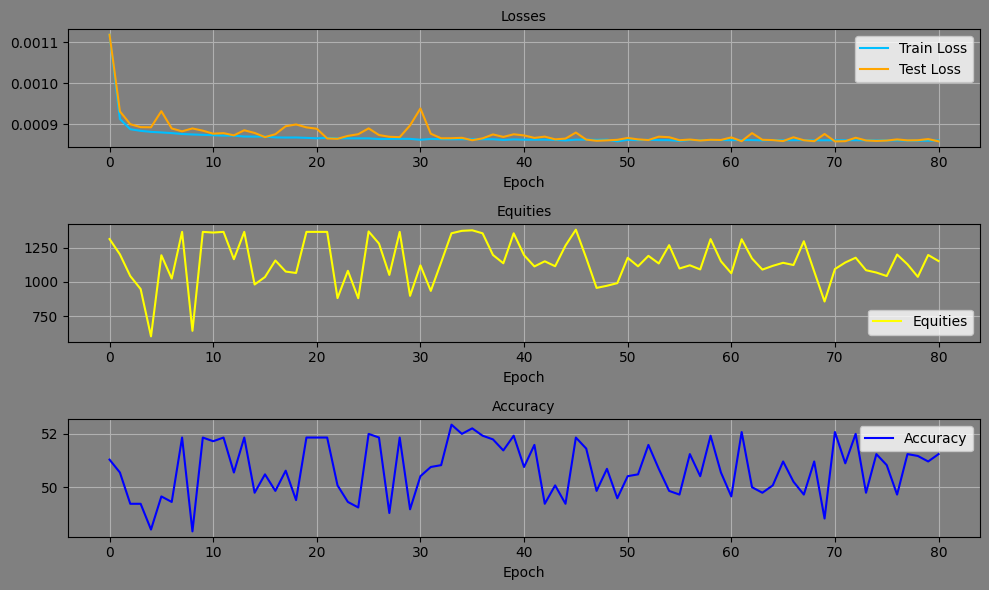

Epoch: 81, Equity: 1094.83, Accuracy: 51.79 train_losses: 0.0020110909977266865, test_losses: 0.0008581160800531507, Duration: 0:00:01.337368


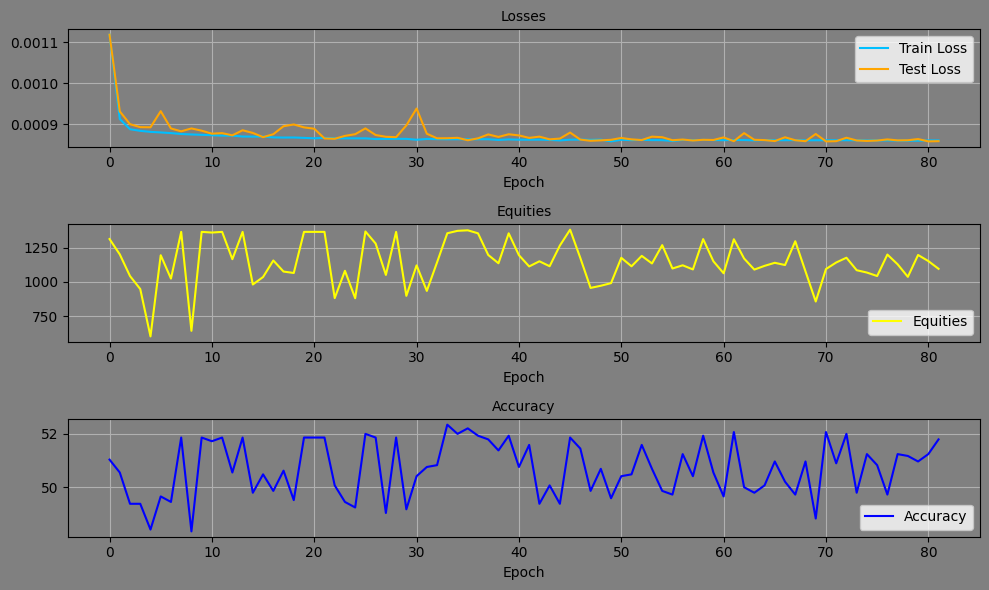

Epoch: 82, Equity: 1163.15, Accuracy: 51.38 train_losses: 0.0020116376886678373, test_losses: 0.0008610698278062046, Duration: 0:00:01.153565


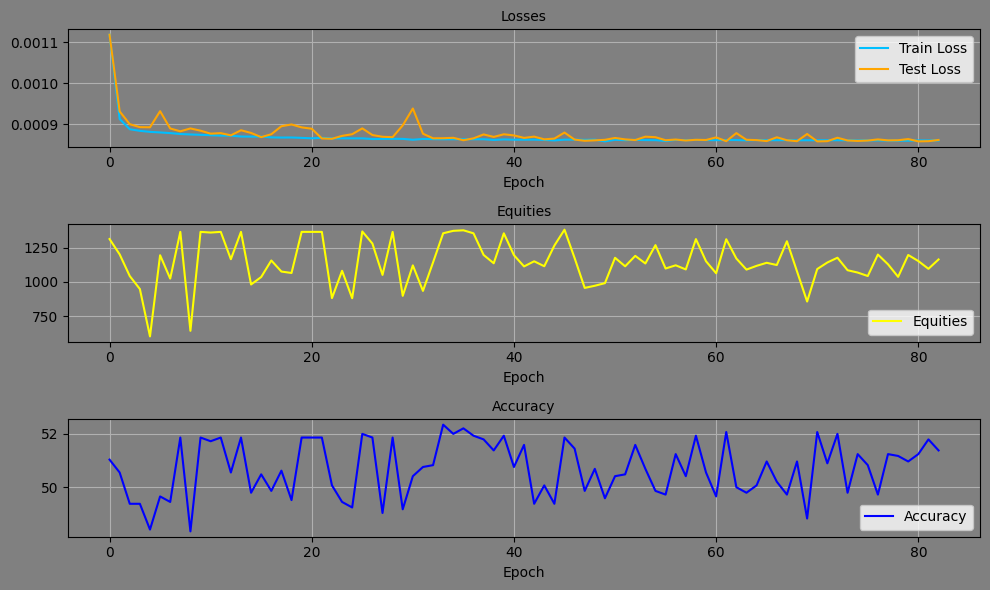

Epoch: 83, Equity: 900.07, Accuracy: 48.83 train_losses: 0.0020060629457048403, test_losses: 0.0008636988932266831, Duration: 0:00:01.181972


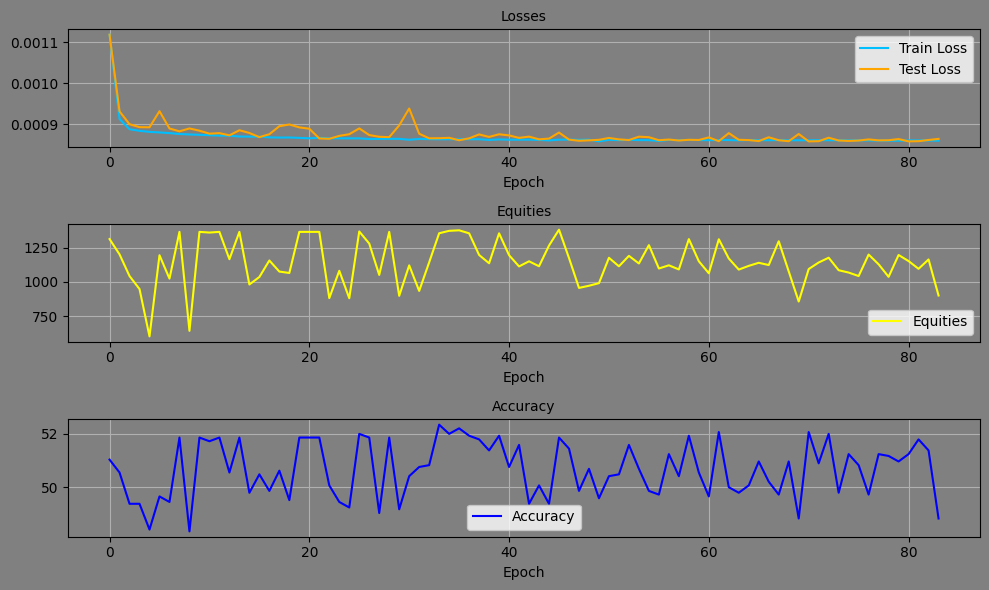

Epoch: 84, Equity: 1124.61, Accuracy: 52.20 train_losses: 0.0020040317953232086, test_losses: 0.000859079766087234, Duration: 0:00:01.190673


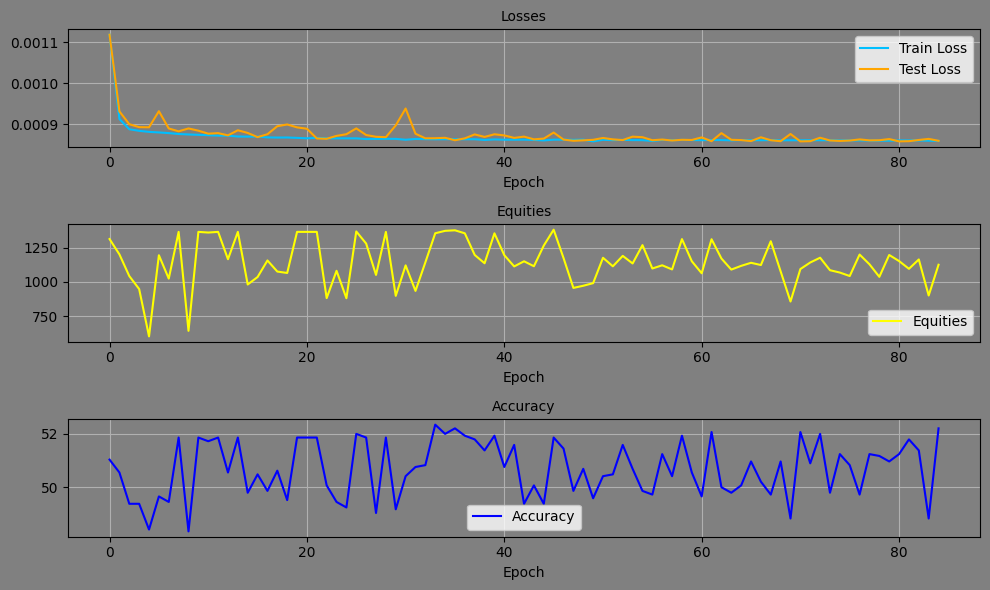

Epoch: 85, Equity: 933.92, Accuracy: 49.31 train_losses: 0.002009273792001983, test_losses: 0.0008606667979620397, Duration: 0:00:01.122284


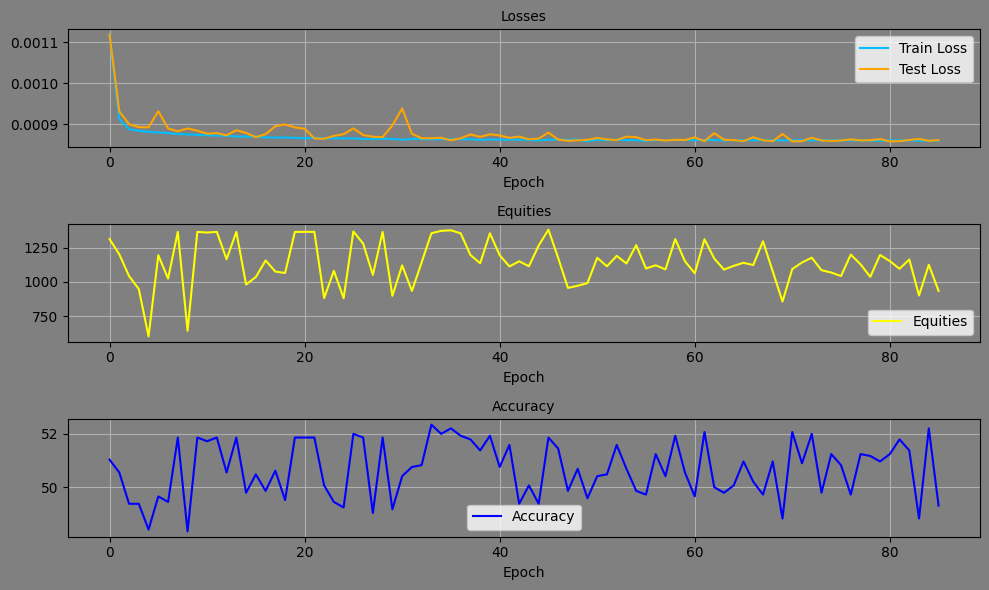

Epoch: 86, Equity: 1082.50, Accuracy: 50.00 train_losses: 0.002008880549807295, test_losses: 0.0008630959782749414, Duration: 0:00:01.174802


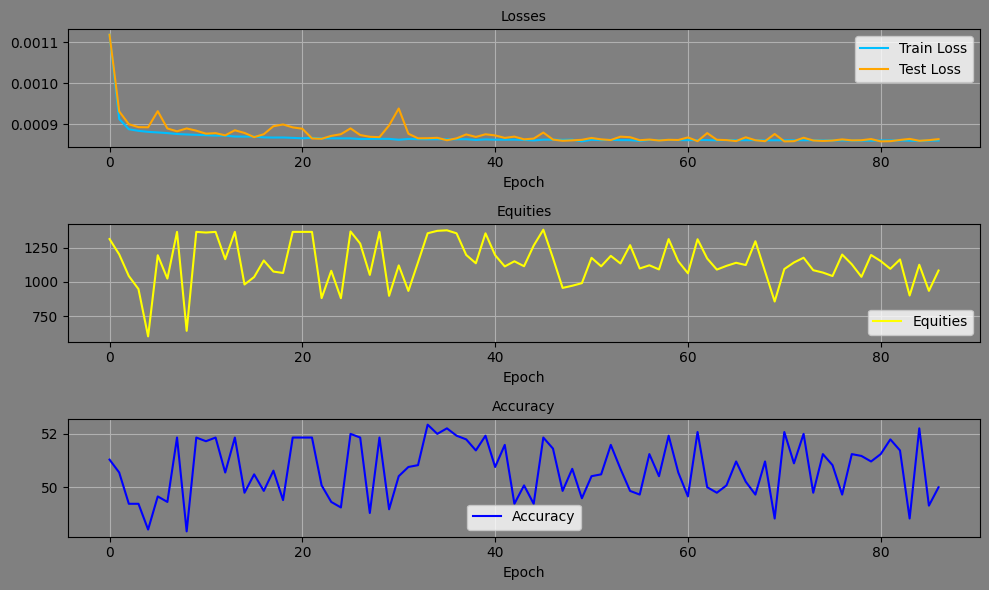

Epoch: 87, Equity: 1035.60, Accuracy: 50.69 train_losses: 0.002009341713457492, test_losses: 0.0008573427912779152, Duration: 0:00:01.137429


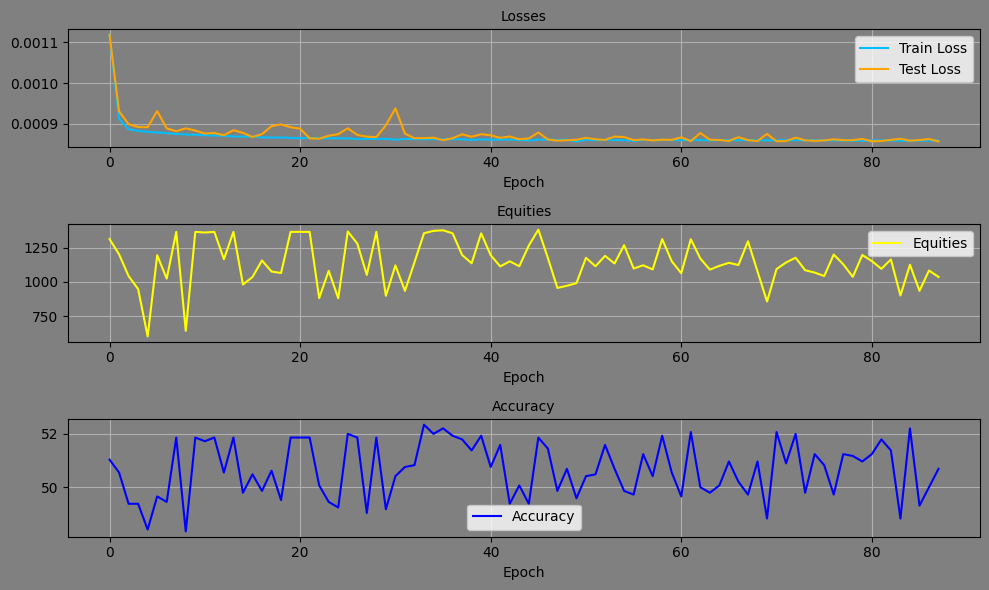

Epoch: 88, Equity: 1081.56, Accuracy: 50.48 train_losses: 0.0020103214284001207, test_losses: 0.0008585478062741458, Duration: 0:00:01.218442


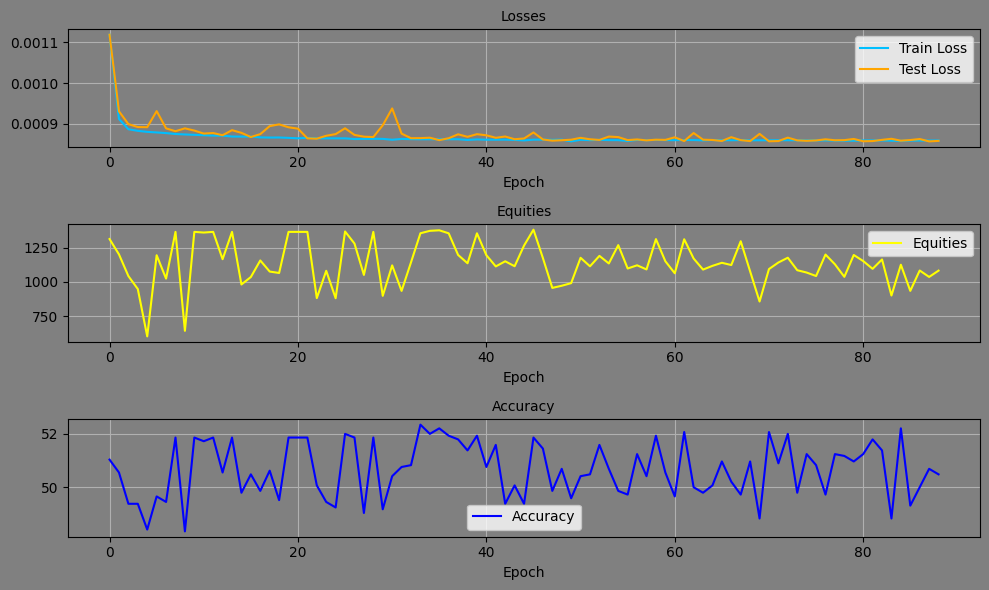

Epoch: 89, Equity: 1077.57, Accuracy: 49.72 train_losses: 0.0020090375631992576, test_losses: 0.0008596080006100237, Duration: 0:00:01.130363


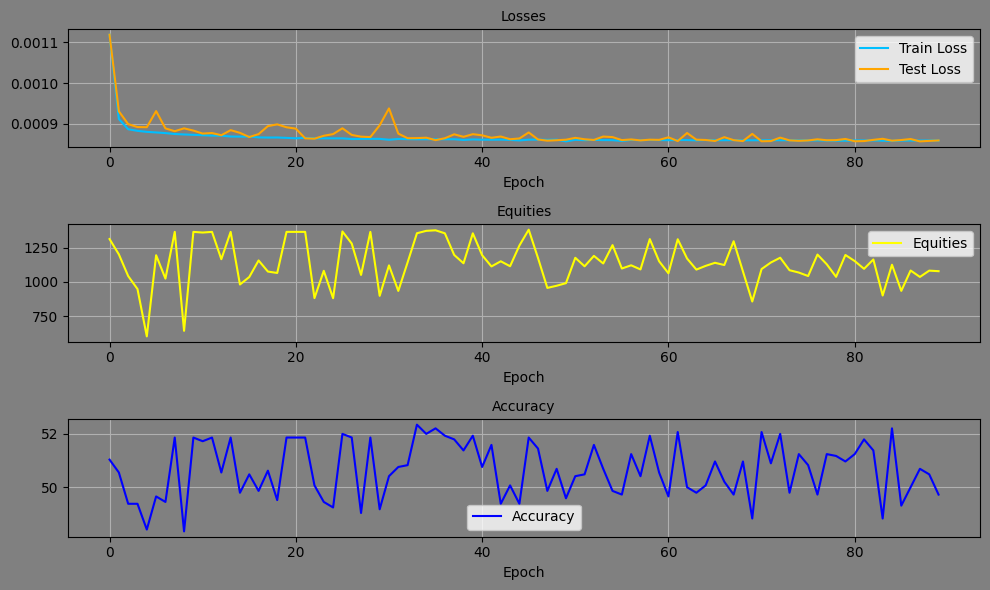

Epoch: 90, Equity: 935.73, Accuracy: 50.07 train_losses: 0.0020049813350180236, test_losses: 0.0008751829154789448, Duration: 0:00:01.229380


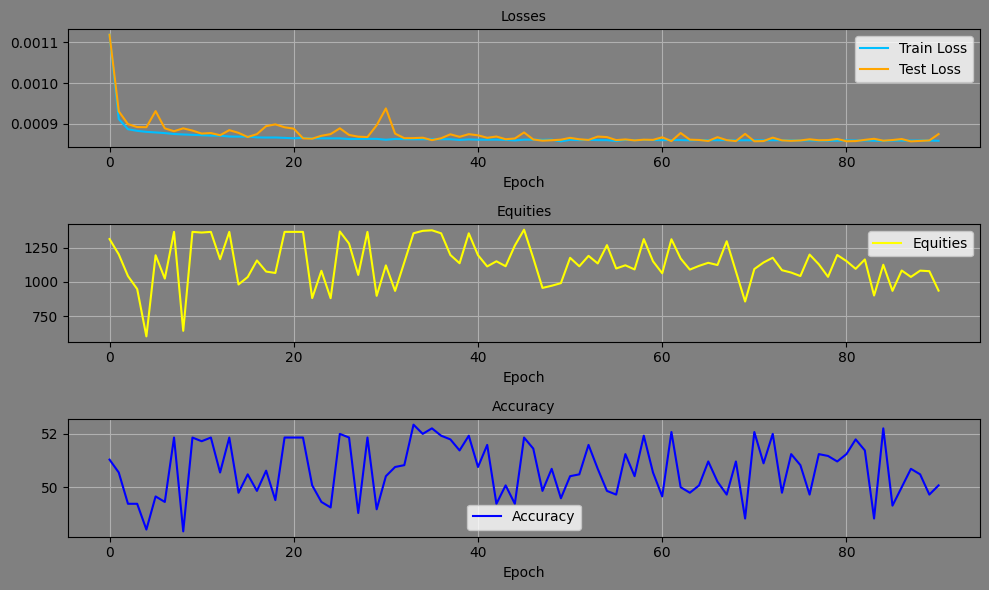

Epoch: 91, Equity: 696.35, Accuracy: 48.21 train_losses: 0.002001943604250382, test_losses: 0.0008714880677871406, Duration: 0:00:01.190973


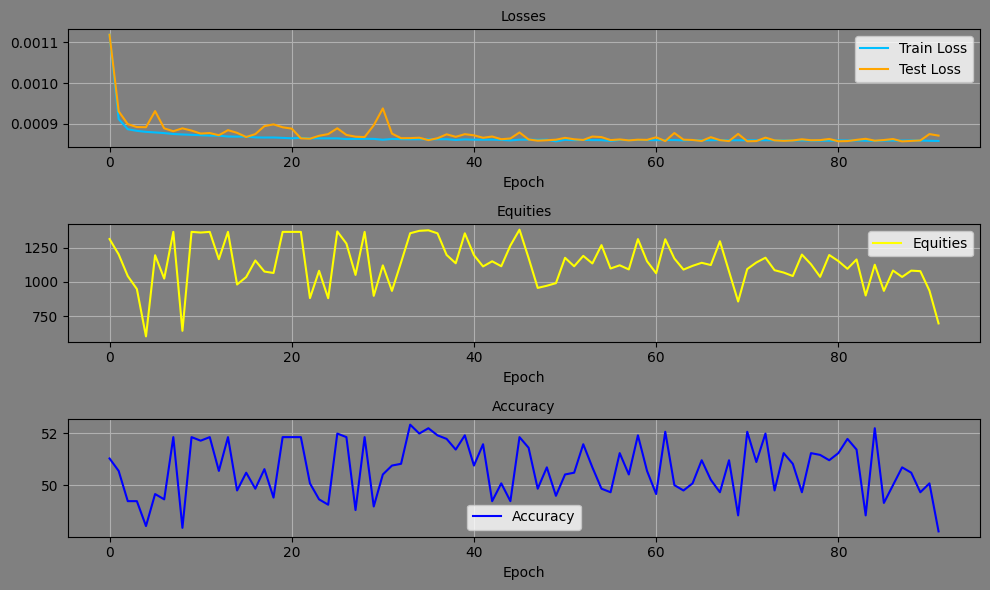

Epoch: 92, Equity: 1123.38, Accuracy: 50.48 train_losses: 0.002007685096931934, test_losses: 0.000857788254506886, Duration: 0:00:01.274685


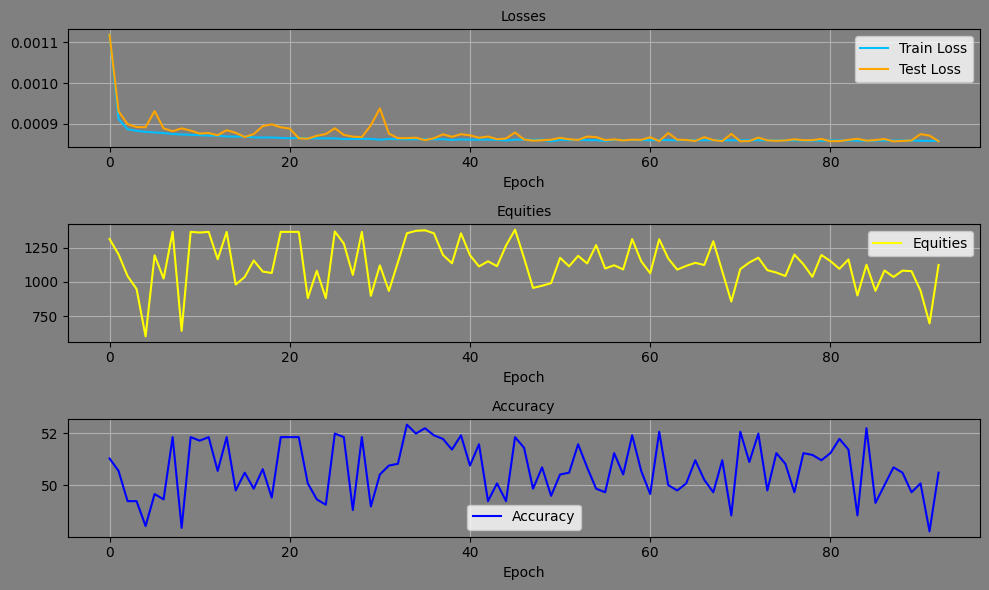

Epoch: 93, Equity: 1036.64, Accuracy: 50.00 train_losses: 0.0020073114555933277, test_losses: 0.0008597353007644415, Duration: 0:00:01.228978


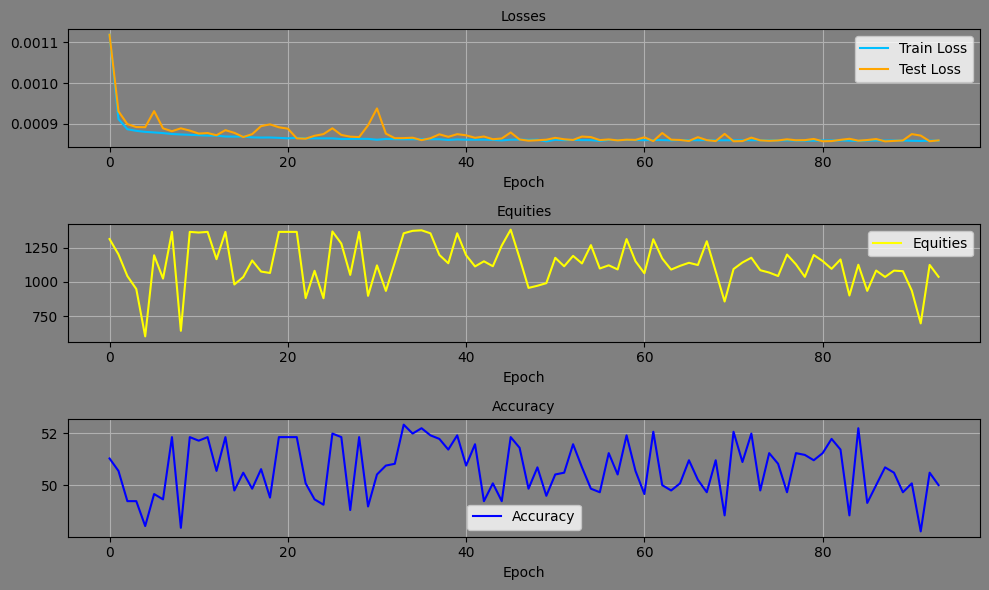

Epoch: 94, Equity: 1038.63, Accuracy: 50.55 train_losses: 0.002002680174005802, test_losses: 0.0008606477058492601, Duration: 0:00:01.242468


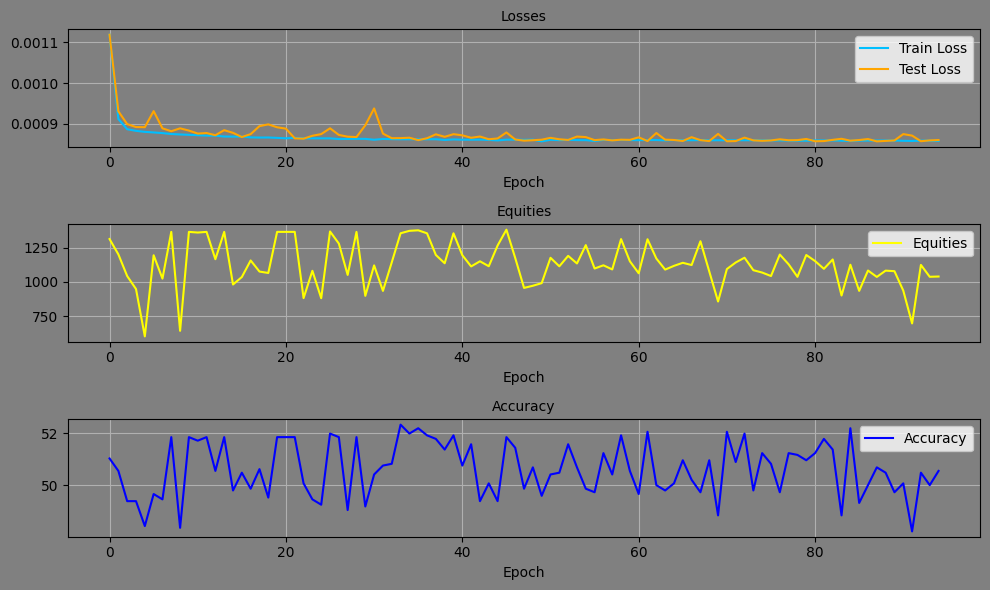

Epoch: 95, Equity: 1015.65, Accuracy: 50.96 train_losses: 0.002004828039301379, test_losses: 0.0008576875552535057, Duration: 0:00:01.228205


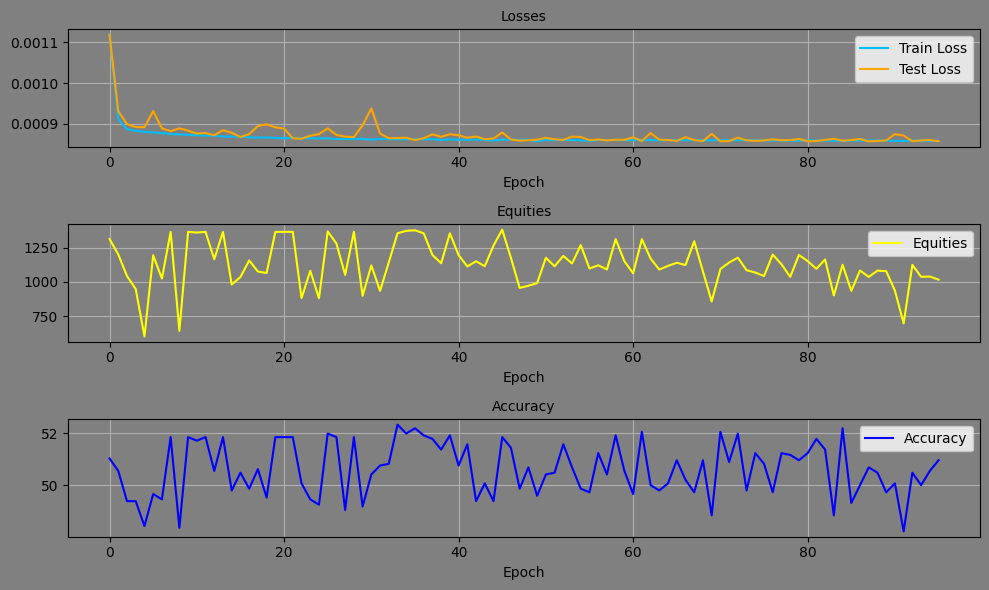

Epoch: 96, Equity: 1082.87, Accuracy: 50.14 train_losses: 0.002009494336552277, test_losses: 0.0008594249375164509, Duration: 0:00:01.126721


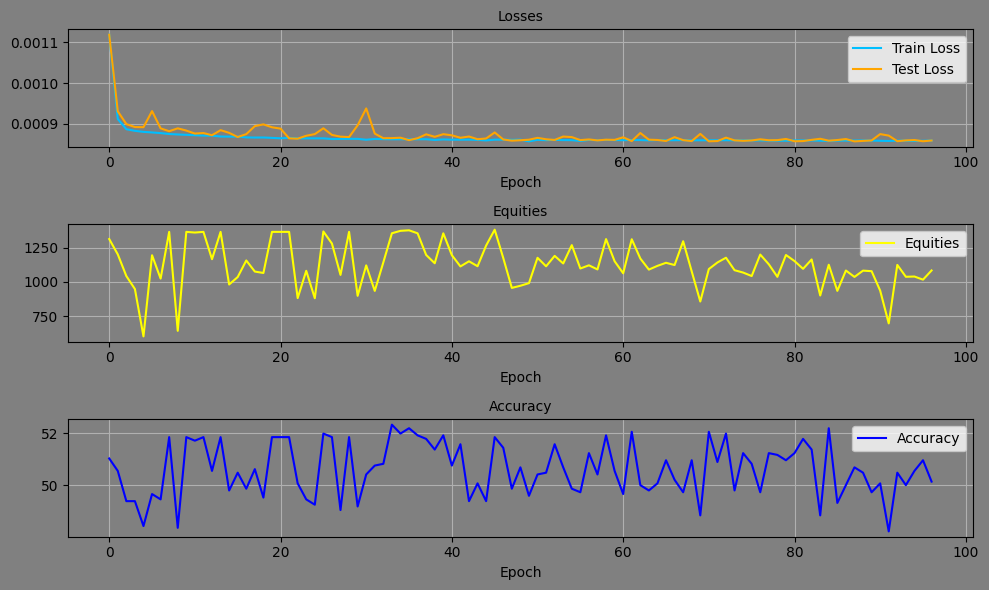

Epoch: 97, Equity: 1190.85, Accuracy: 51.93 train_losses: 0.002002523793387444, test_losses: 0.0008611283265054226, Duration: 0:00:01.203343


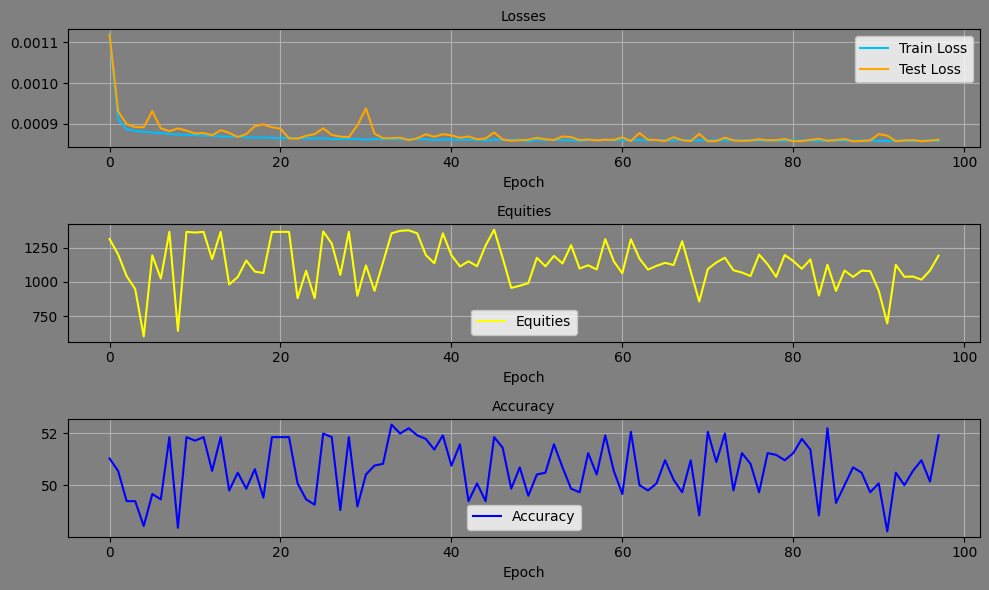

Epoch: 98, Equity: 1012.55, Accuracy: 50.83 train_losses: 0.0020047336985569075, test_losses: 0.0008587233023718, Duration: 0:00:01.176548


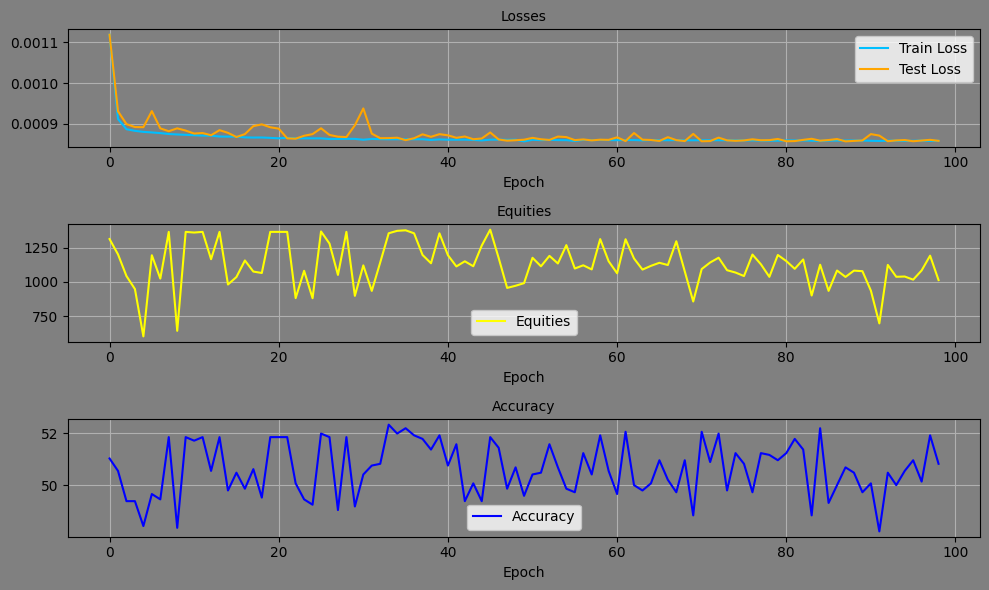

Epoch: 99, Equity: 1214.37, Accuracy: 50.62 train_losses: 0.0020051978319452733, test_losses: 0.0008603725582361221, Duration: 0:00:01.165635


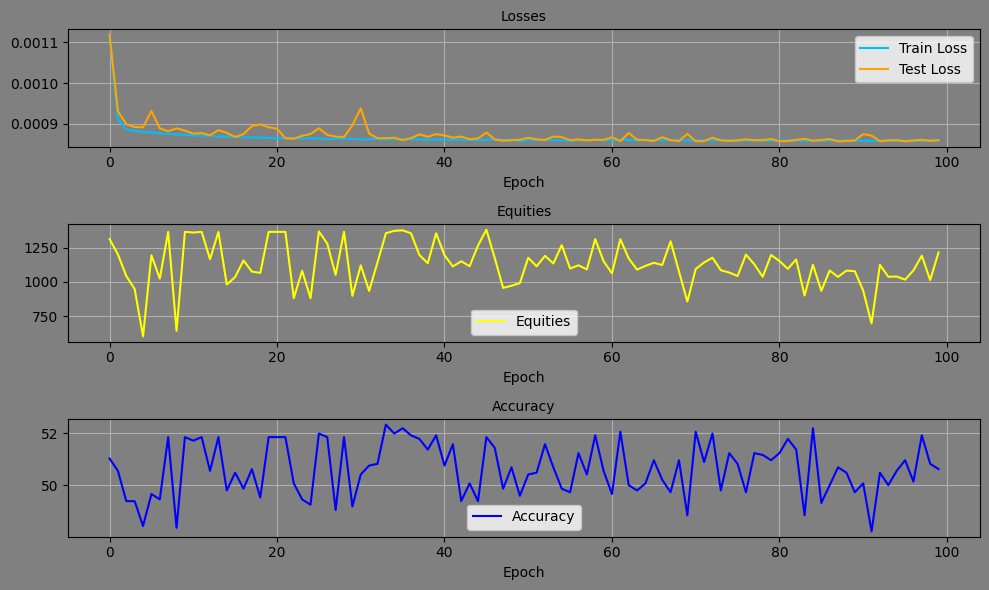

Epoch: 100, Equity: 940.78, Accuracy: 49.59 train_losses: 0.0020041707587072884, test_losses: 0.0008665768546052277, Duration: 0:00:01.263420


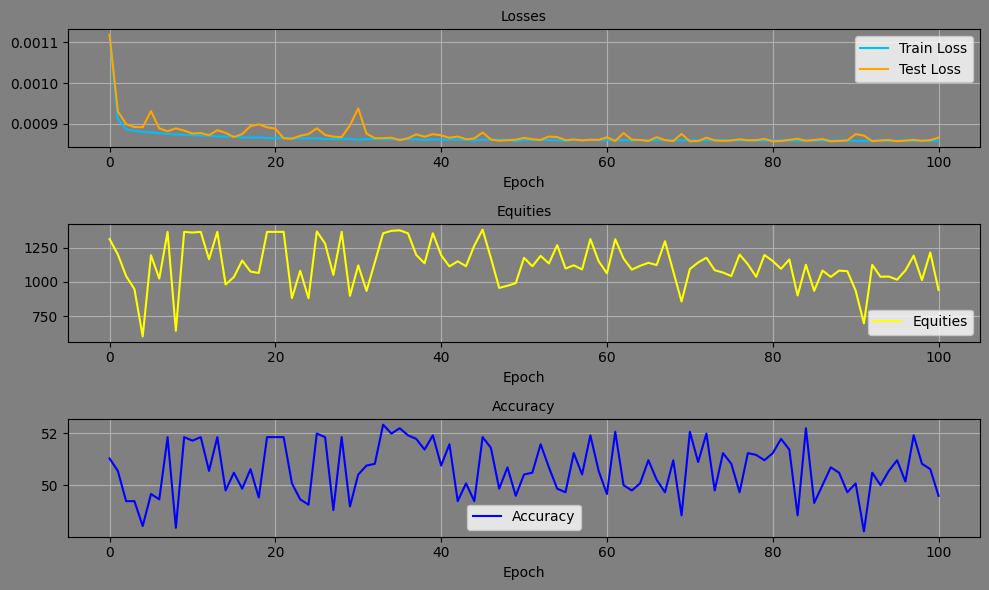

Epoch: 101, Equity: 970.50, Accuracy: 50.07 train_losses: 0.0020039479822374375, test_losses: 0.0008633651887066662, Duration: 0:00:01.179879


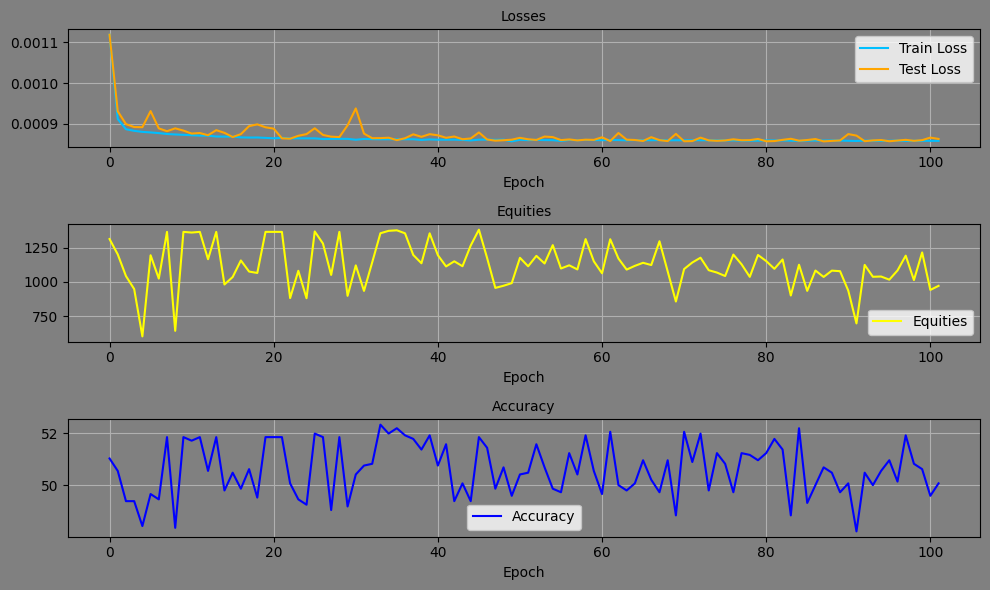

Epoch: 102, Equity: 1104.21, Accuracy: 50.00 train_losses: 0.0019990169904470162, test_losses: 0.000860435888171196, Duration: 0:00:01.162491


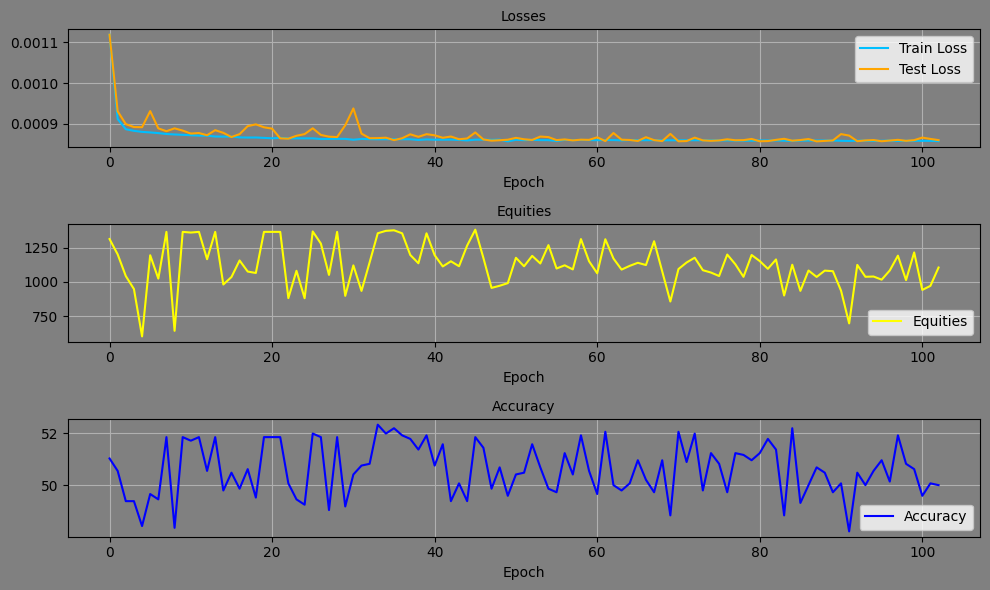

Epoch: 103, Equity: 1001.29, Accuracy: 50.41 train_losses: 0.00200553404461045, test_losses: 0.0008606692426837981, Duration: 0:00:01.155812


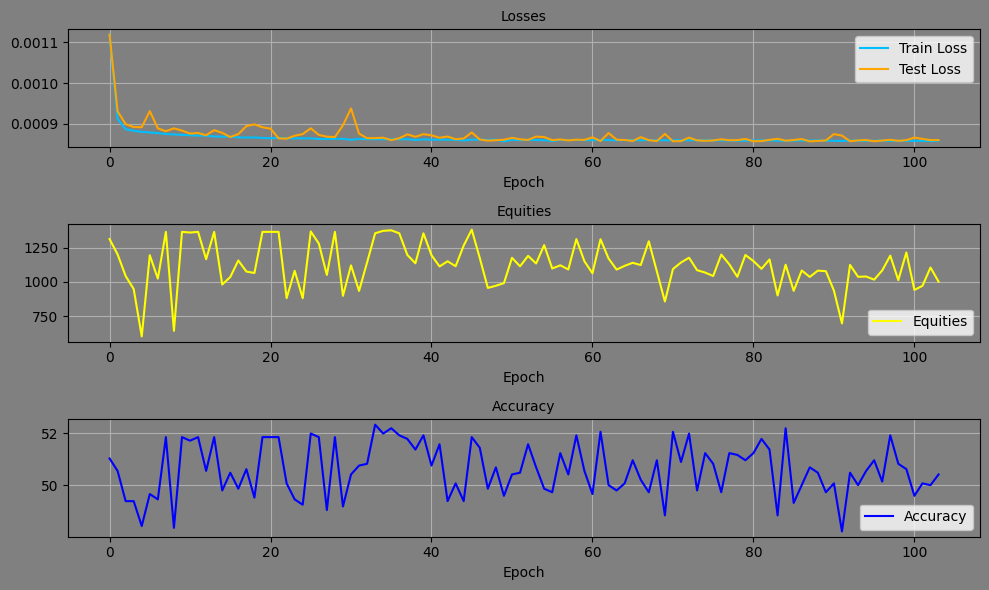

Epoch: 104, Equity: 1079.74, Accuracy: 51.03 train_losses: 0.0020022421361132457, test_losses: 0.0008621438173577189, Duration: 0:00:01.129528


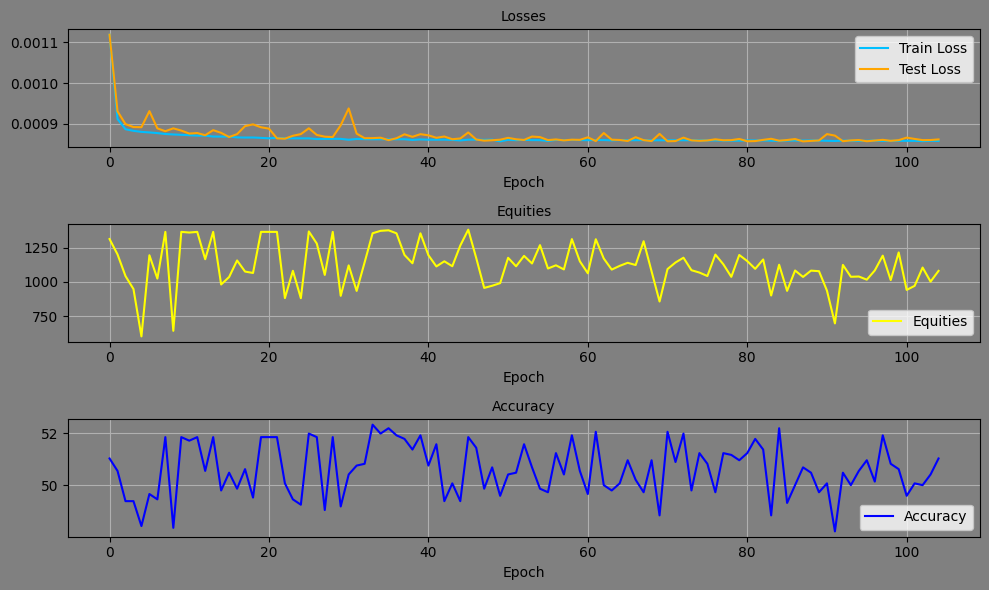

Epoch: 105, Equity: 1333.19, Accuracy: 50.83 train_losses: 0.002003601142397237, test_losses: 0.0008584442548453808, Duration: 0:00:01.151149


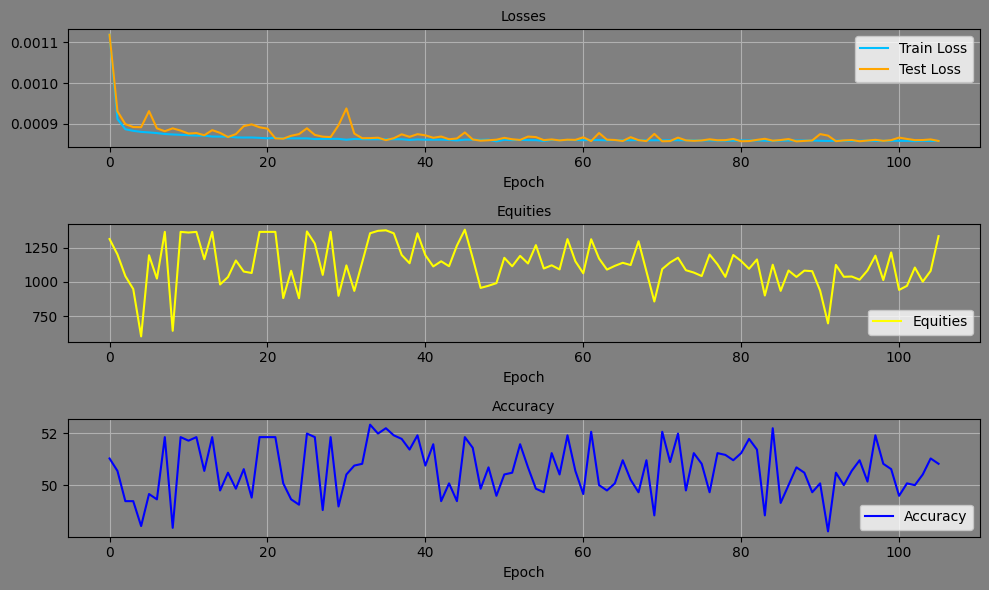

Epoch: 106, Equity: 1226.19, Accuracy: 51.52 train_losses: 0.0019992836815718976, test_losses: 0.0008573464001528919, Duration: 0:00:01.173945


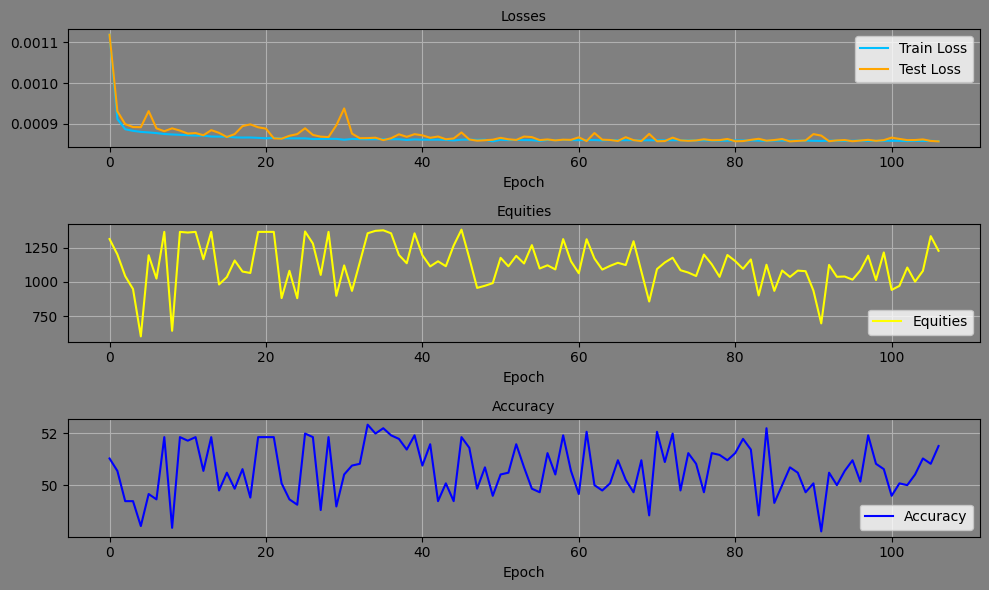

Epoch: 107, Equity: 1195.87, Accuracy: 50.55 train_losses: 0.001990806306674776, test_losses: 0.0008633972611278296, Duration: 0:00:01.161712


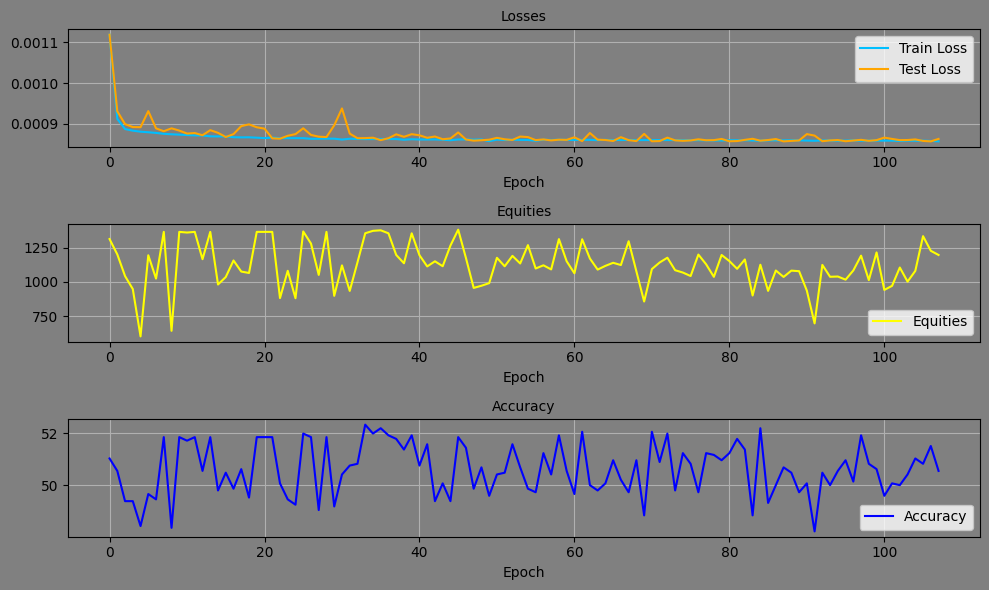

Epoch: 108, Equity: 1077.57, Accuracy: 51.45 train_losses: 0.0020020678512147863, test_losses: 0.0008557034889236093, Duration: 0:00:01.244585


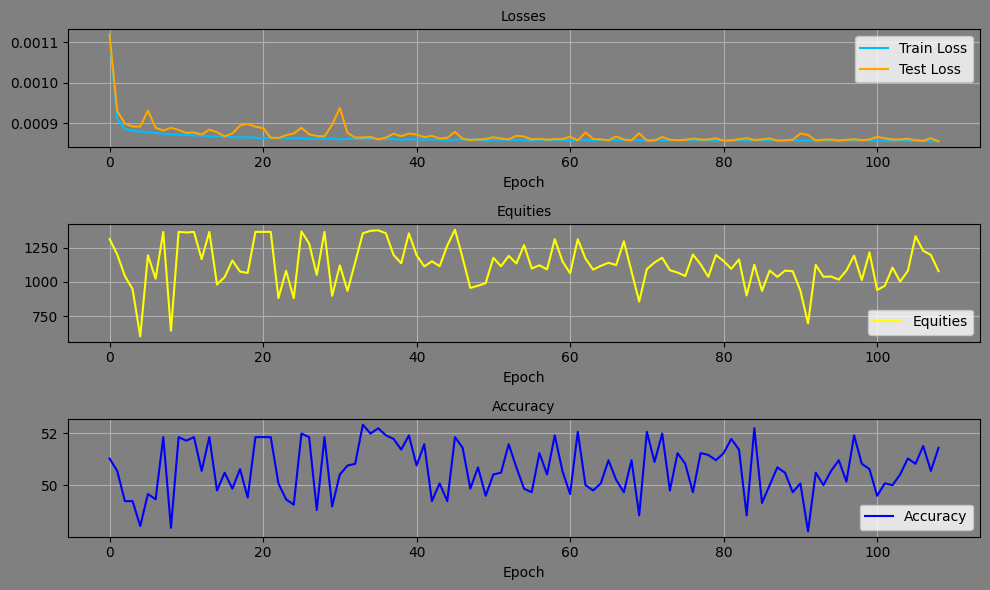

Epoch: 109, Equity: 1171.70, Accuracy: 51.86 train_losses: 0.002003474892692901, test_losses: 0.0008548092446289957, Duration: 0:00:01.221118


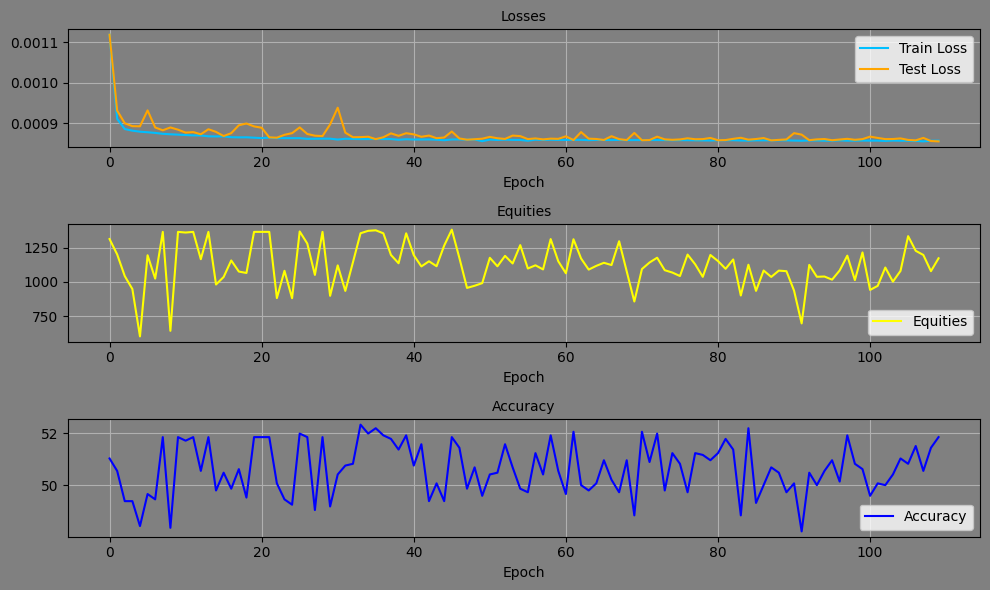

Epoch: 110, Equity: 1106.60, Accuracy: 51.38 train_losses: 0.0020012726234714417, test_losses: 0.0008571527432650328, Duration: 0:00:01.230428


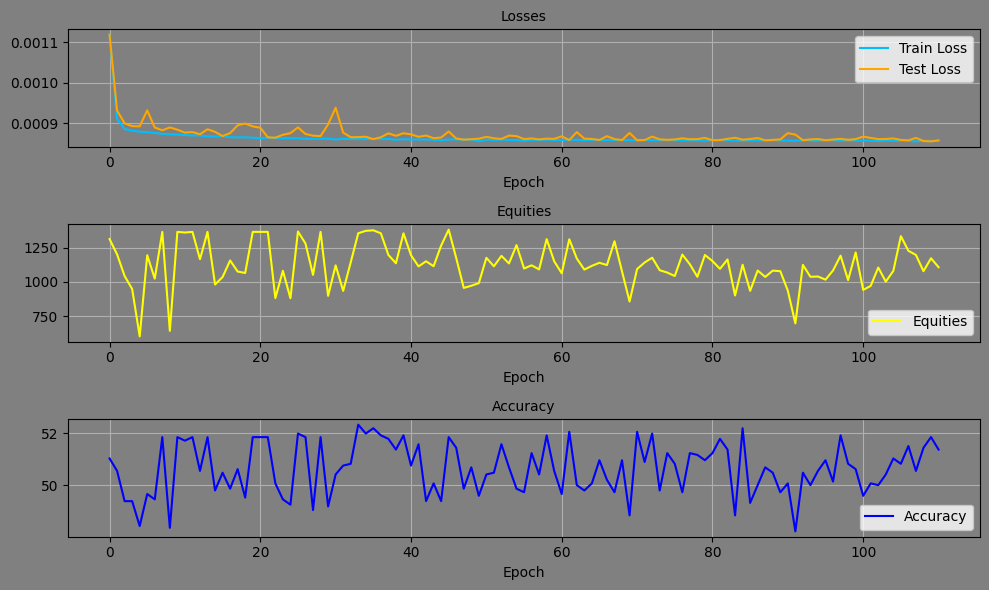

Epoch: 111, Equity: 1060.82, Accuracy: 49.86 train_losses: 0.0020012525374472046, test_losses: 0.0008580663707107306, Duration: 0:00:01.154210


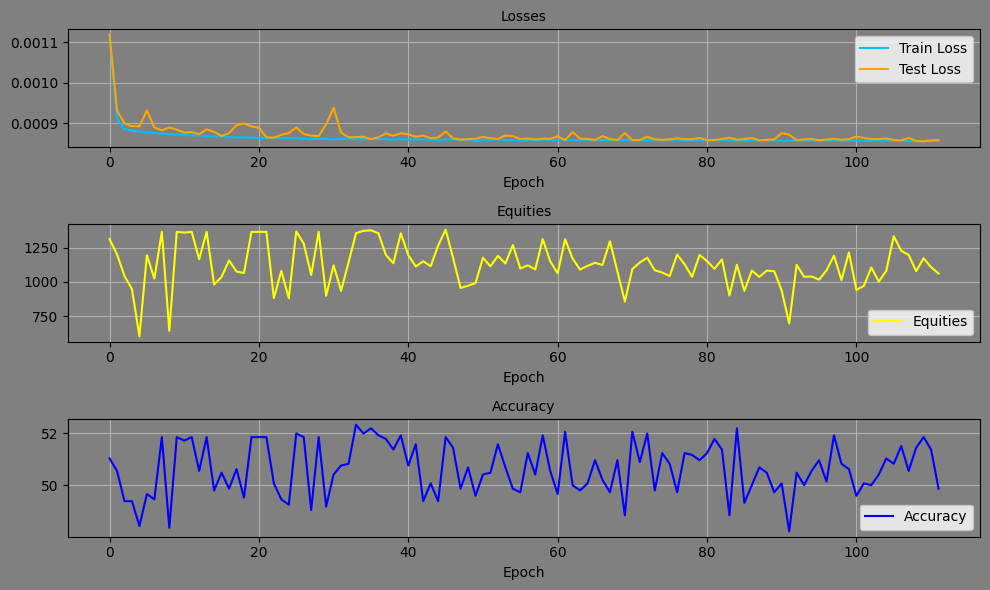

Epoch: 112, Equity: 1169.52, Accuracy: 51.93 train_losses: 0.0019990375597617425, test_losses: 0.0008554626256227493, Duration: 0:00:01.168919


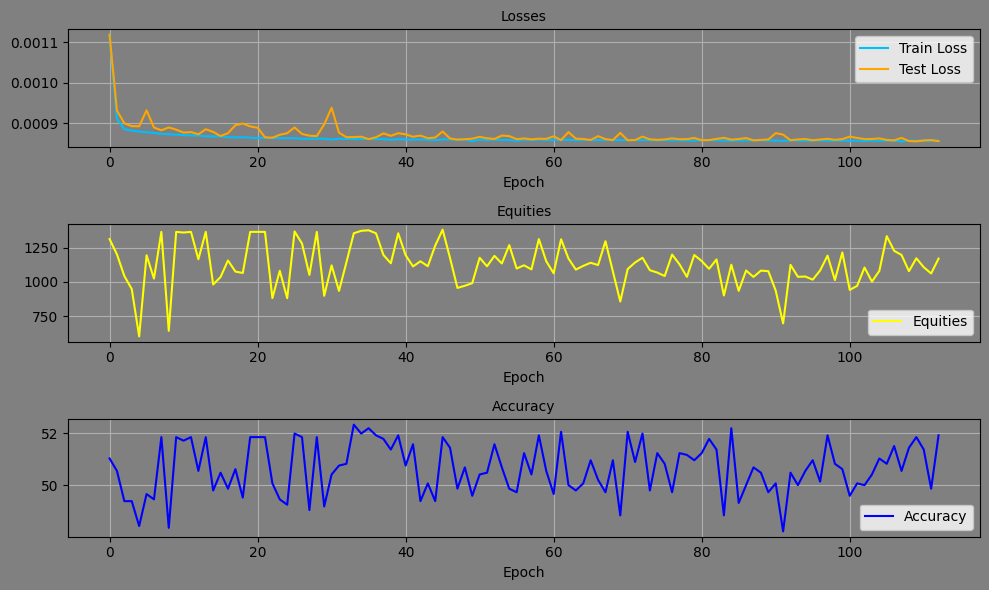

Epoch: 113, Equity: 1213.78, Accuracy: 50.48 train_losses: 0.0019987086160650883, test_losses: 0.0008597703999839723, Duration: 0:00:01.217094


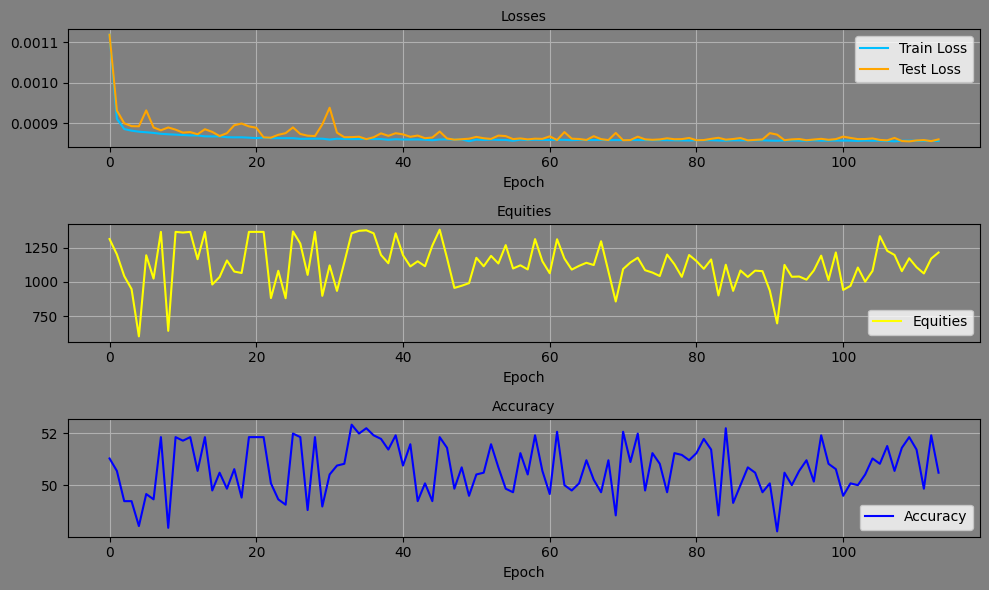

Epoch: 114, Equity: 999.96, Accuracy: 50.00 train_losses: 0.001998851729822295, test_losses: 0.0008654717821627855, Duration: 0:00:01.318362


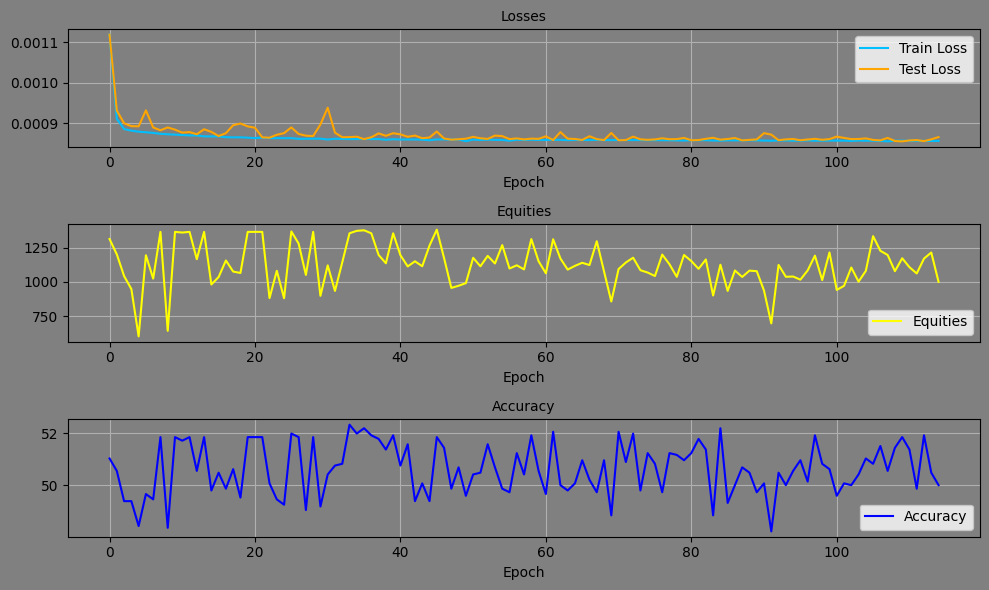

Epoch: 115, Equity: 956.99, Accuracy: 49.38 train_losses: 0.001997198107131627, test_losses: 0.0008603960159234703, Duration: 0:00:01.191546


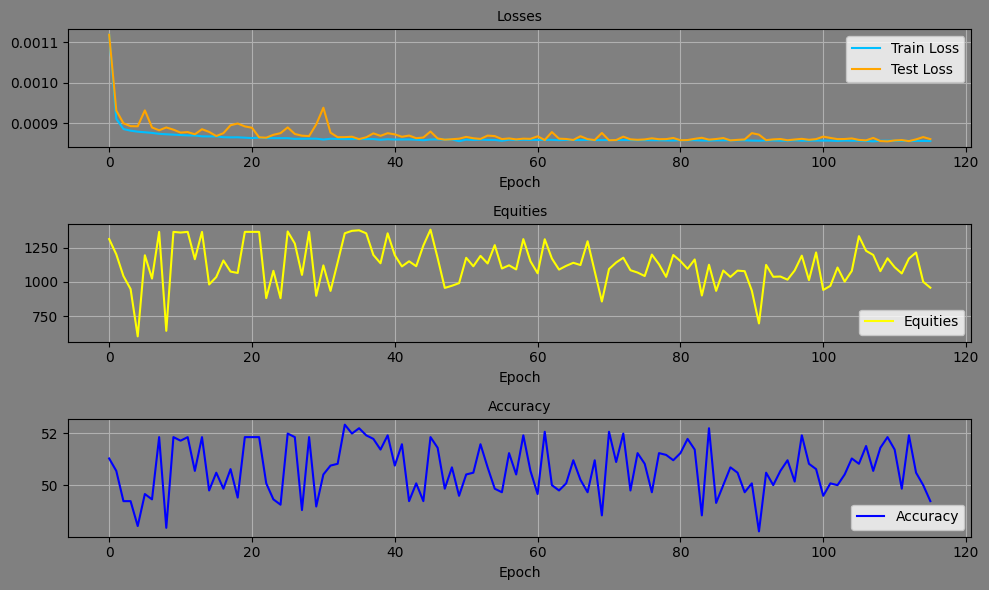

Epoch: 116, Equity: 1176.80, Accuracy: 51.45 train_losses: 0.0019856947303105374, test_losses: 0.0008654873818159103, Duration: 0:00:01.194860


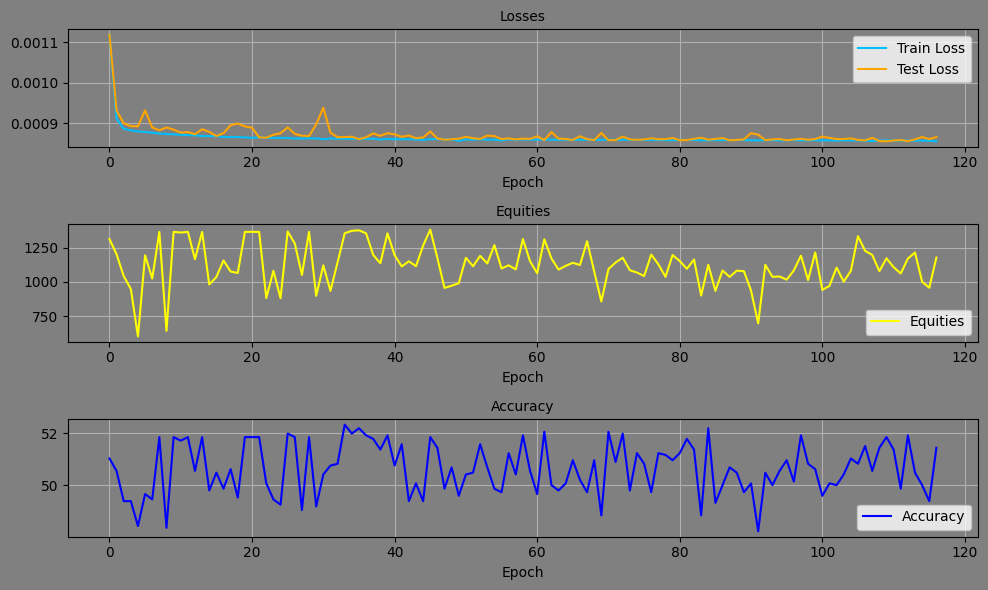

Epoch: 117, Equity: 1045.81, Accuracy: 50.00 train_losses: 0.0019998410770896567, test_losses: 0.0008585845353081822, Duration: 0:00:01.226766


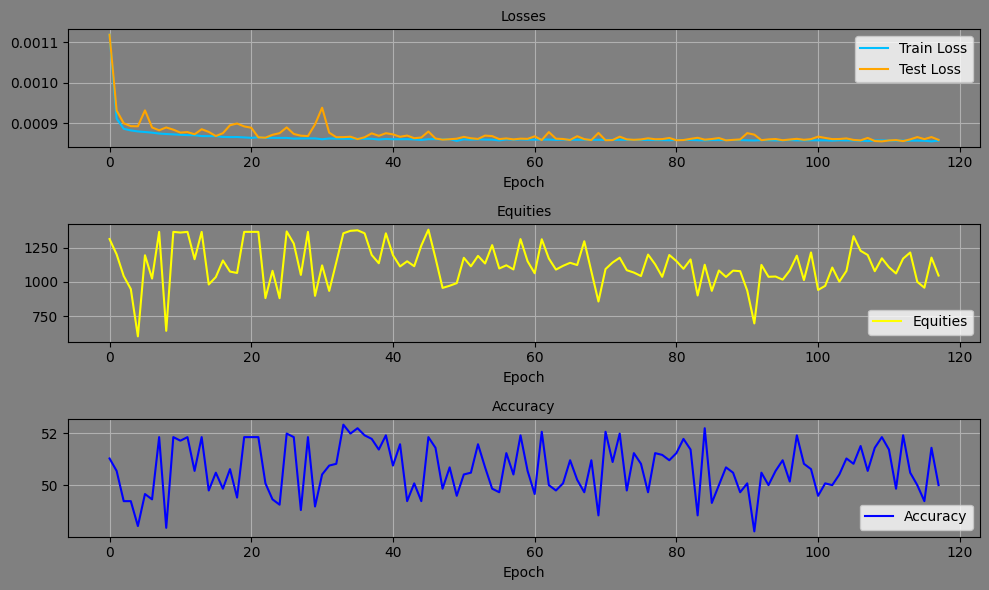

Epoch: 118, Equity: 1120.17, Accuracy: 50.34 train_losses: 0.001999012647821705, test_losses: 0.0008600502042099833, Duration: 0:00:01.165751


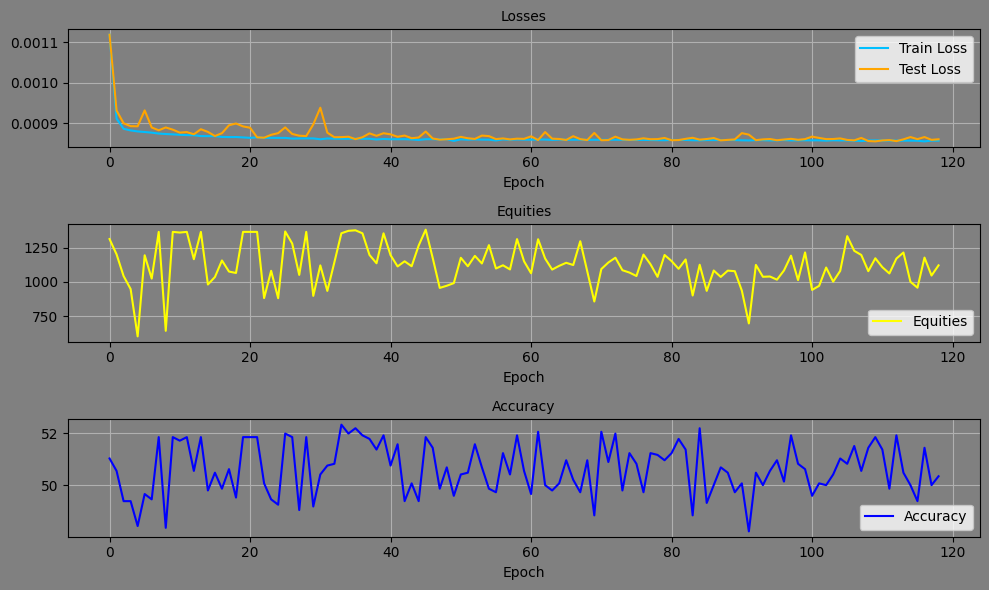

Epoch: 119, Equity: 1113.07, Accuracy: 50.00 train_losses: 0.002001099474456889, test_losses: 0.0008595541003160179, Duration: 0:00:01.304235


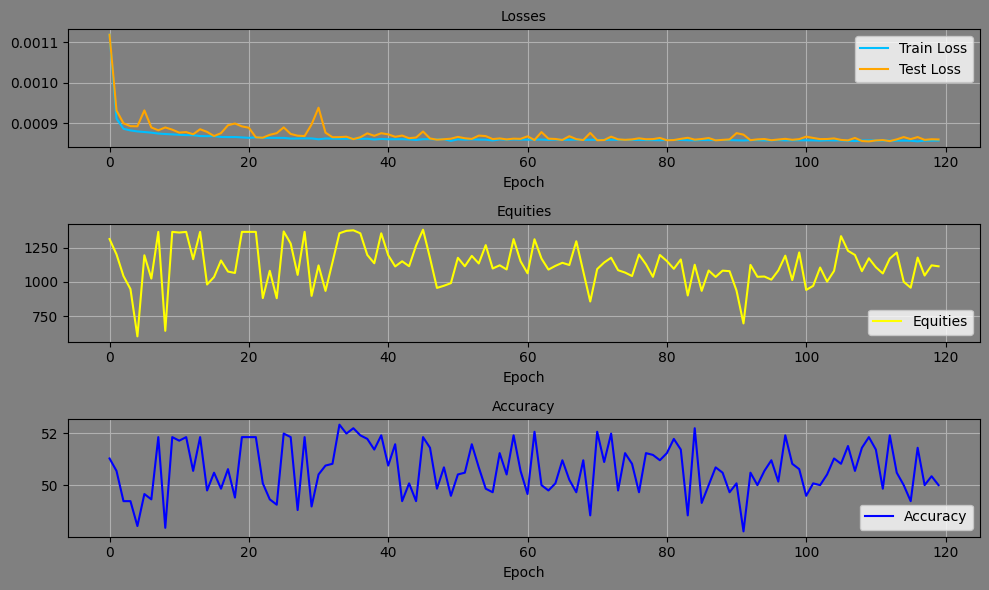

Epoch: 120, Equity: 1148.62, Accuracy: 52.00 train_losses: 0.0019972164769687, test_losses: 0.0008592847152613103, Duration: 0:00:01.283300


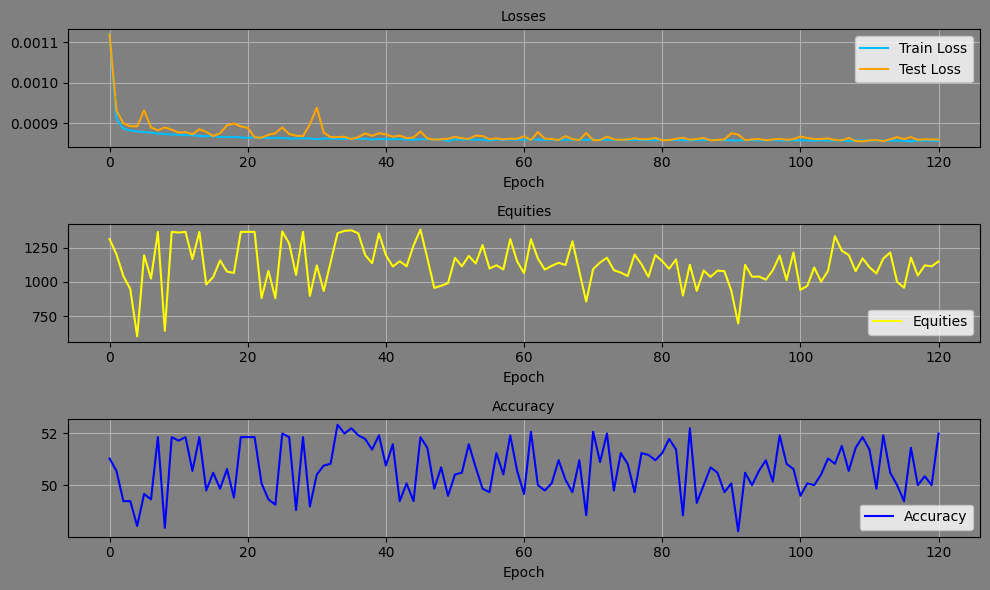

Epoch: 121, Equity: 1310.28, Accuracy: 52.48 train_losses: 0.001995486579188663, test_losses: 0.0008631683886051178, Duration: 0:00:01.141237


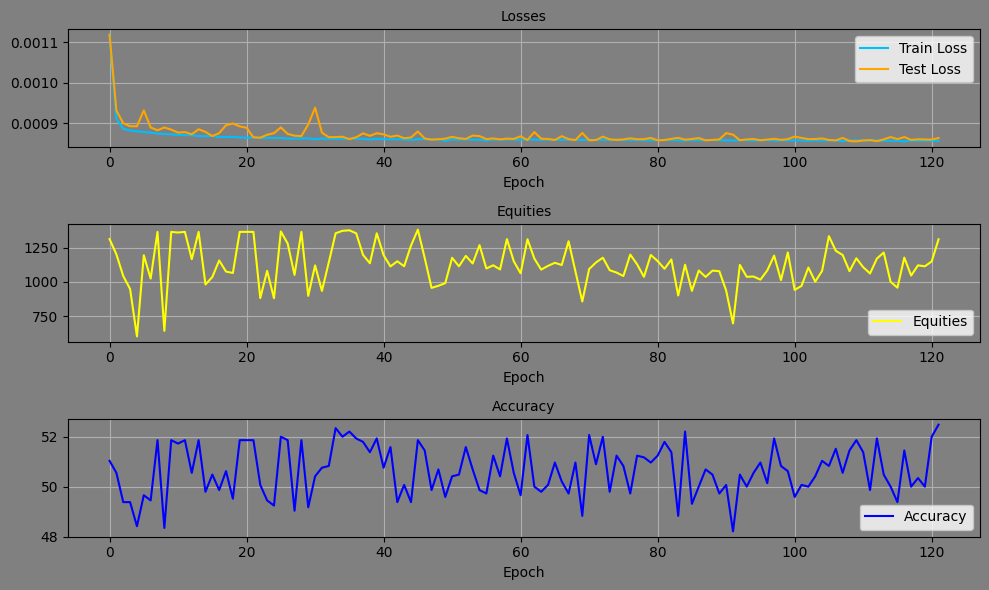

Epoch: 122, Equity: 958.36, Accuracy: 49.59 train_losses: 0.001991246519113747, test_losses: 0.0008637335267849267, Duration: 0:00:01.154638


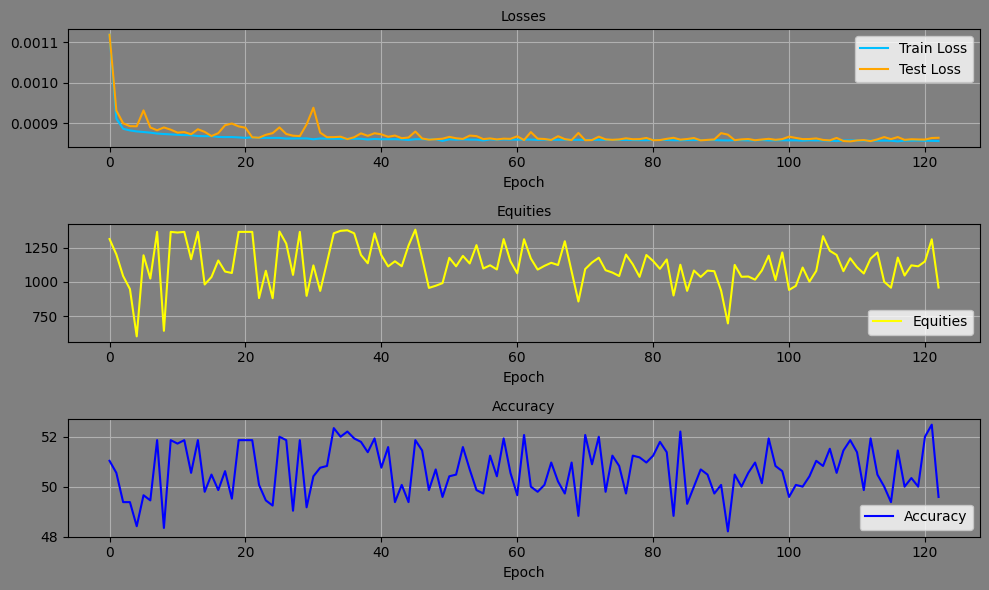

Epoch: 123, Equity: 1239.26, Accuracy: 50.21 train_losses: 0.001990842073822, test_losses: 0.000858341867569834, Duration: 0:00:01.062388


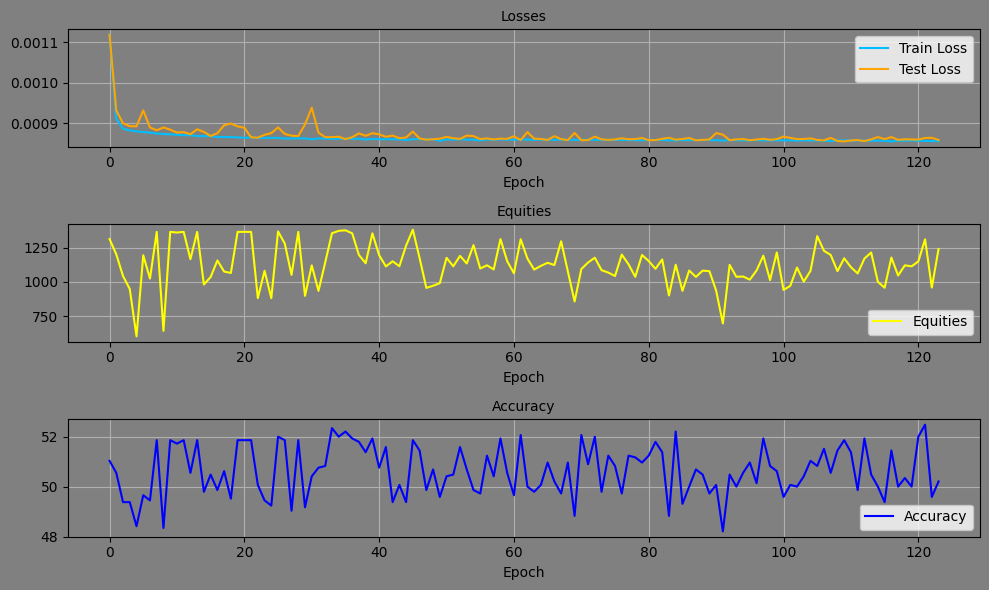

Epoch: 124, Equity: 1147.27, Accuracy: 51.72 train_losses: 0.0019944717626272633, test_losses: 0.0008589040371589363, Duration: 0:00:01.108659


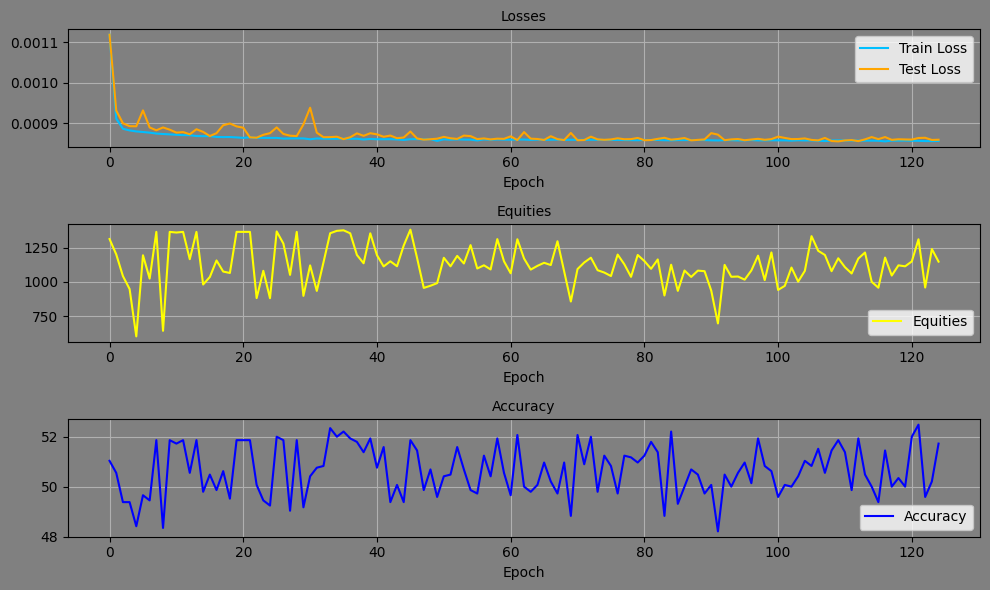

Epoch: 125, Equity: 1062.18, Accuracy: 50.21 train_losses: 0.0019863723226661014, test_losses: 0.0008699059835635126, Duration: 0:00:01.165324


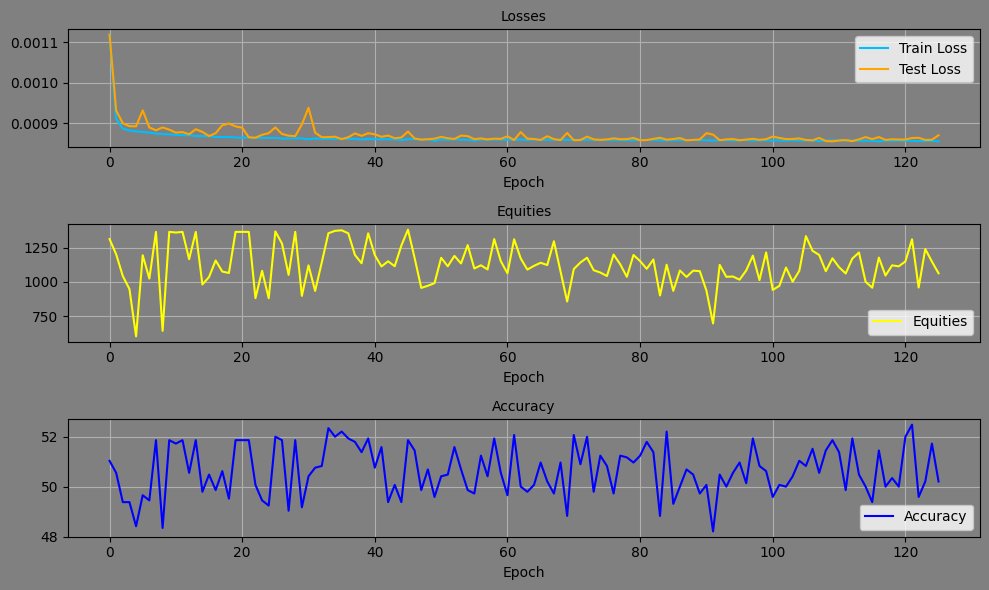

Epoch: 126, Equity: 1146.73, Accuracy: 50.28 train_losses: 0.001994168310756645, test_losses: 0.0008583777234889567, Duration: 0:00:01.140053


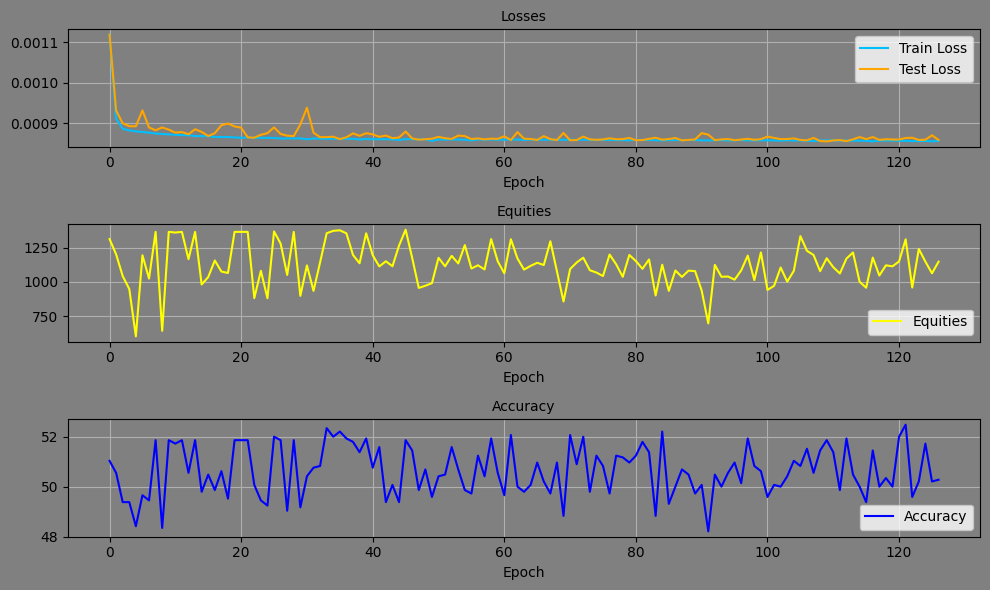

Epoch: 127, Equity: 1291.46, Accuracy: 51.72 train_losses: 0.0019964838799382944, test_losses: 0.0008584492024965584, Duration: 0:00:01.217191


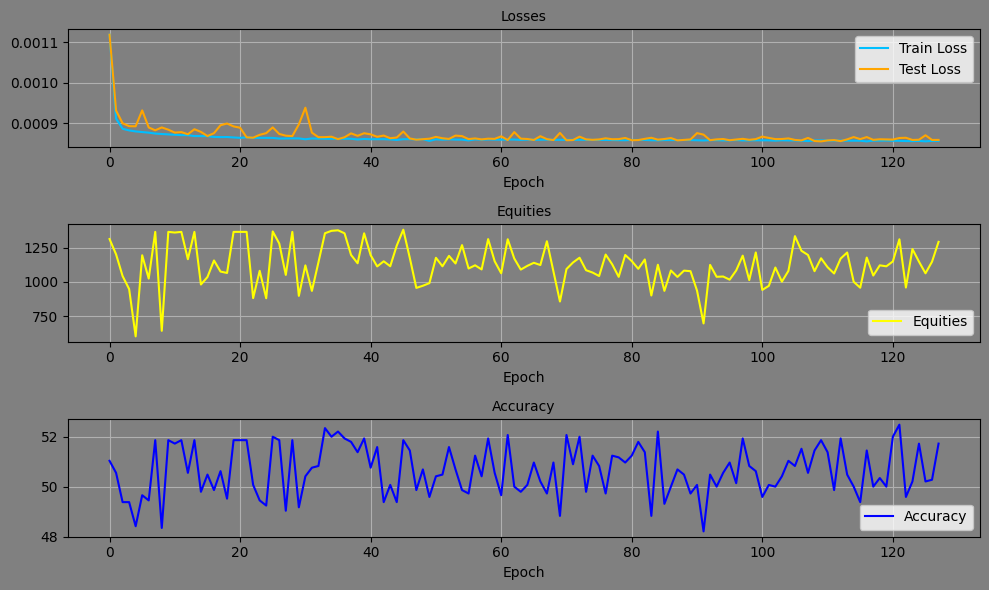

Epoch: 128, Equity: 1172.74, Accuracy: 50.34 train_losses: 0.001993085308093077, test_losses: 0.0008580034482292831, Duration: 0:00:01.123183


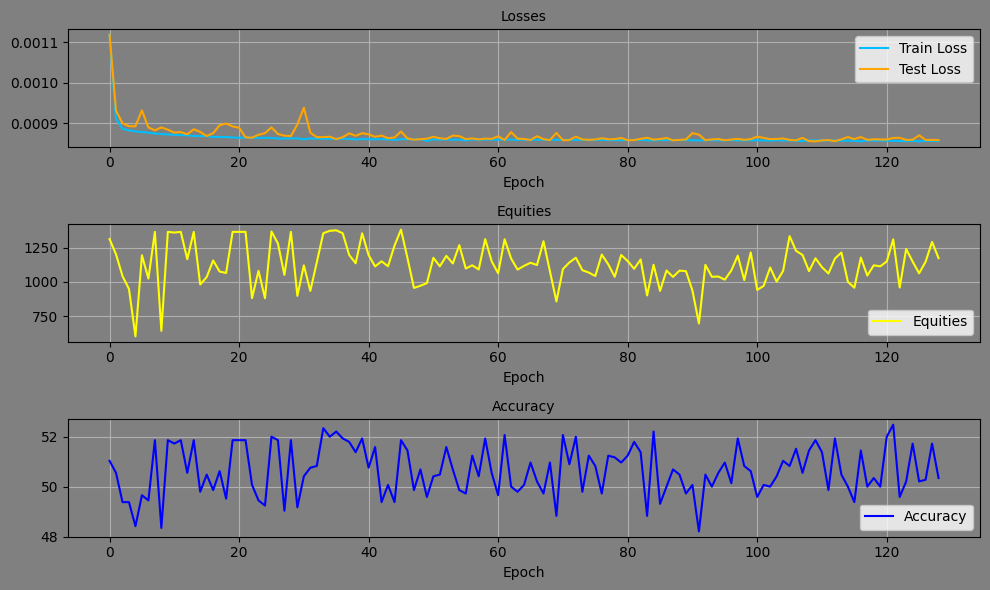

Epoch: 129, Equity: 1181.89, Accuracy: 50.83 train_losses: 0.001994280888754073, test_losses: 0.0008573895320296288, Duration: 0:00:01.072547


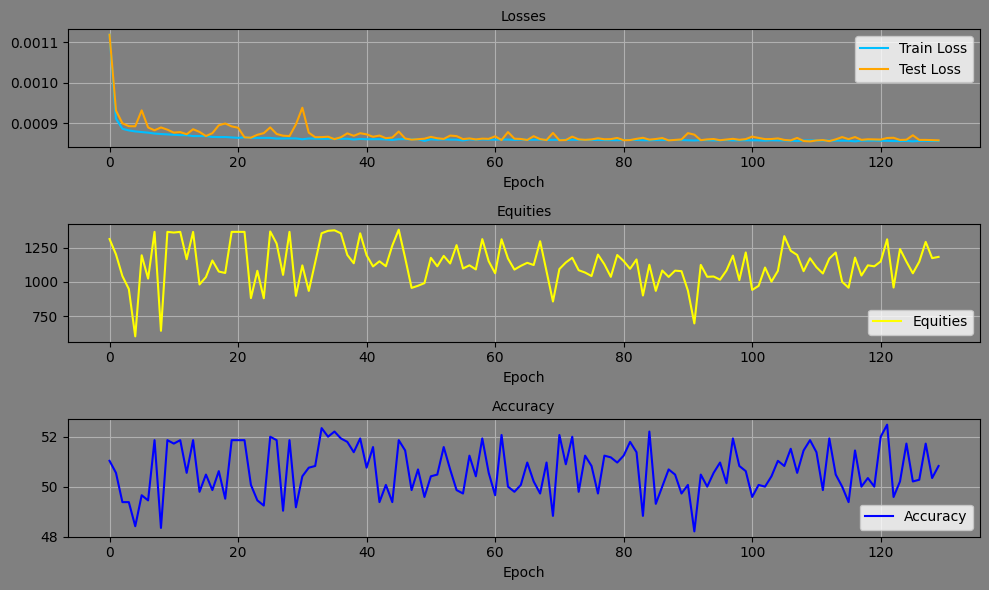

Epoch: 130, Equity: 1207.00, Accuracy: 50.21 train_losses: 0.001986695942448078, test_losses: 0.0008703532512299716, Duration: 0:00:01.029291


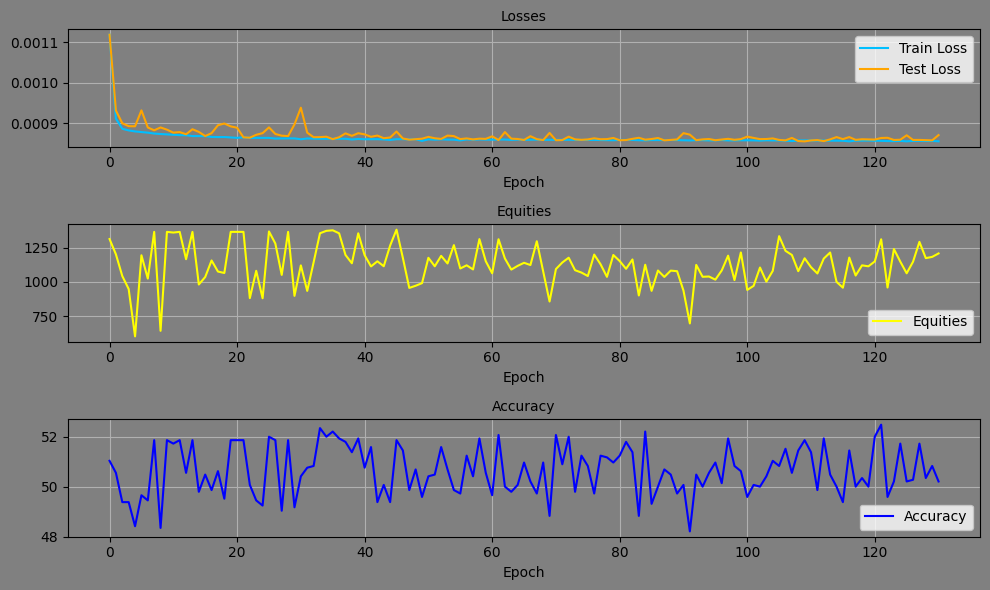

Epoch: 131, Equity: 1063.08, Accuracy: 51.24 train_losses: 0.0019926785351207822, test_losses: 0.0008558427216485143, Duration: 0:00:01.018317


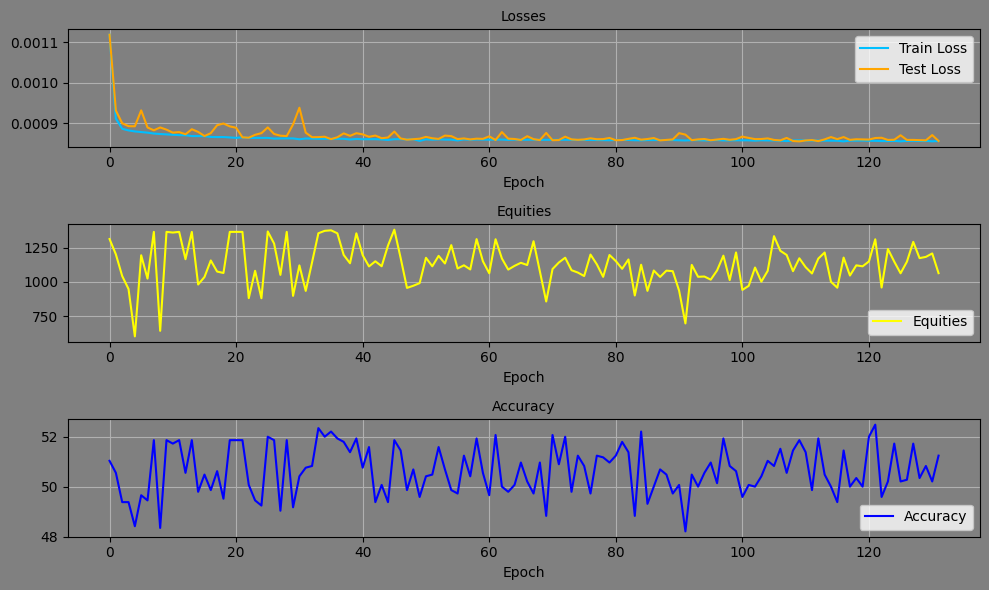

Epoch: 132, Equity: 1144.09, Accuracy: 51.24 train_losses: 0.0019886782886268483, test_losses: 0.0008565496536903083, Duration: 0:00:01.018047


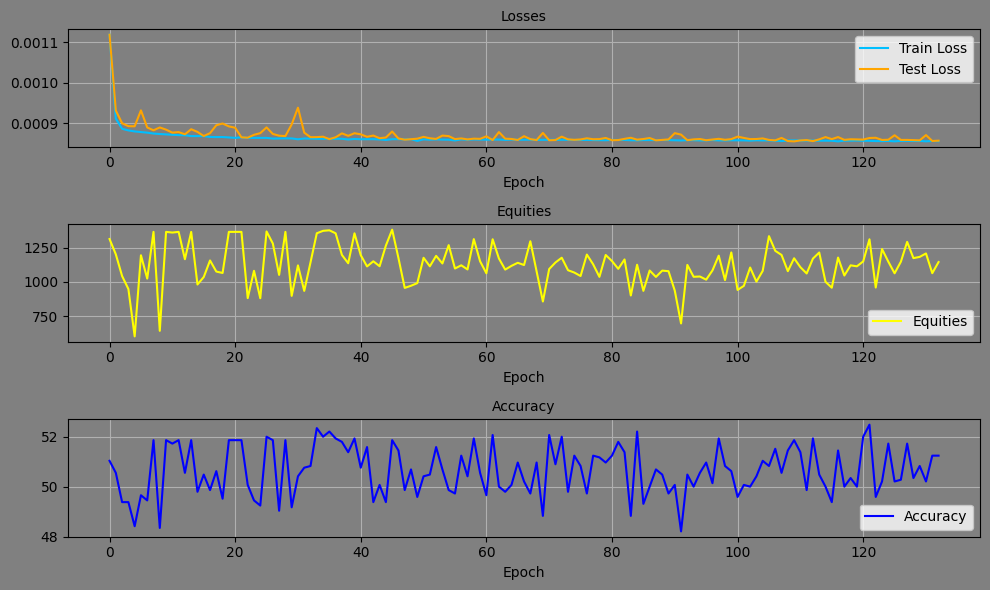

In [ ]:
for epoch in range(epoch, num_epochs):

    # Track duration
    dt0_epoch = datetime.now()

    # Create mini batches
    mini_batches, seed = create_minibatches(X_train, Y_train, batch_size, seed, shuffle=True)

    train_losses_batch = []

    for X_train_batch, Y_train_batch in mini_batches:
        # Set train mode
        model.train()

        # Reset the gradients
        optimizer.zero_grad()

        # Forward propagation
        Y_hat_train = model(X_train_batch) # Shape: (batch_size, num_features)

        # Calculate loss (train)
        train_loss = criterion(Y_hat_train, Y_train_batch)

        # Backprop
        train_loss.backward()

        # Update optimizer
        optimizer.step()

        # Keep track of training losses
        train_losses_batch.append(train_loss.item())

    # Predict on val slice (selection period)
    with torch.no_grad():

        # Set evaluation mode
        model.eval()

        # # Forward propagation
        # Y_pred_val = model(X_val)

        # Forward propagation (chunks)
        while True:
            try:
                # split the test set into chunks
                chunks = 16
                m = m_val // chunks
                
                for j in range(chunks+1):
                    Y_pred_val[m*j:m*j+m] = model(X_val[m*j:m*j+m]) # Forward prop
                
                break

            except Exception as err:
                print(f"Chunks = {chunks} is too large: {err}")
                chunks += 2

        # Calculate test loss
        test_loss = criterion(Y_pred_val, Y_val)

    # Convert 'Y_pred_val' to numpy
    Y_pred_val_cpu = Y_pred_val.detach().cpu().numpy()

    train_losses.append(np.mean(train_losses_batch))
    test_losses.append(test_loss.item())

    # ===================== Backtest =====================
    equities = []    # Store equity (account value) over time
    pos_size = 1000  # Fixed position size ($1000 per trade)
    equity = 1000    # Starting capital
    correct_pred = 0 # Initialize correct prediction

    actions = Y_pred_val_cpu[:, 0] > 0 # Get model's buy/sell predictions

    for i in range(len(X_val)-1):
        curr_open = val_opens[i]   # the price we enter at.
        curr_close = val_closes[i] # the price we exit at.
        curr_action = actions[i]        # the model’s signal (buy or sell).

        # Calculate percentage price change
        pct_change = (curr_close - curr_open) / curr_open

        # Profit or loss in dollars
        pnl = np.abs(pos_size * pct_change)

        # Update equity depending on action and price move
        if curr_action == 1:     # Long position (Buy side)
            if pct_change > 0:
                equity += pnl    # Price up → profit
                correct_pred += 1
            elif pct_change < 0:
                equity -= pnl    # Price down → loss

        elif curr_action == 0:   # Short position
            if pct_change > 0:
                equity -= pnl    # Price up → loss
            elif pct_change < 0:
                equity += pnl    # Price down → profit
                correct_pred += 1

        equities.append(equity) # Save current equity
    # ========================================================

    # Calculate percentage accuracy
    accuracy = correct_pred / len(X_val) * 100

    # Save final equity for each epoch
    equity_epochs.append(equity)
    accuracy_epochs.append(accuracy)

    print(f'Epoch: {epoch}, Equity: {equity:.2f}, Accuracy: {accuracy:.2f} train_losses: {train_losses[-1]}, test_losses: {test_losses[-1]}, Duration: {datetime.now() - dt0_epoch}')

    # Save training process
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_losses': train_losses,
        'test_losses': test_losses,
        'equity_epochs': equity_epochs,
        'accuracy_epochs': accuracy_epochs,
        'seed': seed,
    }, 'training_process')

    if equity > 1200:
        torch.save(model.state_dict(), f"models/eq_{equity:.0f}_ep_{epoch}.pt")

    # Plot training process
    fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(10, 6))
    scaler_testloss = MinMaxScaler(feature_range=(np.min(test_losses)-0.0000000001, np.max(test_losses)))

    # Plot Train Loss and Test Loss
    axs[0].set_title(f"Losses", fontsize=10)
    axs[0].plot(scaler_testloss.fit_transform(np.array(train_losses).reshape(-1,1)), label='Train Loss', color='deepskyblue')
    axs[0].plot(test_losses, label='Test Loss', color='orange')
    axs[0].set_xlabel("Epoch")
    axs[0].legend()
    axs[0].grid()
    # Plot Equities
    axs[1].set_title(f"Equities", fontsize=10)
    axs[1].plot(equity_epochs, label='Equities', color='yellow')
    axs[1].set_xlabel("Epoch")
    axs[1].legend()
    axs[1].grid()
    # Plot Accuracy
    axs[2].set_title(f"Accuracy", fontsize=10)
    axs[2].plot(accuracy_epochs, label='Accuracy', color='blue')
    axs[2].set_xlabel("Epoch")
    axs[2].legend()
    axs[2].grid()
    # Set background color and paper color
    fig.patch.set_facecolor(mcolors.to_hex('grey'))  # Set paper color
    for ax in axs.flat:
        ax.set_facecolor(mcolors.to_hex('grey'))  # Set bg color
    # Display
    plt.tight_layout()
    plt.savefig(f'training_process.png')
    plt.show()
    plt.close()


In [ ]:
import json
import re

split_info = {"train_start": TRAIN_START, "train_end": TRAIN_END, "val_end": VAL_END, "total_rows": total_rows}
with open(ARTIFACTS / "split_info.json", "w", encoding="utf-8") as f:
    json.dump(split_info, f, indent=2)

with open(ARTIFACTS / "scalers.pkl", "wb") as f:
    pickle.dump(train_scalers, f)

models_dir = Path("models").resolve()
pt_files = []
for fname in os.listdir(models_dir):
    if not fname.endswith(".pt"):
        continue
    m = re.match(r"^eq_(\d+)_ep_", fname)
    if not m:
        continue
    eq = float(m.group(1))
    rel_path = os.path.relpath(str(models_dir / fname), str(CNN_ROOT)).replace(os.sep, "/")
    pt_files.append((eq, rel_path))

pt_files.sort(key=lambda x: -x[0])
top3 = [p for _, p in pt_files[:3]]

manifest_path = ARTIFACTS / "manifest.json"
manifest = {}
if manifest_path.is_file():
    with open(manifest_path, "r", encoding="utf-8") as f:
        manifest = json.load(f)
manifest[ARCH_MANIFEST_KEY] = top3
with open(manifest_path, "w", encoding="utf-8") as f:
    json.dump(manifest, f, indent=2)

print("Written:", ARTIFACTS / "split_info.json", ARTIFACTS / "scalers.pkl", manifest_path)
print("manifest key:", ARCH_MANIFEST_KEY, "top3:", top3)

